In [318]:
# Import Libraries
from msc_code.scripts.notebook_setup import *

# Define directories
REPORT_RAW_DATA_DIR = os.path.join(RAW_DATA_DIR, 'final_report')
REPORT_PROC_DATA_DIR = os.path.join(PROC_DATA_DIR, 'final_report')
REPORT_DIR = os.path.join(OUTPUT_DIR, 'reports', 'final_report')
REPORT_FIGURES_DIR = os.path.join(REPORT_DIR, 'figures')
SECTIONS_DIR = os.path.join(REPORT_DIR, 'sections')
DATA_DIR = os.path.join(REPORT_DIR, 'data')
TABLES_DIR = os.path.join(REPORT_DIR, 'tables')

directories = [REPORT_RAW_DATA_DIR,
               REPORT_PROC_DATA_DIR,
               REPORT_DIR,
               REPORT_FIGURES_DIR,
               SECTIONS_DIR,
               DATA_DIR,
               TABLES_DIR]

# Check directories exist, if not, create them.
for directory in directories:
    if not os.path.isdir(directory):
        os.makedirs(directory, exist_ok=True)
        with open(path, 'w') as f:
            pass
        print(f"Created: {directory}")
    else:
        print(f"Already exists: {directory}")

Already exists: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/input/raw_data/final_report
Already exists: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/input/processed_data/final_report
Already exists: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report
Already exists: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/figures
Already exists: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections
Already exists: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/data
Already exists: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/tables


## Data Gathering

### Database Searches

In [319]:
# define data dictionary to store search results in
data = {}

# import dataframes into data dictionarY
data["pubmed"] = pd.read_csv("/".join([REPORT_RAW_DATA_DIR, "database_search_pubmed.csv"]))          # PubMed
data["embase"] = pd.read_csv("/".join([REPORT_RAW_DATA_DIR, "database_search_embase.csv"]))          # Embase
data["cochrane"] = pd.read_csv("/".join([REPORT_RAW_DATA_DIR, "database_search_cochrane.csv"]))      # Cochrane
data["wos"] = pd.read_excel("/".join([REPORT_RAW_DATA_DIR, "database_search_wos.xls"]))              # WOS
data["scopus"] = pd.read_csv("/".join([REPORT_RAW_DATA_DIR, "database_search_scopus.csv"]))          # SCOPUS        
data["psycinfo"] = pd.read_csv("/".join([REPORT_RAW_DATA_DIR, "database_search_psycinfo.csv"]))      # PyscINFO

# define desired column headers for later extraction to final dataframe
desired_columns = [
    "Publication Year",
    "First Author",
    "Authors",
    "Publication Title",
    "Title",
    "Abstract",
    "DOI",
    "Database"
]

# PubMed
# rename pubmed dataframe columns to fit desired column headers 
data["pubmed"].rename(columns={     # rename columns
    "Abstract Note": "Abstract",    # rename 'Abstract Note' as 'Abstract'
    "Key": "PMID",                  # rename 'Key' as 'PMID'
    "Author": "Authors"             # rename 'Author' as 'Authors'
}, inplace=True)                    # keep changes in place on original dataframe

# create first author column formatted as Surname, F.
data["pubmed"]["First Author"] = (
    data["pubmed"]["Authors"]
    .fillna("")                     # Replace NaN with an empty string
    .str.split(";")                 # Split multiple authors by ';'
    .str[0]                         # Take the first author
    .str.strip()                    # Remove leading/trailing spaces
    .apply(lambda name: f"{name.split()[0]} {name.split()[1][0]}." if len(name.split()) > 1 else name)
)   # format final First Author string as Surname, F.


# Embase
# Rename embase dataframe columns to fit desired column headers
data["embase"].rename(columns={             # rename columns
    "Medline PMID": "PMID",                 # 'Medline PMID' as 'PMID'
    "Source title": "Publication Title",    # 'Source title' as 'Publication Title'
    "Author Names": "Authors"               # 'Author Names' as 'Authors'
}, inplace=True)    

# create first author column formatted as Surname, F.
data["embase"]["First Author"] = (
    data["embase"]["Authors"]
    .fillna("")  # Replace NaN with an empty string
    .str.split(";")  # Split multiple authors by ';'
    .str[0]  # Take the first author
    .str.strip()  # Remove leading/trailing spaces
    .apply(
        lambda name: f"{name.split()[0]}, {name.split()[1][0]}." 
        if len(name.split()) > 1 else name
    )   # format final First Author string as Surname, F.
    .str.rstrip(",")  # Remove trailing commas if present
)


# Web of Science
# Rename Web of Science columns to fit desired column headers
data["wos"].rename(columns={                # rename columns
    "Pubmed Id": "PMID",                    # 'Pubmed Id' as 'PMID'
    "Article Title": "Title",               # 'Article Title' as 'Title'
    "Source Title": "Publication Title"     # 'Source Title' as 'Publication Title'
}, inplace=True)                            # Save changes in place on original dataframe

# create first author column formatted as Surname, F.
data["wos"]["First Author"] = (
    data["wos"]["Authors"]
    .fillna("")  # Replace NaN with an empty string
    .str.split(";")  # Split multiple authors by ';'
    .str[0]  # Take the first author
    .str.strip()  # Remove leading/trailing spaces
    .apply(
        lambda name: f"{name.split()[0]} {name.split()[1][0]}." 
        if len(name.split()) > 1 else name
    )   # format final First Author string as Surname, F.
    .str.rstrip(",")  # Remove trailing commas if present
)


# rename Scopus columns to fit desired column headers
data["scopus"].rename(columns={
    "Year": "Publication Year",
    "PubMed ID": "PMID",
    "Source title": "Publication Title"
}, inplace=True)

# create first author column formatted as Surname, F.
data["scopus"]["First Author"] = (
    data["scopus"]["Authors"]
    .fillna("")  # Replace NaN with an empty string
    .str.split(";")  # Split multiple authors by ';'
    .str[0]  # Take the first author
    .str.strip()  # Remove leading/trailing spaces
    .apply(
        lambda name: f"{name.split()[0]}, {name.split()[1][0]}." 
        if len(name.split()) > 1 else name
    )
    .str.rstrip(",")  # Remove trailing commas if present
)


# Rename PsycINFO column headers to fit desired column headers.
data['psycinfo'].rename(columns={           # rename columns
    "Abstract Note": "Abstract",            # 'Abstract Note' as 'Abstract'
    "Author": "Authors"                     # 'Author' as 'Authors'
}, inplace=True)                            # save changes in place on original dataframe.

# Create first author column formatted as Surname, F.
data["psycinfo"]["First Author"] = (      
    data["psycinfo"]["Authors"]
    .fillna("")  # Replace NaN with an empty string
    .str.split(";")  # Split multiple authors by ';'
    .str[0]  # Take the first author
    .str.strip()  # Remove leading/trailing spaces
    .apply(
        lambda name: f"{name.split()[0]} {name.split()[1][0]}." 
        if len(name.split()) > 1 else name
    )   # format final First Author string as Surname, F.
    .str.rstrip(",")  # Remove trailing commas if present
)


# Rename cochrane columns to fit desired column headers
data["cochrane"].rename(columns={           # Rename columns
    "Year": "Publication Year",             # 'Year' as 'Publication Year'
    "Source": "Publication Title",          # 'Source' as 'Publication Title'
    "Author(s)": "Authors"                  # 'Author(s) as 'Authors'
}, inplace=True)                            # in place on original dataframe

# create first author column formatted as Surname, F.
data["cochrane"]["First Author"] = (
    data["cochrane"]["Authors"]
    .fillna("")  # Replace NaN with an empty string
    .str.split(";")  # Split multiple authors by ';'
    .str[0]  # Take the first author
    .str.strip()  # Remove leading/trailing spaces
    .apply(
        lambda name: f"{name.split()[0]} {name.split()[1][0]}." 
        if len(name.split()) > 1 else name
    )   # format final First Author string as Surname, F.
    .str.rstrip(",")  # Remove trailing commas if present
)


# Add database column to each dataframe
for key, df in data.items():
    if key == "pubmed":
        df['Database'] = "PubMed"
    elif key == "embase":
        df['Database'] = "Embase"
    elif key == "cochrane":
        df['Database'] = "Cochrane"
    elif key == "wos":
        df['Database'] = "Web of Science"
    elif key == "scopus":
        df['Database'] = "SCOPUS"
    elif key == "psycinfo":
        df['Database'] = "PsycINFO"
    else:
        df['Database'] = "Unknown"


extracted_data = [] # create list in which to store extracted data.
for database, df in data.items():       # iterate through each database and corresponding dataframe in data dictionary
    extracted_df = df[desired_columns]  # select predefined desired columns from selected dataframe and extract to new dataframe.
    extracted_data.append(extracted_df) # append the extracted dataframe to a the list of extracted data.

# Combine/concatinate all extracted DataFrames in extracted_data list into a single DataFrame called final_df (dataframe)
final_df = pd.concat(extracted_data, ignore_index=True)

# Ensure that no rows/papers are lost by countingfinal

# calculate the number of papers before dataframes were
preextraction_paper_count = 0               # define variable pre-extraction paper count and set to 0.
for database, df in data.items():           # iterate through each database and corresponding dataframe in data dictionary
    preextraction_paper_count += len(df)    # add the length of selected dataframe to the pre-extraction count

# Calculate number of papers after concantination of desired columns from database dataframes.
postextraction_paper_count = len(final_df)  # postextraction_paper_count = length of the final dataframe.


# Reformat some journal information to aid removal of duplicates

# fix capitalisation in Publication Title column
final_df['Publication Title'] = final_df['Publication Title'].str.title()

# sort by publication year, then first author
final_df = final_df.sort_values(by=["Publication Year", "First Author"]).reset_index(drop=True)

# titlise first author column
final_df["First Author"] = final_df["First Author"].str.title()

# strip full stops from end of journal titles
final_df["Title"] = (
    final_df["Title"]
        .str.strip(".")
        .str.replace(r"[()\[\]{}]", "", regex=True)
        .str.capitalize()
)

# remove word the from beginning of journal titles
final_df["Publication Title"] = final_df["Publication Title"].str.replace(r"^The\s+", "", regex=True)

# reformat DOI to lower case
final_df["DOI"] = final_df["DOI"].str.lower()

pre_duplicate_removal_count = len(final_df)

# Export complete initial database search results, before duplicate removal
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'database_search_results_initial.csv')
final_df.to_csv(export_path)

# Count initial database counts for PRISMA diagram
initial_database_counts = final_df['Database'].value_counts().reset_index()
initial_database_counts.columns = ['Database', 'Count']

# Database counts
database_counts = pd.DataFrame({
    'Database': list(data.keys()),                  # Database label
    'Count': [len(df) for df in data.values()]      # Count is the length of each dataframe 
})

# reorder by count descending
database_counts = database_counts.sort_values(by='Count', ascending=False)

# Fix capitalisation of Database names
database_counts.loc[0, 'Database'] = 'PubMed'
database_counts.loc[1, 'Database'] = 'Embase'
database_counts.loc[2, 'Database'] = 'Cochrane'
database_counts.loc[3, 'Database'] = 'WoS'
database_counts.loc[4, 'Database'] = 'SCOPUS'
database_counts.loc[5, 'Database'] = 'PsycINFO'

# display
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'database_search_counts_initial.csv')
database_counts.to_csv(export_path, index=False)


# Define comparison_columns to compare when assessing for duplicates.
comparison_columns=["Publication Year", "First Author", "Publication Title", "Title", "DOI"] # define comparison columns to compare duplicates against.

# find duplicates by comparison columns
dupes_by_comparison = final_df[final_df.duplicated(subset=comparison_columns, keep="first")]

# remove them from final_df
final_df = final_df.drop_duplicates(subset=comparison_columns, keep="first")

# find duplicates by DOI (after previous step)
dupes_by_doi = final_df[final_df.duplicated(subset="DOI", keep="first")]

# remove them from final_df
final_df = final_df.drop_duplicates(subset="DOI", keep="first")

# combine both sets of duplicates into a new df
database_search_results_duplicates = pd.concat([dupes_by_comparison, dupes_by_doi], ignore_index=True)

# Count number of results left after duplicates removed
post_duplicate_removal_count = len(final_df)

# Calculate number of duplicates removed
database_duplicates_removed_count = len(database_search_results_duplicates)

print(f"Duplicates removed: {database_duplicates_removed_count}") # Print result

# Create dataframe of number of duplicates removed to export to CSV for use with PRISMA flow chart.
duplicates_removed_df = pd.DataFrame([{
    "Reason": "Duplicate records removed\n",
    "Count": database_duplicates_removed_count
}])

# Export to CSV
database_search_results_duplicates.to_csv("/".join([REPORT_PROC_DATA_DIR, "database_search_results_duplicates.csv"]), index=False)
final_df.to_csv('/'.join([REPORT_PROC_DATA_DIR, "database_search_results_no_duplicates.csv"]))

final_database_counts = final_df['Database'].value_counts().reset_index(name='Count')

# Add three blank columns titled "Exclude", "Reason Num" and "Reason" to final_df for export as csv
final_df["Exclude"] = None      # Add blank "Exclude" column
final_df["Reason ID"] = None    # Add blank "Reason ID" column
final_df["Reason"] = None       # Add blank "Reason" column

# Export to csv for title abstract screening
final_df.to_csv("/".join([REPORT_PROC_DATA_DIR, "database_search_title_abstract_screen_start.csv"]), index=False)

Duplicates removed: 313


In [320]:
# create dictionary to store search query and results in for ease of reference later.
# results_dict = {}

# Query One
# query_one =  '("foreign obj*" OR "foreign bod*")' 
# Run search
# results_one = search_google_scholar(query_one, SERP_API_KEY)
# Add results to dictionary
# results_dict = append_google_scholar_results_to_dictionary(query_one, results_one, results_dict)

# Query Two
# query_two = """
#            ("foreign obj*" OR "foreign bod*")
#            AND
#            ("intent*" OR "deliberate*" OR "purpose*" OR "self-injur*" OR "selfharm*" OR "self-harm*")
#            """
# Run search
# results_two = search_google_scholar(query_two, SERP_API_KEY)
# Add results to dictionary
# results_dict = append_google_scholar_results_to_dictionary(query_two, results_two, results_dict)

# Query Three
# query_three = """
#             ("foreign obj*" OR "foreign bod*")
#             AND
#             ("intent*" OR "deliberate*" OR "purpose*" OR "self-injur*" OR "selfharm*" OR "self-harm*")
#             AND
#             ("ingest*" OR "swallow*")
#             """
# Run search
# results_three = search_google_scholar(query_three, SERP_API_KEY)
# Add results to dictionary
# results_dict = append_google_scholar_results_to_dictionary(query_three, results_three, results_dict)

# Query Four
# Define google scholar query
# query_four = """
#            ("foreign obj*" OR "foreign bod*")
#            AND
#            ("intent*" OR "deliberate*" OR "purpose*" OR "self-injur*" OR "selfharm*" OR "self-harm*")
#            AND
#            ("ingest*" OR "swallow*"))
#            AND
#            ("surg*" OR "endoscop*" OR "EGD" OR "OGD" OR "Esophagogastroduodenoscopy" OR "Oesophagogastroduodenoscopy" OR "manag*")"
#            """
# Run search
# results_four = search_google_scholar(query_four, SERP_API_KEY)
# Add results to dictionary
# results_dict = append_google_scholar_results_to_dictionary(query_four, results_four, results_dict)

In [321]:
# Show number of results for each query and store in dataframe
# results_summary = create_search_query_summary(results_dict)

# export queries and associated results count to review with supervisor.
# export_search_result_summary_to_csv(results_summary, os.path.join(*[REPORT_RAW_DATA_DIR]))

# Export each search result dataframe to CSV
# export_search_results_to_csvs(results_dict, RAW_PROC_DATA_DIR)

In [322]:
# import google_df from previously exported csv
google_df = pd.read_csv("/".join([REPORT_RAW_DATA_DIR, "google_scholar_results_2.csv"]))

google_df['First Author'] = google_df['First Author'].str.title() # clean first author names
google_df['Publication Title'] = google_df['Publication Title'].str.title() 
google_df['Title'] = google_df['Title'].str.title()
google_df['URL'] = google_df['URL'].str.lower()

google_start_count = len(google_df)

In [323]:
# Remove duplicates
start_count = len(google_df)
google_df = google_df.drop_duplicates(subset=google_df.columns, keep='first')
end_count = len(google_df)

google_duplicates_removed_count = end_count - start_count

print(f"{google_duplicates_removed_count} duplicates were removed at this stage.")

# Export for title abstract screen
google_df.to_csv(os.path.join(REPORT_PROC_DATA_DIR, "google_scholar_title_abstract_screen_start.csv"))

0 duplicates were removed at this stage.


In [324]:
# Import google scholar and database search data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'google_scholar_title_abstract_screen_end.csv')
google_df = pd.read_csv(import_path)

import_path = os.path.join(REPORT_RAW_DATA_DIR, 'database_search_title_abstract_screen_end.csv')
database_df = pd.read_csv(import_path)

google_duplicate_count = len(google_df[google_df['Duplicate'] == True])
google_duplicate_count

3

In [325]:
# Merge all Google Scholar and Database search results
all_df = pd.merge(
    database_df, google_df,
    how='outer',
    on=["Publication Year", "First Author", "Authors", "Publication Title",
        "Title", "Abstract", "Database", "Exclude", "Reason ID", "DOI"])

# Specify Desired Column Order
desired_column_order = ["Publication Year", "First Author", "Authors", 
                        "Publication Title", "Summary", "Database", "DOI", 
                        "URL", "Title", "Abstract", "Abstract2", "Exclude", 
                        "Reason ID"]

# Apply to dataframe
all_df = all_df[desired_column_order]

# Fix capitalisation on of fields
desired_cols = ['Title', 'First Author', 'Authors', 'Abstract']
for col in desired_cols:
    all_df[col].str.title()

# Sort by Publication Year ascending.
all_df = all_df.sort_values(by="Publication Year", ascending=True).reset_index(drop=True)

# Count number of records screened for prisma diagram
records_screened_count = len(all_df) - 3

In [326]:
all_df['Database'].value_counts()

Database
PubMed            258
Google Scholar    135
Web of Science     65
Cochrane           14
SCOPUS             12
Embase              9
PsycINFO            2
Name: count, dtype: int64

In [327]:
# Generate Unique Study_ID
all_df.index.name = 'Study_ID'

# Export all JGE title and abstract reviewed articles
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'ta_review_start_jge.csv')
all_df.to_csv(export_path)

# Create clean dataframe to export for other author review
clean_df = all_df.copy()

# Remove reasons for exlusion and previously marked exclusions for clean export and second author review.
clean_df['Exclude'] = None
clean_df['Reason ID'] = None

# Export to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'ta_review_clean.csv')
clean_df.to_csv(export_path)

# Create sample of 10% of papers for second author (MS) review
clean_sample_df = create_results_sample(clean_df, 0.1, 42) # '42' argument specificies random number to great sample from

ta_ms_sample_size = len(clean_sample_df)

# export clean data to raw data directory as ms_title_abstract review start.csv
# clean_sample_df.to_csv("/".join([PROC_DATA_DIR, "title_abstract_review", "ta_review_ms_start.csv"]))

Given sample size: 495
Calculating desired sample size... 10% of 495 = 50
Creating Sample Dataframe


In [328]:
# Import second author (MS) Title Abstract Review Data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'ta_review_end_ms.csv')
ms_reviewed_df = pd.read_csv(import_path)

# Import title and abstract review results from JGE.
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'ta_review_end_jge.csv')
jge_reviewed_df = pd.read_csv(import_path)

# Rename columns before merge with second author (MS) review data.
jge_reviewed_df = jge_reviewed_df.rename(columns={
    'Exclude': 'Exclude_JGE',
    'Reason ID': 'Reason ID_JGE'
})

# Drop columns in ms_reviewed_df that are redundant in jge_reviewed_df (except for columns to add)
ms_reviewed_df = ms_reviewed_df[['Study_ID', 'Exclude', 'Reason ID']]

# Rename columns in the reviewed dataset
ms_reviewed_df.rename(columns={
    'Exclude': 'Exclude_MS', 
    'Reason ID': 'Reason ID_MS'
    }, 
    inplace=True
)

# Merge the datasets rightwards, so only papers review by MS and JGE are together.
jge_ms_reviewed_df = pd.merge(jge_reviewed_df, ms_reviewed_df, on='Study_ID', how='right')

In [329]:
# Calculate agreement
jge_ms_agree = jge_ms_reviewed_df[jge_ms_reviewed_df['Exclude_JGE'] == jge_ms_reviewed_df['Exclude_MS']]
print(f"JGE and MS agree on {len(jge_ms_agree)}/{len(jge_ms_reviewed_df)} results reviewed by MS.")

# Calculate disagreement
jge_ms_disagree = jge_ms_reviewed_df[jge_ms_reviewed_df['Exclude_JGE'] != jge_ms_reviewed_df['Exclude_MS']]
print(f"JGE and MS disagree on {len(jge_ms_disagree)}/{len(jge_ms_reviewed_df)} results reviewed by MS.")

# Export to CSV
jge_ms_agree.to_csv("/".join([REPORT_PROC_DATA_DIR, 'ta_review_agree_jge_ms.csv']), index=False)
jge_ms_disagree.to_csv("/".join([REPORT_PROC_DATA_DIR, 'ta_review_disagree_jge_ms.csv']), index=False)

# Import Cohen's Kappa from scikit-learn
from sklearn.metrics import cohen_kappa_score

y1 = jge_ms_reviewed_df['Exclude_JGE']
y2 = jge_ms_reviewed_df['Exclude_MS']

kappa_ta_jge_ms = cohen_kappa_score(y1, y2)

kappa_ta_jge_ms = kappa_ta_jge_ms.round(2)

kappa_interpretation = {
    (0.81, 1.00): "Almost perfect agreement",
    (0.61, 0.80): "Substantial agreement",
    (0.41, 0.60): "Moderate agreement",
    (0.21, 0.40): "Fair agreement",
    (0.00, 0.20): "Slight agreement",
    (-1.00, -0.01): "Less than chance agreement"
}

# Function to interpret kappa value
def interpret_kappa(kappa_value, interpretation_dict):
    for (low, high), label in interpretation_dict.items():
        if low <= kappa_value <= high:
            return label
    return "undefined agreement"

# Get label
agreement_label = interpret_kappa(kappa_ta_jge_ms, kappa_interpretation)

JGE and MS agree on 34/50 results reviewed by MS.
JGE and MS disagree on 16/50 results reviewed by MS.


In [330]:
# Export disagrements for third author review
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'ta_review_end_gc.csv')
gc_reviewed_df = pd.read_csv(import_path)

gc_reviewed_df = gc_reviewed_df[["Study_ID", "Exclude_GC", "Reason ID_GC", "Review_GC", "Comments_GC"]]

In [331]:
# Merge all JGE reviewed articles and all MS review articles
reviewed_df = pd.merge(
    jge_reviewed_df,
    ms_reviewed_df,
    on='Study_ID',
    how='left'
)

# Merge GC reviewed articles with these
reviewed_df = pd.merge(
    reviewed_df,
    gc_reviewed_df,
    on='Study_ID',
    how='left'
)

In [332]:
# Merge the datasets rightwards, so only papers review by GC and JGE are together.
jge_gc_reviewed_df = pd.merge(jge_reviewed_df, gc_reviewed_df, on='Study_ID', how='right')

# Calculate agreement
jge_gc_agree = jge_gc_reviewed_df[jge_gc_reviewed_df['Exclude_JGE'] == jge_gc_reviewed_df['Exclude_GC']]
print(f"JGE and GC agree on {len(jge_gc_agree)}/{len(jge_gc_reviewed_df)} results reviewed by GC.")

# Calculate disagreement
jge_gc_disagree = jge_gc_reviewed_df[jge_gc_reviewed_df['Exclude_JGE'] != jge_gc_reviewed_df['Exclude_GC']]
print(f"JGE and GC disagree on {len(jge_gc_disagree)}/{len(jge_gc_reviewed_df)} results reviewed by GC.")

# Export to CSV
jge_gc_agree.to_csv("/".join([REPORT_PROC_DATA_DIR, 'ta_review_agree_jge_gc.csv']), index=False)
jge_gc_disagree.to_csv("/".join([REPORT_PROC_DATA_DIR, 'ta_review_disagree_jge_gc.csv']), index=False)

# Calculate Cohen's Kappa between JGE and GC
y1 = jge_gc_reviewed_df['Exclude_JGE']
y2 = jge_gc_reviewed_df['Exclude_GC']

kappa_ta_jge_gc = cohen_kappa_score(y1, y2)
kappa_ta_jge_gc

JGE and GC agree on 10/16 results reviewed by GC.
JGE and GC disagree on 6/16 results reviewed by GC.


np.float64(0.18644067796610164)

In [333]:
# Merge the datasets rightwards, so only papers review by MS and JGE are together.
ms_gc_reviewed_df = pd.merge(ms_reviewed_df, gc_reviewed_df, on='Study_ID', how="right")

# Calculate agreement
ms_gc_agree = ms_gc_reviewed_df[ms_gc_reviewed_df['Exclude_MS'] == ms_gc_reviewed_df['Exclude_GC']]
print(f"MS and GC agree on {len(ms_gc_agree)}/{len(ms_gc_reviewed_df)} results reviewed by GC.")

# Calculate disagreement
ms_gc_disagree = ms_gc_reviewed_df[ms_gc_reviewed_df['Exclude_MS'] != ms_gc_reviewed_df['Exclude_GC']]
print(f"MS and GC disagree on {len(ms_gc_disagree)}/{len(ms_gc_reviewed_df)} results reviewed by GC.")

# Export to CSV
ms_gc_agree.to_csv("/".join([REPORT_PROC_DATA_DIR, 'ta_review_agree_ms_gc.csv']), index=False)
ms_gc_disagree.to_csv("/".join([REPORT_PROC_DATA_DIR, 'ta_review_disagree_ms_gc.csv']), index=False)

# Calculate Cohen's Kappa between MS and GC
y1 = ms_gc_reviewed_df['Exclude_MS']
y2 = ms_gc_reviewed_df['Exclude_GC']

kappa_ta_ms_gc = cohen_kappa_score(y1, y2)

MS and GC agree on 6/16 results reviewed by GC.
MS and GC disagree on 10/16 results reviewed by GC.


In [334]:
# Create Exclude_FINAL column in reviewed dataframe to store final decision
reviewed_df['Exclude_FINAL'] = None

# Ensure 'Exclude_FINAL' exists in the DataFrame
reviewed_df['Exclude_FINAL'] = np.nan

reviewed_df['Exclude_FINAL'] = reviewed_df.apply(
    lambda row: row['Exclude_JGE']
    if pd.isna(row['Exclude_MS'])  # If MS is NaN, take JGE's decision
    else (row['Exclude_JGE']
          if row['Exclude_JGE'] == row['Exclude_MS']  # If JGE and MS agree
          else row['Exclude_GC']),  # If JGE and MS disagree, take GC's decision
    axis=1
)

reviewed_df = reviewed_df.rename(columns={
    "Reason ID_MS": "Reason_ID_MS",
    "Reason ID_JGE": "Reason_ID_JGE",
    "Reason ID_GC": "Reason_ID_GC"
})

def resolve_reason_id(row):
    if not row['Exclude_FINAL']:
        return None  # No reason needed if not excluded

    # CASE 1: MS is missing, so JGE's exclusion decision was used
    if pd.isna(row['Exclude_MS']):
        return row['Reason_ID_JGE']
    
    # CASE 2: JGE and MS agree, so their shared exclusion decision was used
    if row['Exclude_JGE'] == row['Exclude_MS']:
        return row['Reason_ID_JGE']
    
    # CASE 3: JGE and MS disagree, so GC’s exclusion decision was used
    return row['Reason_ID_GC']

# Apply it
reviewed_df['Reason_ID_FINAL'] = reviewed_df.apply(resolve_reason_id, axis=1)

# Export to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'ta_review_final.csv')
reviewed_df.to_csv(export_path, index=False)

In [335]:
# Create dataframe containing only reviewer decisions, not paper information, just paper ID.
reviewer_decisions_df = reviewed_df[['Study_ID', 'Exclude_JGE', 'Reason_ID_JGE', 'Exclude_MS', 'Reason_ID_MS', 'Exclude_GC', 'Reason_ID_GC', 'Exclude_FINAL']]

# make index equal to paper id
reviewer_decisions_df.index = reviewer_decisions_df['Study_ID']

# Export decisions to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'ta_review_decisions_final.csv')
reviewer_decisions_df.to_csv(export_path, index=False)

In [336]:
# Create dataframes of included and excluded results
title_abstract_include_final_df = reviewed_df[reviewed_df['Exclude_FINAL'] == False] # Included
title_abstract_exclude_final_df = reviewed_df[reviewed_df['Exclude_FINAL'] == True] # Excluded

# Calculate number of inclusions and exclusions
title_abstract_inclusion_count = len(title_abstract_include_final_df) # Inclusions
title_abstract_exclusion_count = len(title_abstract_exclude_final_df) # Exclusions
print(f"{title_abstract_exclusion_count} results were excluded during title and abstract screening.")
print(f"{title_abstract_inclusion_count} results were included during title and abstract screening.")

# Export results to CSV
export_path = os.path.join(PROC_DATA_DIR, 'title_abstract_review', 'ta_review_include_final.csv')
title_abstract_include_final_df.to_csv(export_path, index=False)
export_path = os.path.join(PROC_DATA_DIR, 'title_abstract_review', 'ta_review_exclude_final.csv')
title_abstract_exclude_final_df.to_csv(export_path, index=False)

# Export to RIS format for import into Zotero reference manager for full text review
output_file = os.path.join(REPORT_PROC_DATA_DIR, 'ta_results.ris')

# Export dataframe to RIS
dataframe_to_ris(title_abstract_include_final_df, output_file)

# Create copy of reviewed_df 
ta_reviewed_df = reviewed_df.copy()

ta_reviewed_df['Exclude_FINAL'].value_counts()

176 results were excluded during title and abstract screening.
316 results were included during title and abstract screening.


Exclude_FINAL
False    316
True     176
Name: count, dtype: int64

In [337]:
# Create title abstract exclusion count for PRISMA diagram
ta_exclusion_count = len(title_abstract_exclude_final_df)

# Count exclusion reasoning
ta_exclusion_reasoning = ta_reviewed_df.groupby('Reason_ID_FINAL').size().sort_values(ascending=False).reset_index()
ta_exclusion_reasoning.columns = ['Reason ID', 'Count']

ta_exclusion_reasoning['Reason_Short'] = ta_exclusion_reasoning['Reason ID'].map(exclusion_criteria_short)
ta_exclusion_reasoning['Reason_Long'] = ta_exclusion_reasoning['Reason ID'].map(exclusion_criteria)
ta_exclusion_reasoning.loc[ta_exclusion_reasoning['Reason ID'] == 1, "Reason_Long"] = "Not available in English."
ta_exclusion_reasoning

,Reason ID,Count,Reason_Short,Reason_Long
0,2.0,75,No focus on intentional self-ingestion.,Studies not focusing on intentional self-inges...
1,4.0,30,Non-Human studies.,Non-Human/ animal studies.
2,5.0,27,"Reviews, commenteries, etc. without original e...","Reviews, editorials, commentaries, and opinion..."
3,3.0,18,Sole accidental ingestion focus.,Studies focussing solely on accidental ingestion.
4,7.0,16,Ingestion or co-ingestion of substances.,Studies focusing on ingestion or co-ingestion ...
5,1.0,9,Full text not available in English.,Not available in English.
6,8.0,1,Ingested in controlled study.,Ingestions undertaken in controlled environmen...


In [338]:
# Full text review
# Create copy of records that were included from title abstract screening
title_abstract_included = title_abstract_include_final_df.copy()

In [339]:
# Take 'id', 'Publication Year', 'Authors', 'Title', 'Publication Title', 'Database' colums to create a new dataframe.
full_text_review_start_df = title_abstract_included[['Study_ID', 'Publication Year', 'Authors', 'Title', 'Publication Title', 'Database']]

# Add empty columns for use in review process
full_text_review_start_df['Exclude'] = None # Exclude (True/False)
full_text_review_start_df['Reason ID'] = None # Reason ID (Corresponds to Exclusion Criteria)
full_text_review_start_df['Paediatric'] = None # Paediatric Study (True/False)
full_text_review_start_df['Intention Reported'] = None # Intention Reported (True/False)
full_text_review_start_df['Deliberate Intention'] = None # Deliberate Intention (True/False)
full_text_review_start_df['Unclear'] = None # Unclear (True/False) for review with Supervisor
full_text_review_start_df['Accessed'] = None # Date resource accessed (YYYY-MM-DD)
full_text_review_start_df['Comments'] = None # Reviewed Comments

# Save the dataframe to a CSV file for full text screening.
full_text_review_start_df.to_csv("/".join([REPORT_PROC_DATA_DIR, 'full_text_screen_start.csv']), index=False)

# Calculate start count for PRISMA diagram
ft_review_start_count = len(full_text_review_start_df)

In [340]:
# Reimport first author (JGE) screened results as pandas dataframe.
import_path = os.path.join(REPORT_RAW_DATA_DIR, "full_text_screen_end_jge.csv")
jge_screened_df = pd.read_csv(import_path)

# Create dataframe of results not excluded in JGE full text screening.
jge_included = jge_screened_df[jge_screened_df['Exclude'] == False]

# Count number of results not excluded (included)
jge_include_count = len(jge_included)
print(f"Results screened and not excluded: {jge_include_count}")

# Create dataframe of results excluded in JGE full text screening. 
jge_excluded = jge_screened_df[jge_screened_df['Exclude'] == True]

# Count number of exclusions
jge_excluded_count = len(jge_excluded)

# Count number of unclear results for discussion with Supervisor
jge_unclear = jge_screened_df[jge_screened_df['Unclear'] == True]
jge_unclear_count = len(jge_unclear)
print(f"Unclear: {jge_unclear_count}")

# Create dataframe documenting exclusion reasoning
jge_excluded_reasoning = jge_excluded['Reason ID'].value_counts().rename('Count').reset_index()

# Map exclusion criteria category names to exclusion criteria Reason ID numerical values.
jge_excluded_reasoning['Reason'] = jge_excluded_reasoning['Reason ID'].map(exclusion_criteria)

# Print number of results excluded.
print(f"JGE excluded {jge_excluded_count} results during full text screening.")

# Create dataframe for items excluded without reason:
jge_exclude_no_reason = jge_excluded[(jge_excluded['Exclude'] == True ) & (jge_excluded['Reason ID'] == "NaN")]
jge_exclude_no_reason_count = len(jge_exclude_no_reason)
print(f"{jge_exclude_no_reason_count} records were excluded without a recorded reason.")
print(jge_exclude_no_reason if jge_exclude_no_reason_count > 0 else "All exclusions have reasons recorded.")


Results screened and not excluded: 40
Unclear: 6
JGE excluded 276 results during full text screening.
0 records were excluded without a recorded reason.
All exclusions have reasons recorded.


In [341]:
# Export results where JGE unclear on whether to include or exclude
jge_unclear.to_csv("/".join([REPORT_PROC_DATA_DIR, "full_text_screen_jge_unclear.csv"]))

# Export papers not excluded to CSV
jge_included.to_csv("/".join([REPORT_PROC_DATA_DIR, "full_text_screen_jge_included.csv"]), index=False)

jge_no_recorded_intention = jge_screened_df[jge_screened_df['Intention Reported'] == False]
len(jge_no_recorded_intention)

# Create sample of 10% of papers
ms_review_start_df = create_results_sample(full_text_review_start_df, 0.1, 42) # '42' argument specificies random number to great sample from

ms_review_start_df = ms_review_start_df.sort_values(by=["Publication Year", "Title"])

# ms_review_start_df.to_csv("/".join([RAW_DATA_DIR, "full_text_screen", "full_text_screen_start_ms.csv"]), index=False)

Given sample size: 316
Calculating desired sample size... 10% of 316 = 32
Creating Sample Dataframe


In [342]:
# Reimport MS reviewed papers
ms_reviewed = pd.read_excel("/".join([REPORT_RAW_DATA_DIR, "full_text_screen_end_ms.xlsx"]))
jge_reviewed = jge_screened_df

# Set 1 values in Excel Exclude boolean True/False column to True, else False.
ms_reviewed["Exclude"] = ms_reviewed["Exclude"].eq(1) 
ms_reviewed["Unclear"] = ms_reviewed["Unclear"].eq(1)

# Rename columnes
ms_reviewed = ms_reviewed.rename(columns={
    "ms": "Study_ID",
    "Exclude": "Exclude_MS",
    "Reason ID": "Reason_ID_MS",
    "Unclear": "Unclear_MS",
    "Comments": "Comments_MS"
})

# Select columns desired
ms_reviewed = ms_reviewed[["Study_ID", "Exclude_MS", "Reason_ID_MS", "Unclear_MS", "Comments_MS"]]

jge_reviewed = jge_reviewed.rename(columns={
    "id": "Study_ID", 
    "Exclude": "Exclude_JGE",
    "Reason ID": "Reason_ID_JGE",
    "Unclear": "Unclear_JGE",
    "Comments": "Comments_JGE"
})

jge_reviewed = jge_reviewed[["Study_ID", "Exclude_JGE", "Reason_ID_JGE", "Unclear_JGE", "Comments_JGE"]]

jge_ms_reviewed = pd.merge(
    jge_reviewed,
    ms_reviewed,
    on="Study_ID",
    how="right",
).set_index("Study_ID")

jge_ms_reviewed[jge_ms_reviewed['Exclude_JGE'].isna()]

# Calculate author agreement

# Import Cohen's Kappa from scikit-learn
from sklearn.metrics import cohen_kappa_score

y1 = jge_ms_reviewed["Exclude_JGE"]
y2 = jge_ms_reviewed["Exclude_MS"]

kappa_ft_jge_ms = cohen_kappa_score(y1, y2)

kappa_ft_jge_ms = kappa_ft_jge_ms.round(2)

# Get label
agreement_label = interpret_kappa(kappa_ta_jge_ms, kappa_interpretation)

kappa_ft_jge_ms

np.float64(0.21)

In [343]:
# Create table of disagreements
jge_ms_disagree = jge_ms_reviewed[jge_ms_reviewed["Exclude_JGE"] != jge_ms_reviewed["Exclude_MS"]]

jge_ms_disagree["Exclude_GC"] = np.nan
jge_ms_disagree["Reason_ID_GC"] = np.nan
jge_ms_disagree["Comments_GC"] = np.nan

# Export to CSV for third author review
jge_ms_disagree.to_csv("/".join([REPORT_PROC_DATA_DIR, "full_text_screen_jge_ms_disagree.csv"]))

In [344]:
# Import GC reviewed disagreements
gc_reviewed = pd.read_csv("/".join([REPORT_RAW_DATA_DIR, "full_text_screen_gc_reviewed.csv"]))
gc_reviewed = gc_reviewed[["Study_ID", "Exclude_GC", "Reason_ID_GC", "Comments_GC"]]

In [345]:
# Create final review dataframe showing all author decisions, comments and reasoning.

# Merge JGE and MS reviews
all_reviewed = pd.merge(
    jge_reviewed,
    ms_reviewed,
    how='left',
    on='Study_ID'
)

# Merge GC review information with JGE and MS reviews
all_reviewed = pd.merge(
    all_reviewed,
    gc_reviewed,
    how='left',
    on='Study_ID'
)

# Calculate Final Exclusion status
all_reviewed['Exclude_FINAL'] = all_reviewed.apply(
    lambda row: row['Exclude_JGE']
    if pd.isna(row['Exclude_MS'])  # If MS is NaN, take JGE's decision
    else (row['Exclude_JGE']
          if row['Exclude_JGE'] == row['Exclude_MS']  # If JGE and MS agree
          else row['Exclude_GC']),  # If JGE and MS disagree, take GC's decision
    axis=1
)

def resolve_reason(row):
    if not row['Exclude_FINAL']:
        return None  # Only give a reason if excluded
    
    # Case 1: MS is missing → JGE's decision was used
    if pd.isna(row['Exclude_MS']):
        return row['Reason_ID_JGE']
    
    # Case 2: JGE and MS agree → JGE's decision was used
    if row['Exclude_JGE'] == row['Exclude_MS']:
        return row['Reason_ID_JGE']
    
    # Case 3: Disagreement → GC's decision was used
    return row['Reason_ID_GC']

all_reviewed['Reason_ID_FINAL'] = all_reviewed.apply(resolve_reason, axis=1)

In [346]:
# Set Index of all_reviewed
all_reviewed.index = all_reviewed['Study_ID']

In [347]:
all_reviewed['Exclude_FINAL'].value_counts()

Exclude_FINAL
True     276
False     40
Name: count, dtype: int64

In [348]:
# Create dataframe of excluded papers
excluded_final = all_reviewed[all_reviewed['Exclude_FINAL'] != False]

In [349]:
# Create dataframe of exclusion reasoning
excluded_final_reason = excluded_final['Reason_ID_FINAL'].reset_index()
excluded_final_reason.index = excluded_final_reason['Study_ID']

# Rename column
excluded_final_reason = excluded_final_reason.rename(columns={
    'Reason_ID_FINAL': 'Reason_ID'
})

excluded_final_reason["Reason_Text"] = excluded_final_reason['Reason_ID'].map(exclusion_criteria_short)

In [350]:
excluded_final_reason_counts = excluded_final_reason['Reason_Text'].value_counts()
excluded_final_reason_counts = excluded_final_reason_counts.reset_index()
excluded_final_reason_counts.columns = ['Reason_Text', 'Count']

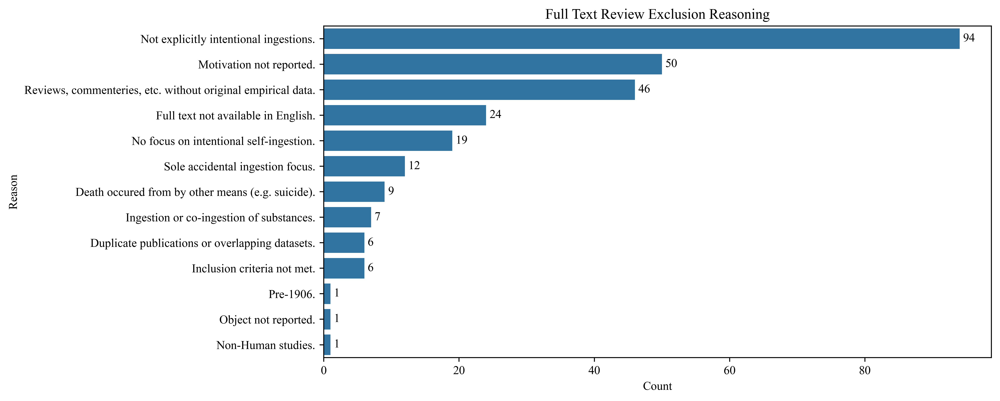

In [351]:
plt.figure(figsize=(10, 5))

excluded_final_reason_plot = sns.barplot(
    data=excluded_final_reason_counts,
    x='Count',
    y='Reason_Text'
)
excluded_final_reason_plot.set(
    title="Full Text Review Exclusion Reasoning",
    ylabel="Reason",
    xlabel="Count")

for i, (count, reason) in enumerate(zip(excluded_final_reason_counts['Count'], excluded_final_reason_counts['Reason_Text'])):
    excluded_final_reason_plot.annotate(
        text=f"{count}",
        xy=(count + 0.5, i),  # x = count + small offset, y = position in list
        va='center'
    )
plt.savefig("/".join([FIG_DIR, "ft_exclusion_reasoning_plot.png"]), bbox_inches='tight')
plt.show()

In [352]:
# Create dataframe of excluded papers
ft_included_final = all_reviewed[all_reviewed['Exclude_FINAL'] == False]

ft_excluded_final = all_reviewed[all_reviewed['Exclude_FINAL'] == True]

# Create dataframe of Author Comments
ft_author_comments = all_reviewed[['Study_ID', 'Comments_JGE', 'Comments_MS', 'Comments_GC']]

# Create database of Author Exclusion Decisions
ft_author_decisions = all_reviewed[['Study_ID', 'Exclude_JGE', 'Exclude_MS', 'Exclude_GC']]

# Create database of author reasoning
ft_author_reasoning = all_reviewed[['Study_ID', 'Reason_ID_JGE', 'Reason_ID_MS', 'Reason_ID_GC']]

all_reviewed.to_csv('/'.join([REPORT_PROC_DATA_DIR, "full_text_screen_end_final.csv"]), index=False)

# Export excluded to CSV
ft_excluded_final.to_csv('/'.join([REPORT_PROC_DATA_DIR, "full_text_screen_excluded_final.csv"]), index=False)

# Export inluded papers to CSV
ft_included_final.to_csv('/'.join([REPORT_PROC_DATA_DIR, "full_text_screen_included_final.csv"]), index=False)

In [353]:
# Count final inclusion for PRISMA diagram
ft_included_final_count = len(ft_included_final)
ft_included_final_count

40

In [354]:
ft_exclusion_reasoning = ft_excluded_final.groupby('Reason_ID_FINAL').size().sort_values(ascending=False).reset_index()
ft_exclusion_reasoning.columns = ['Reason ID', 'Count']
ft_exclusion_reasoning['Reason_Short'] = ft_exclusion_reasoning['Reason ID'].map(exclusion_criteria_short)
ft_exclusion_reasoning['Reason_Long'] = ft_exclusion_reasoning['Reason ID'].map(exclusion_criteria)
ft_exclusion_reasoning

,Reason ID,Count,Reason_Short,Reason_Long
0,9.0,94,Not explicitly intentional ingestions.,Ingestions not explicitly stated to be intenti...
1,14.0,50,Motivation not reported.,Motivation not reported.
2,5.0,46,"Reviews, commenteries, etc. without original e...","Reviews, editorials, commentaries, and opinion..."
3,1.0,24,Full text not available in English.,Full text not available in English.
4,2.0,19,No focus on intentional self-ingestion.,Studies not focusing on intentional self-inges...
5,3.0,12,Sole accidental ingestion focus.,Studies focussing solely on accidental ingestion.
6,11.0,9,Death occured from by other means (e.g. suicide).,Ingestions where death resulted from other mea...
7,7.0,7,Ingestion or co-ingestion of substances.,Studies focusing on ingestion or co-ingestion ...
8,6.0,6,Duplicate publications or overlapping datasets.,Duplicate publications or studies with overlap...
9,10.0,6,Inclusion criteria not met.,Does not meet inclusion criteria.


In [355]:
# Check that all full text reviewed items have a final exclusion decision recorded
all_reviewed[all_reviewed['Exclude_FINAL'].isna()]

,Study_ID,Exclude_JGE,Reason_ID_JGE,Unclear_JGE,Comments_JGE,Exclude_MS,Reason_ID_MS,Unclear_MS,Comments_MS,Exclude_GC,Reason_ID_GC,Comments_GC,Exclude_FINAL,Reason_ID_FINAL
Study_ID,,,,,,,,,,,,,,


### Bibliography Search

In [356]:
# Copy data from all reviewed full text data
ft_data = all_reviewed.copy()

# Create list of included_ids from full text screen
included_ids = list(ft_data[ft_data['Exclude_FINAL'] == False]['Study_ID'])

len(included_ids)

40

In [357]:
# Create dataframe for bibliography search
bib_search_df = pd.DataFrame(columns=['Study_ID', 'Bib_Search_Complete'])

bib_search_df['Study_ID'] = included_ids

file_path = os.path.join(REPORT_PROC_DATA_DIR, 'bib_search_start.csv')
bib_search_df.to_csv(file_path, index=False)

In [358]:
# Reimport data from bibliography search
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'bib_search_end.xlsx')
bib_search_df = pd.read_excel(import_path)

In [359]:
# Filter out excluded papers
bib_search_df = bib_search_df[bib_search_df['Study_ID'].isin(included_ids)]

In [360]:
# Check progress of bibliography search
bib_search_df['Bib_Search_Complete'] = bib_search_df['Bib_Search_Complete'].astype(str)

# Create status map
status_map = {
    'nan': 'Awaiting Search',
    'Y': 'Search Complete',
    'N': 'For second review'
}

# Map statys map to Bib_Search_Complete to make more human readable
bib_search_df['Bib_Search_Complete'] = bib_search_df['Bib_Search_Complete'].map(status_map)

# View status
bib_search_df['Bib_Search_Complete'].value_counts()

Bib_Search_Complete
Search Complete    40
Name: count, dtype: int64

In [361]:
# Import bibliography search results
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'bib_search_results.csv')
bib_search_df = pd.read_csv(import_path)

# Sort Results by Publication Year, Author, Title ascending.
bib_search_df = bib_search_df.sort_values(by=['Publication Year', 'Author', 'Title'], ascending=True).reset_index(drop=True)

# Import initial results to
import_path = os.path.join(REPORT_PROC_DATA_DIR, "ta_review_start_jge.csv")
ta_start = pd.read_csv(import_path)

# Rename id column
ta_start = ta_start.rename(columns={
    'id': 'Study_ID'
})

# Find max study ID
starting_index = ta_start['Study_ID'].max() + 1

# Create Study_ID for items in bibliography search
bib_search_df['Study_ID'] = range(starting_index, starting_index + len(bib_search_df))

# Export to CSV
file_path = os.path.join(REPORT_PROC_DATA_DIR, 'bib_search_results.csv')
bib_search_df.to_csv(file_path)

In [362]:
# import TA review
ta_path = os.path.join(REPORT_PROC_DATA_DIR, 'ta_review_final.csv')
ta_review = pd.read_csv(ta_path)

# Import FT review
ft_path = os.path.join(REPORT_PROC_DATA_DIR, 'full_text_screen_end_final.csv')
ft_review = pd.read_csv(ft_path)

# normalise helper
def clean_text(s):
    return str(s).strip().lower() if pd.notnull(s) else ''

# normalise
bib_search_df['Title_clean'] = bib_search_df['Title'].apply(clean_text)
bib_search_df['DOI_clean'] = bib_search_df['DOI'].apply(clean_text)

ta_review['Title_clean'] = ta_review['Title'].apply(clean_text)
ta_review['DOI_clean'] = ta_review['DOI'].apply(clean_text)

# original count
print(f'{len(bib_search_df)} items in bib_search_results before duplicate removal')
bib_search_start_count = len(bib_search_df)

# find duplicates
# Match by DOI (if DOI exists and isn't blank)
doi_matches = bib_search_df[
    (bib_search_df['DOI_clean'] != '') &
    bib_search_df['DOI_clean'].isin(
        ta_review['DOI_clean'].dropna().loc[lambda x: x != '']
    )
]

# Match by Title only where DOI is missing
title_matches = bib_search_df[
    (bib_search_df['DOI_clean'] == '') &
    bib_search_df['Title_clean'].isin(
        ta_review['Title_clean'].dropna().str.strip().str.lower()
    )
]

duplicates = pd.concat([doi_matches, title_matches]).drop_duplicates()

# remove duplicates
duplicate_ids = duplicates['Study_ID'].tolist()
bib_search_df = bib_search_df[~bib_search_df['Study_ID'].isin(duplicate_ids)]

print(f'{len(bib_search_df)} items in bib_search_results after duplicate removal')

# prep ft exclusion
ta_review = ta_review.rename(columns={'id': 'Study_ID'})  # if needed

ft_review = pd.merge(
    ft_review,
    ta_review[['Study_ID', 'DOI_clean']],
    how='left',
    on='Study_ID'
)

# Mark excluded full-text articles
ft_excluded = ft_review[ft_review['Exclude_FINAL'] == True]

# exclude based on DOI
ft_excluded_dois = ft_excluded['DOI_clean'].dropna().loc[lambda x: x != ''].unique()

exclusions = bib_search_df[
    (bib_search_df['DOI_clean'] != '') &
    bib_search_df['DOI_clean'].isin(ft_excluded_dois)
]

print(f"{len(bib_search_df)} items in bib_search_results before full-text exclusions")
bib_search_df = bib_search_df[~bib_search_df['Study_ID'].isin(exclusions['Study_ID'])]
print(f"{len(bib_search_df)} items in bib_search_results after full-text exclusions")

# combine pre-screening exclusions
pre_screen_exclusions = pd.concat([duplicates, exclusions]).drop_duplicates()

# export results
# Debug output to audit dropped papers
duplicates_out = os.path.join(REPORT_PROC_DATA_DIR, 'bib_search_debug_duplicates_found.csv')
duplicates.to_csv(duplicates_out, index=False)
bib_search_duplicates = duplicates.copy()
bib_search_duplicates_count = len(bib_search_duplicates)

# Final pre-screen exclusion list
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'bib_search_pre_screen_exclusions.csv')
pre_screen_exclusions.to_csv(export_path, index=False)

print("Pre-screen exclusions exported.")

204 items in bib_search_results before duplicate removal
192 items in bib_search_results after duplicate removal
192 items in bib_search_results before full-text exclusions
192 items in bib_search_results after full-text exclusions
Pre-screen exclusions exported.


In [363]:
# Rename to match screening format
bib_search_df = bib_search_df.rename(columns={
    'Access Date': 'Accessed'
})

# Define the screening columns
screening_columns = [
    'Study_ID', 'Publication Year', 'Author', 'Title',
    'Publication Title', 'Database', 'Exclude', 'Reason ID',
    'Paediatric', 'Intention Reported', 'Deliberate intention',
    'Unclear', 'Accessed', 'Comments'
]

# Create empty screening DataFrame with same index as bib_search_df
bib_search_screening = pd.DataFrame(index=bib_search_df.index, columns=screening_columns)

# Fill in matching columns from bib_search_df
for col in screening_columns:
    if col in bib_search_df.columns:
        bib_search_screening[col] = bib_search_df[col]

# Set the Database source
bib_search_screening['Database'] = "Bibliography Search"

# Safely convert numeric fields with missing values allowed
bib_search_screening['Publication Year'] = pd.to_numeric(
    bib_search_screening['Publication Year'], errors='coerce'
).astype('Int64')

bib_search_screening['Study_ID'] = pd.to_numeric(
    bib_search_screening['Study_ID'], errors='coerce'
).astype('Int64')

# Export to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'bib_search_screen_start.csv')
bib_search_screening.to_csv(export_path, index=False)

# Count number of items found in bibliography search for PRISMA diagram
bib_search_start_count = len(bib_search_screening)

In [364]:
# Import completed bib_search data extraction and screening
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'bib_search_screen_end.xlsx')
bib_search_screen_end = pd.read_excel(import_path)

In [365]:
# Cleaning
bib_search_screen_end.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194 entries, 0 to 193
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Study_ID              194 non-null    int64  
 1   Publication Year      194 non-null    int64  
 2   Author                190 non-null    object 
 3   Title                 194 non-null    object 
 4   Publication Title     192 non-null    object 
 5   Database              194 non-null    object 
 6   Exclude               194 non-null    bool   
 7   Reason ID             164 non-null    float64
 8   Paediatric            108 non-null    float64
 9   Intention Reported    139 non-null    float64
 10  Deliberate intention  137 non-null    float64
 11  Unclear               0 non-null      float64
 12  Accessed              177 non-null    object 
 13  Study_Design          156 non-null    object 
 14  Population_Type       99 non-null     object 
 15  Study_Setting         9

In [366]:
df = bib_search_screen_end.copy()

# Replace " " in column headings with "_"
df.columns = df.columns.str.strip(" ").str.replace(" ", "_")

df = df.rename(columns={
    'Deliberate_intention': 'Deliberate_Intention'
})

# Convert boolean columns to boolean
bool_cols = ['Exclude', 'Paediatric', 'Intention_Reported', 'Deliberate_Intention', 'Unclear']
df[bool_cols] = df[bool_cols].astype(bool)

# Convert integer columns to type integer
int_cols = ['Reason_ID']
df[int_cols] = df[int_cols].apply(pd.to_numeric, errors='coerce').astype('Int64')

# Convert category cols to type category
cat_cols = ['Data_Extracted', 'Bib_Search_Complete']
df[cat_cols] = df[cat_cols].astype('category')

df.head()

,Study_ID,Publication_Year,Author,Title,Publication_Title,Database,Exclude,Reason_ID,Paediatric,Intention_Reported,...,Unclear,Accessed,Study_Design,Population_Type,Study_Setting,Study_Location,DOI,Data_Extracted,Bib_Search_Complete,Comments
0,492,1941,"Macmanus, Joseph E.",Perforations of the intestine by ingested fore...,The American Journal of Surgery,Bibliography Search,True,9,False,False,...,True,2025-04-14 17:11:45,NaN,NaN,NaN,NaN,10.1016/S0002-9610(41)90652-9,N,N,Historical review and case report. Does not re...
1,493,1962,"Perelman, H.",Toothpick perforations of the gastrointestinal...,The Journal of Abdominal Surgery,Bibliography Search,True,1,True,True,...,True,NaN,NaN,NaN,NaN,NaN,NaN,N,N,Full text not available
2,494,1967,"Sloop, R. D.; Thompson, J. C.",Aorto-esophageal fistula: report of a case and...,Gastroenterology,Bibliography Search,True,1,True,True,...,True,NaN,NaN,NaN,NaN,NaN,NaN,N,N,Full text not available
3,495,1969,"Johnson, Wilbur E.",On Ingestion of Razor Blades,JAMA,Bibliography Search,True,14,True,True,...,True,2025-04-14 14:35:26,Case Report,Single prisoner,"New Jersey State Prison Hospital, Trenton","Trenton, New Jersey, USA",10.1001/jama.1969.03160110135030,Y,N,Motivation not documented
4,496,1969,"Schechter, D. C.; Gilbert, L.",Injuries of the heart and great vessels due to...,Thorax,Bibliography Search,True,2,False,True,...,True,2025-04-15 10:26:00,NaN,NaN,NaN,NaN,10.1136/thx.24.2.246,N,N,Insertion of pins into thoracic wall


In [367]:
df['Exclude'].value_counts()

# Ensure each exclusion has a reason
df[(df['Exclude'] == True) & (df['Reason_ID'].isna())]

# Ensure each inclusion has no reason
df[(df['Exclude'] == False) & (~df['Reason_ID'].isna())]

# Export to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'bib_search_final.csv')
bib_search_screen_clean = df.copy()
bib_search_screen_clean.to_csv(export_path)

# Export included items
bib_search_included = bib_search_screen_clean[bib_search_screen_clean['Exclude'] == False]
output_path = os.path.join(REPORT_PROC_DATA_DIR, 'bib_search_included_final.csv')
bib_search_included.to_csv(output_path, index=False)

bib_search_screen_clean['Exclude'].value_counts()

Exclude
True     164
False     30
Name: count, dtype: int64

In [368]:
bib_search_excluded = bib_search_screen_clean[bib_search_screen_clean['Exclude'] != False]
len(ft_included_final)

40

In [369]:
bib_search_exclusion_reasoning = bib_search_excluded['Reason_ID'].value_counts().sort_values(ascending=False).reset_index()
bib_search_exclusion_reasoning.columns = ['Reason_ID', 'Count']

In [370]:
# Count included items for PRISMA diagram
bib_search_included_count = len(bib_search_included)

### PRISMA Diagram

In [371]:
subsection_path = os.path.join(SECTIONS_DIR, 'screening_process.tex')

In [372]:
# Add google count to database counts
new_row = pd.DataFrame({'Database': ['Google Scholar'], 'Count': [google_start_count]})
initial_database_counts = pd.concat([initial_database_counts, new_row], ignore_index=True)

# Sort descending
initial_database_counts = initial_database_counts.sort_values(by='Count', ascending=False)
initial_database_counts

,Database,Count
0,PubMed,317
1,Web of Science,277
6,Google Scholar,135
2,Embase,25
3,SCOPUS,24
4,PsycINFO,16
5,Cochrane,14


In [373]:
# Build list of "Database (Count)" strings
db_entries = [f"{row['Database']} ({row['Count']})" for _, row in initial_database_counts.iterrows()]

# Format in plain English
if len(db_entries) == 1:
    db_text = db_entries[0]
elif len(db_entries) == 2:
    db_text = f"{db_entries[0]} and {db_entries[1]}"
else:
    db_text = ", ".join(db_entries[:-1]) + f", and {db_entries[-1]}"

# Calculate total count
total_records = initial_database_counts['Count'].sum()

# Compose final text
study_selection = f"""
A total of {total_records} records were identified through initial database searches: {db_text}.
"""

# Append to report
with open(subsection_path, 'w') as f:
    f.write(study_selection)
print(f"Overwritten: {subsection_path}")

Overwritten: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/screening_process.tex


In [374]:
# Count duplicates removed
total_duplicates_removed = database_duplicates_removed_count + google_duplicates_removed_count
print(total_duplicates_removed)
total_duplicates_removed = total_duplicates_removed + google_duplicate_count
print(total_duplicates_removed)

313
316


In [375]:
# Create dataframe of to count records removed before screening and the reasons for removal. 
records_removed = pd.DataFrame([{
    'Duplicates Removed': total_duplicates_removed,
    'Records marked as ineligible\nby automation tools': 0,
    'Records removed for \n other reason': 0
}])

In [376]:
screening_tex = f"""{total_duplicates_removed} duplicates were identified and removed.

Title and abstract screening was undertaken, with JGE reviewing all {records_screened_count} records. A random sample of {ta_ms_sample_size} records was generated for independent screening MS. Cohen's Kappa was calculated for inter-reviewer agreement between JGE and MS, yielding a value of {kappa_ta_jge_ms}, indicating {agreement_label.lower()}. Where JGE and MS disagreed, {len(gc_reviewed_df)} records were reviewed by GC. In total, {title_abstract_exclusion_count} records were excluded, leaving {title_abstract_inclusion_count} for full text review. 

During full text review, JGE reviewed all {len(jge_screened_df)} records. A random sample of {len(ms_review_start_df)} records was generated for independent review by MS. Inter-reviewer agreement was again calculated using Cohen's Kappa, yielding a value of {kappa_ft_jge_ms}, indicating {agreement_label.lower()}. Where JGE and MS disagreed, {len(jge_ms_disagree)} records were reviewed by GC. In total, {len(ft_excluded_final)} records were excluded during full text review. {len(ft_included_final)} records were included and proceeded to bibliography search. 

The bibliographies of the {len(included_ids)} included papers were searched by manually JGE. Relevant bibliography items were identified, collated, and evaluated against the eligibility criteria, yielding {len(bib_search_screen_clean)} results.

These {len(bib_search_screen_clean)} results were reviewed by JGE. {len(bib_search_excluded)} bibliography search records were excluded, leaving {len(bib_search_included)} for inclusion. \n
Therefore, a total of {len(ft_included_final) + len(bib_search_included)} records were included in this study and proceeded to bias assessment. This process is illustrated in Figure~\\ref{{fig:prisma}}.

"""

# Append to report
with open(subsection_path, 'a') as f:
    f.write(screening_tex)
print(f"Overwritten: {subsection_path}")

Overwritten: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/screening_process.tex


In [377]:
# Create dataframe of numbers of records found from other sources. 
alternative_sources_df = pd.DataFrame(columns=['Source', 'Count'])
# Add Bibliography Search
alternative_sources_df.loc[len(alternative_sources_df)] = ['Bibliography Search', len(bib_search_screen_clean)]

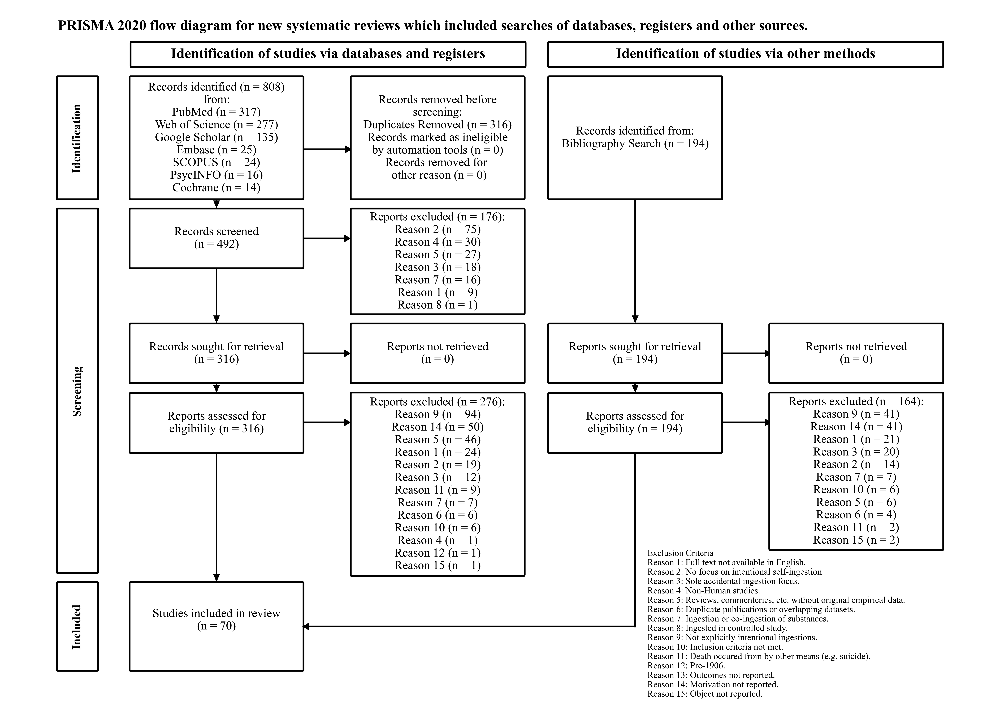

In [378]:
from matplotlib.patches import FancyBboxPatch, Rectangle, FancyArrow
from matplotlib.lines import Line2D

rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 10
})

# A4 landscape size
fig, ax = plt.subplots(figsize=(11.69, 8.27))
ax.axis('off')

# Set axis limits
ax.set_xlim(0, 20)
ax.set_ylim(0, 12)

# Helper function to draw a vertical arrow
def draw_vertical_arrow(ax, x, y_start, y_end):
    length = y_end - y_start
    arrow = FancyArrow(x, y_start, 0, length,
                       width=0.01, head_width=0.1, head_length=0.1, length_includes_head=True,
                       color='black')
    ax.add_patch(arrow)

# Helper function to draw a horizontal arrow
def draw_horizontal_arrow(ax, x_start, x_end, y):
    length = x_end - x_start
    arrow = FancyArrow(x_start, y, length, 0,
                       width=0.01, head_width=0.1, head_length=0.1, length_includes_head=True,
                       color='black')
    ax.add_patch(arrow)

# Draw title in top-left corner (using ax.text instead of suptitle)
ax.text(1, 11.8, 
        "PRISMA 2020 flow diagram for new systematic reviews which included searches of databases, registers and other sources.",
        fontsize=12, fontweight='bold', ha='left', va='top', color='black')

# Function to draw yellow header box
def draw_yellow_box(ax, x, y, width, height, text, fontsize=12):
    box = FancyBboxPatch(
        (x, y), width, height,
        boxstyle="round,pad=0.02",
        edgecolor="black",
        facecolor="#FFFFFF",
        linewidth=1.5
    )
    ax.add_patch(box)
    ax.text(
        x + width / 2, y + height / 2, text,
        ha='center', va='center',
        fontsize=fontsize, fontweight='bold',
        color='black'
    )

# Draw first yellow header box below the title
draw_yellow_box(ax, x=2.5, y=11, width=8, height=0.4, 
                text="Identification of studies via databases and registers")

# Draw second yellow box beside it
draw_yellow_box(ax, x=11, y=11, width=8, height=0.4,
                text="Identification of studies via other methods")

def draw_vertical_blue_box(ax, x, y, width, height, text, fontsize=10):
    box = FancyBboxPatch(
        (x, y), width, height,
        boxstyle="round,pad=0.02",
        edgecolor="black",
        facecolor="#FFFFFF",  # Light blue (similar to PRISMA)
        linewidth=1.5
    )
    ax.add_patch(box)
    
    # Rotated text (90 degrees, bottom to top)
    ax.text(
        x + width/2, y + height/2, text,
        ha='center', va='center',
        rotation=90,  # rotate 90 degrees counterclockwise
        fontsize=fontsize, fontweight='bold',
        color='black'
    )

draw_vertical_blue_box(ax, x=1, y=8.7, width=0.8, height=2.1, text="Identification")
draw_vertical_blue_box(ax, x=1, y=2.2, width=0.8, height=6.3, text="Screening")
draw_vertical_blue_box(ax, x=1, y=0.5, width=0.8, height=1.5, text="Included")

def draw_white_box(ax, x, y, width, height, text, fontsize=10):
    box = FancyBboxPatch(
        (x, y), width, height,
        boxstyle="round,pad=0.02",
        edgecolor="black",
        facecolor="white",
        linewidth=1.5
    )
    ax.add_patch(box)
    
    ax.text(
        x + width/2, y + height/2, text,
        ha='center', va='center',
        fontsize=fontsize,
        color='black'
    )

# Column 1
draw_white_box(ax, x=2.48, y=8.7, width=3.5, height=2.1, 
            text="Records identified (n = {})\nfrom:\n{}".format(
                initial_database_counts['Count'].sum(),
                "\n".join(
                    f"{db} (n = {count})" 
                    for db, count in zip(
                        initial_database_counts['Database'],
                        initial_database_counts['Count']
                    )
                )
            )
)
draw_vertical_arrow(ax, x=4.23, y_start=8.68, y_end=8.55)
draw_horizontal_arrow(ax, x_start=6, x_end=6.96, y=9.55)  # to records removed before screening
draw_white_box(ax, x=2.48, y=7.5, width=3.5, height=1, 
            text=f"Records screened\n(n = {records_screened_count})")
draw_vertical_arrow(ax, x=4.23, y_start=7.47, y_end=6.55)
draw_horizontal_arrow(ax, x_start=6, x_end=6.94, y=8)  # records excluded
draw_white_box(ax, x=2.48, y=5.5, width=3.5, height=1, 
            text=f"Records sought for retrieval\n(n = {ft_review_start_count})")
draw_horizontal_arrow(ax, x_start=6, x_end=6.94, y=6)  # records not retrieved
draw_vertical_arrow(ax, x=4.23, y_start=5.46, y_end=5.34)
draw_white_box(ax, x=2.48, y=4.29, width=3.5, height=1, 
            text=f"Reports assessed for\neligibility (n = {ft_review_start_count})")
draw_vertical_arrow(ax, x=4.23, y_start=4.27, y_end=2.05)
draw_horizontal_arrow(ax, x_start=6, x_end=6.94, y=4.8)  # reports assessed for eligibility
draw_white_box(ax, x=2.48, y=0.5, width=3.5, height=1.5, 
            text=f"Studies included in review\n(n = {ft_included_final_count + bib_search_included_count})\n")

# Column 2
draw_white_box(
    ax, x=6.98, y=8.7, width=3.5, height=2.1,
    text="Records removed before\nscreening:\n" + "\n".join(
        f"{col} (n = {records_removed[col].iloc[0]})"
        for col in records_removed.columns
    )
)
draw_white_box(ax, x=6.98, y=6.7, width=3.5, height=1.8, 
            text="Reports excluded (n = {}):\n{}".format(
                ta_exclusion_reasoning['Count'].sum(),
                "\n".join(
                    f"Reason {reason_id:.0f} (n = {count:.0f})"
                    for reason_id, count in zip(
                        ta_exclusion_reasoning['Reason ID'],
                        ta_exclusion_reasoning['Count']
                    )
                )
            ))
draw_white_box(ax, x=6.98, y=5.5, width=3.5, height=1, 
            text=f"Reports not retrieved\n(n = 0)")
draw_white_box(ax, x=6.98, y=2.15, width=3.5, height=3.15, 
            text="Reports excluded (n = {}):\n{}".format(
                ft_exclusion_reasoning['Count'].sum(),
                "\n".join(
                    f"Reason {reason_id:.0f} (n = {count:.0f})"
                    for reason_id, count in zip(
                        ft_exclusion_reasoning['Reason ID'],
                        ft_exclusion_reasoning['Count']
                    )
                )
            )
)

# Column 3
draw_white_box(ax, x=11, y=8.7, width=3.5, height=2.1, 
            text="Records identified from:\n{}".format(
                "\n".join(
                    f"{source} (n = {count})"
                    for source, count in zip(
                        alternative_sources_df['Source'],
                        alternative_sources_df['Count']
                    )
                )
            ))
draw_vertical_arrow(ax, x=12.75, y_start=8.68, y_end=6.55)
draw_horizontal_arrow(ax, x_start=14.5, x_end=15.5, y=6)  # to reports not retrieved
draw_white_box(ax, x=11, y=5.5, width=3.5, height=1, 
            text=f"Reports sought for retrieval\n(n = {len(bib_search_screen_clean)})")
draw_vertical_arrow(ax, x=12.75, y_start=5.46, y_end=5.34)
draw_horizontal_arrow(ax, x_start=14.5, x_end=15.5, y=4.8)  # to reports excluded
draw_white_box(ax, x=11, y=4.29, width=3.5, height=1, 
            text=f"Reports assessed for\neligibility (n = {len(bib_search_screen_clean)})")

# Column 4
draw_white_box(ax, x=15.5, y=5.5, width=3.5, height=1, 
            text="Reports not retrieved\n(n = 0)")
draw_white_box(ax, x=15.5, y=2.6, width=3.5, height=2.7, 
            text="Reports excluded (n = {}):\n{}".format(
                bib_search_exclusion_reasoning['Count'].sum(),
                "\n".join(
                    f"Reason {reason_id} (n = {count})"
                    for reason_id, count in zip(
                        bib_search_exclusion_reasoning['Reason_ID'],
                        bib_search_exclusion_reasoning['Count']
                    )
                )
            )
)

# Exclusion
exclusion_text = "Exclusion Criteria\n" + "\n".join(
    f"Reason {id}: {value}"
   for id, value in exclusion_criteria_short.items()
)

# Add text to the canvas
ax.text(13, 0, exclusion_text, fontsize=7.5, va='bottom', ha='left', color='black')

# Draw final right angle arrow

# Coordinates
exit_x = 12.75  # center of top box
exit_y = 4.27    # bottom of top box

corner_y = 1.25  # vertical center of lower box (entry y)
entry_x = 6   # right side of lower box

# Step 1: Downward vertical line
ax.add_line(Line2D([exit_x, exit_x], [exit_y, corner_y], linewidth=1.5, color='black'))

# Step 2: Horizontal arrow into right side of box
arrow = FancyArrow(exit_x, corner_y, entry_x - exit_x, 0,
                   width=0.01, head_width=0.1, head_length=0.1, 
                   length_includes_head=True, color='black')
ax.add_patch(arrow)

plt.tight_layout()

output_path = "/".join([REPORT_FIGURES_DIR, "prisma_diagram.png"])
plt.savefig(output_path)
plt.show()

In [379]:
initial_database_counts = database_counts.copy()

In [380]:
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'included_paper_data_final.xlsx')
paper_data = pd.read_excel(import_path)

In [381]:
# Create list of items included from full_text_screen
ft_included_ids = list(ft_included_final['Study_ID'].unique())

# Create list of items included from bibliography search
bib_search_included_ids = list(bib_search_included['Study_ID'].unique())

# Combine to make list of all included_ids
included_ids = sorted(ft_included_ids + bib_search_included_ids)

## Data Cleaning

### Case Data Cleaning

In [382]:
# Import raw case_data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'data_extraction_case_report_end.xlsx')
case_data = pd.read_excel(import_path)
len(case_data)

214

In [383]:
# Filter data 
case_data = case_data[case_data['Study_ID'].isin(included_ids)]

# Import paper_data, includes Citekey and paper details
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'included_paper_data_final.xlsx')
paper_data = pd.read_excel(import_path)

In [384]:
# Filter case data 
case_data = case_data[case_data['Study_ID'].isin(included_ids)]

In [385]:
paper_data['Study_ID'] = paper_data['Study_ID'].astype('Int64')

In [386]:
# Merge case_data with paper_data on 'Study_ID'
case_data = pd.merge(case_data, 
                     paper_data,
                     how='left', 
                     on='Study_ID')
case_data.head()

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Outcome_Other_Long,Comments,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey
0,51,51-001,20,Male,Y,Y,N,UK,N,UK,...,NaN,NaN,1996,"Losanoff, J. E.; Kjossev, K. T.",Gastrointestinal 'crosses'. a new shade from a...,"Archives Of Surgery (Chicago, Ill. : 1960)",10.1001/archsurg.1996.01430140056015,Bulgaria,Case Series,Losanoff_1996
1,51,51-002,20,Male,Y,Y,N,UK,N,UK,...,NaN,NaN,1996,"Losanoff, J. E.; Kjossev, K. T.",Gastrointestinal 'crosses'. a new shade from a...,"Archives Of Surgery (Chicago, Ill. : 1960)",10.1001/archsurg.1996.01430140056015,Bulgaria,Case Series,Losanoff_1996
2,51,51-003,19,Male,Y,Y,N,UK,N,UK,...,NaN,NaN,1996,"Losanoff, J. E.; Kjossev, K. T.",Gastrointestinal 'crosses'. a new shade from a...,"Archives Of Surgery (Chicago, Ill. : 1960)",10.1001/archsurg.1996.01430140056015,Bulgaria,Case Series,Losanoff_1996
3,51,51-004,21,Male,Y,Y,N,UK,N,UK,...,NaN,NaN,1996,"Losanoff, J. E.; Kjossev, K. T.",Gastrointestinal 'crosses'. a new shade from a...,"Archives Of Surgery (Chicago, Ill. : 1960)",10.1001/archsurg.1996.01430140056015,Bulgaria,Case Series,Losanoff_1996
4,51,51-005,29,Male,Y,Y,N,UK,N,UK,...,NaN,NaN,1996,"Losanoff, J. E.; Kjossev, K. T.",Gastrointestinal 'crosses'. a new shade from a...,"Archives Of Surgery (Chicago, Ill. : 1960)",10.1001/archsurg.1996.01430140056015,Bulgaria,Case Series,Losanoff_1996


In [387]:
cases_motivation_other = case_data[case_data['Motivation_Other'] == 1]
cases_motivation_other['Motivation_Other_Long']

Series([], Name: Motivation_Other_Long, dtype: object)

In [388]:
# Create additional columns 
case_data['Outcome_Conservative'] = case_data.apply(
    lambda row: 'Y' if row['Outcome_Surgery'] != 'Y' and row['Outcome_Endoscopy'] != 'Y' else 'N',
    axis=1
)

In [389]:
# Create Outcome_Complication
case_data['Outcome_Complication'] = case_data.apply(
    lambda row: 'Y' if row['Outcome_Injury_Needing_Intervention'] == 'Y' or row['Outcome_Perforation'] == 'Y' or row['Outcome_Perforation'] == 'Y' or row['Outcome_Obstruction'] == 'Y' or row['Outcome_Injury_Other'] == 'Y' else 'N',
    axis=1
)

In [390]:
# Check Patient_IDs are unique
case_data['Patient_ID'].nunique() == len(case_data)

True

In [391]:
# Check Study_ID matches Patient_ID
case_data['Study_ID'] = case_data['Study_ID'].astype(str)
(case_data['Study_ID'] != case_data['Patient_ID'].str.split("-").str[0]).sum()
case_data['Study_ID'] = case_data['Study_ID'].astype('Int64')

In [392]:
non_binary_cols = ['Study_ID', 'Patient_ID', 'Age_Yrs', 'Gender', 'Comments']
paper_data_cols = paper_data.columns
binary_cols = [
    col for col in case_data.columns
    if col not in non_binary_cols and col not in paper_data_cols and not col.endswith('Other_Long')
]

binary_cols

['Is_Intentional',
 'Is_Prisoner',
 'Is_Psych_Inpat',
 'Is_Displaced_Person',
 'Under_Influence_Alcohol',
 'Psych_Hx',
 'Severe_Disability_Hx',
 'Previous_Ingestions',
 'Motivation_Intent_To_Harm',
 'Motivation_Protest',
 'Motivation_Psychiatric',
 'Motivation_Psychosocial',
 'Motivation_Unknown',
 'Motivation_Other',
 'Object_Button_Battery',
 'Object_Magnet',
 'Object_Long',
 'Object_Diameter_Large',
 'Object_Sharp',
 'Object_Multiple',
 'Outcome_Endoscopy',
 'Outcome_Surgery',
 'Outcome_Death',
 'Outcome_Injury_Needing_Intervention',
 'Outcome_Perforation',
 'Outcome_Obstruction',
 'Outcome_Intervention_Other',
 'Outcome_Injury_Other',
 'Outcome_Other',
 'Outcome_Conservative',
 'Outcome_Complication']

In [393]:
# Check for blank binary_cols
filtered_case_data = case_data[case_data[binary_cols].isna().any(axis=1)]
filtered_case_data

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey,Outcome_Conservative,Outcome_Complication


In [394]:
# Convery binary cols to 1 and 0s based on Y and N value
binary_map = {'Y': 1, 'N': 0, 'UK': np.nan}

case_data[binary_cols] = case_data[binary_cols].replace(binary_map)

case_data[binary_cols] = case_data[binary_cols].astype(float)

In [395]:
# Check for blank age column
filtered_case_data = case_data[case_data['Age_Yrs'].isna()]
filtered_case_data

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey,Outcome_Conservative,Outcome_Complication


In [396]:
# Check for blank gender column
filtered_case_data = case_data[case_data['Gender'].isna()]
filtered_case_data

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey,Outcome_Conservative,Outcome_Complication


In [397]:
# Inspect unique values in Gender Column
case_data['Gender'].unique()

array(['Male', 'Female', 'UK'], dtype=object)

In [398]:
# replace 'UK' with 'Unknown' in Gender columns
case_data['Gender'] = case_data['Gender'].str.replace('UK', 'Unknown')

In [399]:
# Create list of values that are permitted in gender column
permitted_values = ['Unknown', 'Male', 'Female']

# Create a mask where any value in Gender col is not in permitted_values
mask = ~case_data['Gender'].isin(permitted_values)

# Filter the rows that have problems
filtered_case_data = case_data[mask]
filtered_case_data

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey,Outcome_Conservative,Outcome_Complication


In [400]:
# Replace 'UK' in Age column with np.nan 
case_data['Age_Yrs'] = case_data['Age_Yrs'].replace('UK', np.nan)

# convert to float
case_data['Age_Yrs'] = case_data['Age_Yrs'].astype(float)

# check for unrealistic ages
unrealistic_ages = case_data[(case_data['Age_Yrs'] < 0) | (case_data['Age_Yrs'] > 120)]

unrealistic_ages

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey,Outcome_Conservative,Outcome_Complication


In [401]:
# Check for blank 'Study_ID'
filtered_case_data = case_data[case_data['Study_ID'].isna()]
filtered_case_data

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey,Outcome_Conservative,Outcome_Complication


In [402]:
# Check for blank 'Patient_ID'
filtered_case_data = case_data[case_data['Patient_ID'].isna()]
filtered_case_data

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey,Outcome_Conservative,Outcome_Complication


In [403]:
# Show duplicate row
case_data.duplicated().sum()

np.int64(0)

In [404]:
bins = [0, 17, 24, 39, 64, np.inf]
labels = ["<18", "18_24", "25_39", "40_64", "65plus"]

# Create categorical age group
case_data['Age_Category'] = pd.cut(case_data['Age_Yrs'], bins=bins, labels=labels, right=True)

# Convert to binary columns
age_group_dummies = pd.get_dummies(case_data['Age_Category'], prefix='Age')
case_data = pd.concat([case_data, age_group_dummies], axis=1)

In [405]:
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'case_data_clean.csv')
case_data.to_csv(export_path, index=False)

### Series Data Cleaning

In [406]:
# Import raw series_data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'data_extraction_series_data_end.xlsx')
series_data = pd.read_excel(import_path)

# Filter to include results from included studies
series_data = series_data[series_data['Study_ID'].isin(included_ids)]

# Merge paper data with series_data
series_data = pd.merge(series_data, 
                       paper_data, 
                       how='left',
                       on='Study_ID')
series_data.head()

,Study_ID,Comments,Patient_Count,Case_Count,Age_Low,Age_High,Age_Mean,Age_Median,Verified_Ingestion_Cases,Verified_Ingestion_Rate,...,Outcome_Endoscopy_Surgery_Cases,Outcome_Endoscopy_Surgery_Rate,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey
0,523,"""The most common motive for swallowing was sui...",19,19,17,40,24,UK,UK,1,...,UK,UK,1991,"Karp, J. G.; Whitman, L.; Convit, A.",Intentional ingestion of foreign objects by ma...,Hospital & Community Psychiatry,10.1176/ps.42.5.533,USA,Case Series,Karp_1991b
1,581,"""In summary, the foreign objects in prisoners ...",33,52,25,50,NaN,35,UK,1,...,1,UK,2007,"Lee, Tae Hee; Kang, Young Woo; Kim, Hyun Jin; ...",Foreign Objects in Korean Prisoners,The Korean Journal of Internal Medicine,10.3904/kjim.2007.22.4.275,Republic of Korea,Case Series,Lee_2007
2,646,NaN,16,19,19,27,24,UK,UK,1,...,1,UK,2016,"Elghali, Mohamed amine; Ghrissi, Rafik; Fadhl,...",The Management of Voluntary Ingestion of Razor...,International Surgery,10.9738/INTSURG-D-16-00204.1,Tunisia,Case Series,Elghali_2016


In [407]:
# Import case bias data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'bias_assessment_case_report_end.xlsx')
case_bias_data = pd.read_excel(import_path)

# Import series bias data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'bias_assessment_case_series_end.xlsx')

In [408]:
# Deal with UK (Unknown values)
series_data = series_data.replace("UK", np.nan)

# Define text_cols
text_cols = ['Study_ID', 'Comments'] + [col for col in series_data.columns if col.endswith('Long')] + list(paper_data.columns)

# Create list of columns containing numerical values
numerical_cols = series_data.columns.drop(text_cols)

# Convert numerical columns to type float
series_data[numerical_cols] = series_data[numerical_cols].astype(float)

series_data.head()

,Study_ID,Comments,Patient_Count,Case_Count,Age_Low,Age_High,Age_Mean,Age_Median,Verified_Ingestion_Cases,Verified_Ingestion_Rate,...,Outcome_Endoscopy_Surgery_Cases,Outcome_Endoscopy_Surgery_Rate,Publication_Year,Authors,Title,Publication_Title,DOI,Study_Country,Study_Design,Citekey
0,523,"""The most common motive for swallowing was sui...",19.0,19.0,17.0,40.0,24.0,NaN,NaN,1.0,...,NaN,NaN,1991,"Karp, J. G.; Whitman, L.; Convit, A.",Intentional ingestion of foreign objects by ma...,Hospital & Community Psychiatry,10.1176/ps.42.5.533,USA,Case Series,Karp_1991b
1,581,"""In summary, the foreign objects in prisoners ...",33.0,52.0,25.0,50.0,NaN,35.0,NaN,1.0,...,1.0,NaN,2007,"Lee, Tae Hee; Kang, Young Woo; Kim, Hyun Jin; ...",Foreign Objects in Korean Prisoners,The Korean Journal of Internal Medicine,10.3904/kjim.2007.22.4.275,Republic of Korea,Case Series,Lee_2007
2,646,NaN,16.0,19.0,19.0,27.0,24.0,NaN,NaN,1.0,...,1.0,NaN,2016,"Elghali, Mohamed amine; Ghrissi, Rafik; Fadhl,...",The Management of Voluntary Ingestion of Razor...,International Surgery,10.9738/INTSURG-D-16-00204.1,Tunisia,Case Series,Elghali_2016


In [409]:
outcome_cols = [col for col in series_data.columns if col.startswith('Outcome') and col != 'Outcome_Other_Long']

In [410]:
motivation_cols = [col for col in series_data.columns if col.startswith('Motivation') and col != 'Motivation_Other_Long']

In [411]:
object_cols = [col for col in series_data.columns if col.startswith('Object')]

In [412]:
def calculate_variable_rate(input_df, output_df, denominator_col, variable_cols):
    input_df = input_df.copy()
    output_df = output_df.copy()

    # Create an effective denominator, falling back to 'Patient_Count' if available
    if 'Patient_Count' in input_df.columns:
        input_df['effective_denominator'] = input_df[denominator_col].fillna(input_df['Patient_Count'])
    else:
        input_df['effective_denominator'] = input_df[denominator_col]

    # Identify base variable names (remove '_Cases' or '_Rate' suffix)
    variables = {col.replace('_Cases', '').replace('_Rate', '') for col in variable_cols}

    for var in variables:
        rate_col = f"{var}_Rate"
        case_col = f"{var}_Cases"

        if case_col in input_df.columns and rate_col in input_df.columns:
            # Calculate rate if missing and cases + denominator are available
            mask_rate_missing = input_df[rate_col].isna() & input_df[case_col].notna() & input_df['effective_denominator'].notna()
            output_df.loc[mask_rate_missing, rate_col] = (
                input_df.loc[mask_rate_missing, case_col] / input_df.loc[mask_rate_missing, 'effective_denominator']
            )

            # Calculate cases if missing and rate + denominator are available
            mask_cases_missing = input_df[case_col].isna() & input_df[rate_col].notna() & input_df['effective_denominator'].notna()
            output_df.loc[mask_cases_missing, case_col] = (
                input_df.loc[mask_cases_missing, rate_col] * input_df.loc[mask_cases_missing, 'effective_denominator']
            )

            # Ensure columns are numeric
            output_df[rate_col] = pd.to_numeric(output_df[rate_col], errors='coerce')
            output_df[case_col] = pd.to_numeric(output_df[case_col], errors='coerce')

    # Drop the temporary column
    output_df.drop(columns=['effective_denominator'], inplace=True, errors='ignore')

    return output_df

In [413]:
# Apply function, calculating rate and cases from 'Case_Count'
series_data = calculate_variable_rate(input_df=series_data, 
                                    output_df=series_data.copy(), 
                                    denominator_col='Object_Count', 
                                    variable_cols=object_cols)

series_data[object_cols].head()

,Object_Count,Object_Button_Battery_Cases,Object_Button_Battery_Rate,Object_Magnet_Cases,Object_Magnet_Rate,Object_Long_Cases,Object_Long_Rate,Object_Diameter_Large_Cases,Object_Diameter_Large_Rate,Object_Sharp_Cases,Object_Sharp_Rate,Object_Multiple_Cases,Object_Multiple_Rate,Object_Long_Sharp_Cases,Object_Long_Sharp_Rate,Object_Short_Cases,Object_Short_Rate,Object_Short_Sharp_Cases,Object_Short_Sharp_Rate
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,0.0,0.0,0.0,0.0,32.01,0.97,NaN,NaN,33.0,1.0,24.0,0.727273,NaN,NaN,0.99,0.03,NaN,NaN
2,NaN,0.0,0.0,0.0,0.0,0.00,0.00,NaN,NaN,16.0,1.0,1.0,0.062500,0.0,0.0,16.00,1.00,16.0,1.0


In [414]:
# Apply function, calculating rate and cases from 'Case_Count'
series_data = calculate_variable_rate(input_df=series_data, 
                                    output_df=series_data.copy(), 
                                    denominator_col='Case_Count', 
                                    variable_cols=motivation_cols)

series_data[motivation_cols].head()

,Motivation_Intent_To_Harm_Cases,Motivation_Intent_To_Harm_Rate,Motivation_Protest_Cases,Motivation_Protest_Rate,Motivation_Psychiatric_Cases,Motivation_Psychiatric_Rate,Motivation_Psychosocial_Cases,Motivation_Psychosocial_Rate,Motivation_Unknown_Cases,Motivation_Unknown_Rate,Motivation_Other_Cases,Motivation_Other_Rate,Motivation_Other_Psych_Hx_Cases,Motivation_Other_Psych_Hx_Rate,Motivation_Other_Severe_Disability_Hx_Cases,Motivation_Other_Severe_Disability_Hx_Rate
0,4.0,0.210526,3.00,0.157895,12.0,0.631579,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,50.44,0.970000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,0.105263,17.00,0.894737,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [415]:
# Apply function, calculating rate and cases from 'Case_Count'
series_data = calculate_variable_rate(input_df=series_data, 
                                    output_df=series_data.copy(), 
                                    denominator_col='Case_Count', 
                                    variable_cols=outcome_cols)

series_data[outcome_cols].head()

,Outcome_Endoscopy_Cases,Outcome_Endoscopy_Rate,Outcome_Surgery_Cases,Outcome_Surgery_Rate,Outcome_Death_Cases,Outcome_Death_Rate,Outcome_Injury_Needing_Intervention_Cases,Outcome_Injury_Needing_Intervention_Rate,Outcome_Perforation_Cases,Outcome_Perforation_Rate,Outcome_Obstruction_Cases,Outcome_Obstruction_Rate,Outcome_Other_Cases,Outcome_Other_Rate,Outcome_Complication_Cases,Outcome_Conservative_Rate,Outcome_Conservative_Cases,Outcome_Conservative_Rate.1,Outcome_Endoscopy_Surgery_Cases,Outcome_Endoscopy_Surgery_Rate
0,NaN,NaN,5.0,0.263158,0.0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.736842,14.0,NaN,NaN,NaN
1,46.0,0.884615,6.0,0.115385,0.0,0.000000,6.0,0.115385,1.0,0.019231,NaN,NaN,5.0,0.096154,6.0,0.158000,0.0,0.0,1.0,0.019231
2,1.0,0.052632,4.0,0.210526,1.0,0.052632,NaN,NaN,1.0,0.052632,1.0,0.052632,2.0,0.105263,NaN,0.789474,15.0,NaN,1.0,0.052632


In [416]:
series_pop_cols = ['Verified_Ingestion_Cases', 'Verified_Ingestion_Rate', 'Is_Intentional_Cases', 'Is_Intentional_Rate', 'Is_Prisoner_Cases', 
                   'Is_Prisoner_Rate', 'Is_Psych_Inpat_Cases', 'Is_Psych_Inpat_Rate', 'Is_Displaced_Person_Cases', 
                   'Is_Displaced_Person_Rate', 'Under_Influence_Alcohol_Cases', 'Under_Influence_Alcohol_Rate', 
                   'Psych_Hx_Cases', 'Psych_Hx_Rate', 'Severe_Disability_Hx_Cases', 'Severe_Disability_Hx_Rate',
                   'Previous_Ingestions_Cases', 'Previous_Ingestions_Rate']

In [417]:
# Calculate series cols
series_data = calculate_variable_rate(input_df=series_data, 
                                      output_df=series_data.copy(),
                                      denominator_col='Case_Count',
                                      variable_cols=series_pop_cols)

In [418]:
series_data[series_pop_cols]

,Verified_Ingestion_Cases,Verified_Ingestion_Rate,Is_Intentional_Cases,Is_Intentional_Rate,Is_Prisoner_Cases,Is_Prisoner_Rate,Is_Psych_Inpat_Cases,Is_Psych_Inpat_Rate,Is_Displaced_Person_Cases,Is_Displaced_Person_Rate,Under_Influence_Alcohol_Cases,Under_Influence_Alcohol_Rate,Psych_Hx_Cases,Psych_Hx_Rate,Severe_Disability_Hx_Cases,Severe_Disability_Hx_Rate,Previous_Ingestions_Cases,Previous_Ingestions_Rate
0,19.0,1.0,19.00,1.00,19.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,18.000,0.947,NaN,NaN,NaN,NaN
1,52.0,1.0,50.44,0.97,52.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,9.464,0.182,0.0,0.0,NaN,NaN
2,19.0,1.0,19.00,1.00,19.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,2.375,0.125,NaN,NaN,2.0,0.105263


In [419]:
series_gender_cols = ['Gender_Male_Cases', 'Gender_Male_Rate', 'Gender_Female_Cases', 'Gender_Female_Rate', 'Gender_Unknown_Cases', 'Gender_Unknown_Rate']

series_data = calculate_variable_rate(input_df=series_data,
                                      output_df=series_data.copy(),
                                      denominator_col='Case_Count',
                                      variable_cols=series_gender_cols)

In [420]:
series_data[series_gender_cols]

,Gender_Male_Cases,Gender_Male_Rate,Gender_Female_Cases,Gender_Female_Rate,Gender_Unknown_Cases,Gender_Unknown_Rate
0,19.0,1.0,0.0,0.0,0.0,0.0
1,52.0,1.0,0.0,0.0,0.0,0.0
2,19.0,1.0,0.0,0.0,0.0,0.0


In [421]:
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'series_data_clean.csv')
series_data.to_csv(export_path, index=False)

In [422]:
case_data.columns

Index(['Study_ID', 'Patient_ID', 'Age_Yrs', 'Gender', 'Is_Intentional',
       'Is_Prisoner', 'Is_Psych_Inpat', 'Is_Displaced_Person',
       'Under_Influence_Alcohol', 'Psych_Hx', 'Severe_Disability_Hx',
       'Previous_Ingestions', 'Motivation_Intent_To_Harm',
       'Motivation_Protest', 'Motivation_Psychiatric',
       'Motivation_Psychosocial', 'Motivation_Unknown', 'Motivation_Other',
       'Motivation_Other_Long', 'Object_Button_Battery', 'Object_Magnet',
       'Object_Long', 'Object_Diameter_Large', 'Object_Sharp',
       'Object_Multiple', 'Object_Other_Long', 'Outcome_Endoscopy',
       'Outcome_Surgery', 'Outcome_Death',
       'Outcome_Injury_Needing_Intervention', 'Outcome_Perforation',
       'Outcome_Obstruction', 'Outcome_Intervention_Other',
       'Outcome_Injury_Other', 'Outcome_Other', 'Outcome_Other_Long',
       'Comments', 'Publication_Year', 'Authors', 'Title', 'Publication_Title',
       'DOI', 'Study_Country', 'Study_Design', 'Citekey',
       'Outcome_Cons

## Analysis


### Bias Assessment

#### Case Data


In [423]:
# Import case_bias_data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'bias_assessment_case_report_end.xlsx')
case_bias_data = pd.read_excel(import_path)

In [424]:
# Algorithmically assess bias for case data
data_cols = ['Study_ID', 'Patient_ID']
assessment_cols = ['Patient_Demographic', 'History_Timeline', 'Current_Condition', 
                   'Diagnostic_Assessment',	'Intervention_Treatment',	
                   'Post_Intervention_Condition', 'Harms']

In [425]:
# Inspect column values
for col in case_bias_data[assessment_cols]:
    print(f"{col}: {case_bias_data[col].unique()}")

Patient_Demographic: ['Y' 'N']
History_Timeline: ['Y' 'N']
Current_Condition: ['Y' 'N']
Diagnostic_Assessment: ['Y' 'N']
Intervention_Treatment: ['Y' 'N']
Post_Intervention_Condition: ['Y' 'N']
Harms: [nan 'Y' 'N']


In [426]:
# Inspect unique values in Overall_Appraisal column
case_bias_data['Overall_Appraisal'].unique()

array(['Include', 'Exclude'], dtype=object)

In [427]:
case_data = case_data[case_data['Study_ID'].isin(included_ids)]

In [428]:
# Merge jbi_case_report_bias_data with case_data_clean
case_data_bias_data_merged = pd.merge(case_data,
                           case_bias_data,
                           on=['Study_ID', 'Patient_ID'],
                           how='left')

In [429]:
case_data_bias_data_merged = case_data_bias_data_merged[case_data_bias_data_merged['Study_ID'].isin(included_ids)]

In [430]:
# Create Outcome_Unknown column
# define outcome_cols
outcome_cols = [col for col in case_data_bias_data_merged.columns if col.startswith('Outcome_') and col != 'Outcome_Other_Long']
case_data_bias_data_merged[outcome_cols]

,Outcome_Endoscopy,Outcome_Surgery,Outcome_Death,Outcome_Injury_Needing_Intervention,Outcome_Perforation,Outcome_Obstruction,Outcome_Intervention_Other,Outcome_Injury_Other,Outcome_Other,Outcome_Conservative,Outcome_Complication
0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
70,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0
71,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
72,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
73,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [431]:
case_data_bias_data_merged['Overall_Appraisal'].value_counts()

Overall_Appraisal
Include    72
Exclude     3
Name: count, dtype: int64

In [432]:
# Count cases excluded during bias assessment
case_data_bias_data_merged_excluded = case_data_bias_data_merged[case_data_bias_data_merged['Overall_Appraisal'] == 'Exclude']

In [433]:
subsection_path = os.path.join(SECTIONS_DIR, 'risk_of_bias_results.tex')

In [434]:
# Get sorted unique citekeys
unique_citekeys = sorted(set(case_data_bias_data_merged['Citekey']))
citekey_block = '\\cite{' + ', '.join(unique_citekeys) + '}'

# Build LaTeX-safe text summary
study_characteristics_text = (
    f"\\subsubsection*{{Case Reports}} \n{len(case_data_bias_data_merged)} cases from "
    f"{case_data_bias_data_merged['Study_ID'].nunique()} studies {citekey_block} were evaluated "
    "using the \\textit{{JBI Checklist for Case Reports}} \\cite{Moola_2020}.\n"
    f"{len(case_data_bias_data_merged_excluded)} cases were excluded."
)

# Save to report
with open(subsection_path, 'w') as f:
    f.write(study_characteristics_text)

print(f"Overwritten: {subsection_path}")

Overwritten: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/risk_of_bias_results.tex


In [435]:
case_bias_cols = ['Patient_Demographic',
       'History_Timeline', 'Current_Condition',
       'Diagnostic_Assessment', 'Intervention_Treatment',
       'Post_Intervention_Condition', 'Harms',
       'Takeaway_Lessons']

In [436]:
case_bias_cols_dict = {
    'Patient_Demographic': 'patient demographic',
    'History_Timeline': 'patient history and timeline',
    'Current_Condition': 'current patient condition',
    'Diagnostic_Assessment': 'diagnostic assessments',
    'Intervention_Treatment': 'interventions and treatments',
    'Post_Intervention_Condition': 'patient post-intervention condition',
    'Harms': 'harms',
    'Takeaway_Lessons': 'takeaway lessons'
}

# Filter excluded cases
excluded_case_data = case_data_bias_data_merged[
    case_data_bias_data_merged['Overall_Appraisal'] == 'Exclude'
]

# Bias columns to evaluate
jbi_domain_cols = case_bias_cols  # use your list

# Fail mask per domain
fail_mask = excluded_case_data[jbi_domain_cols].applymap(
    lambda x: str(x).strip().upper() == 'N'
)

# Count failures
domain_fail_counts = fail_mask.sum()

# Prepare prose
def join_items(items):
    return ", ".join(items[:-1]) + f", and {items[-1]}" if len(items) > 1 else items[0]

failed_domains = []

for col in jbi_domain_cols:
    count = domain_fail_counts[col]
    if count > 0:
        prose_label = case_bias_cols_dict.get(col, col.replace('_', ' ').lower())
        failed_citekeys = sorted(
            excluded_case_data.loc[fail_mask[col], 'Citekey'].dropna().unique()
        )
        citekey_str = f" \\cite{{{', '.join(failed_citekeys)}}}" if failed_citekeys else ""
        case_word = "case" if count == 1 else "cases"
        failed_domains.append(f"{prose_label} ({count} {case_word}){citekey_str}")

# Build main sentence
if failed_domains:
    exclusion_summary = (
        "Cases were excluded at this stage if they failed to describe the following domains: "
        + join_items(failed_domains) + "."
    )
else:
    exclusion_summary = "No cases were excluded at this stage based on JBI criteria."

# All excluded citekeys
all_citekeys = sorted(excluded_case_data['Citekey'].dropna().unique())
if all_citekeys:
    exclusion_summary += f" The excluded cases came from the following studies: \\cite{{{', '.join(all_citekeys)}}}."

# Save
with open(subsection_path, 'a', encoding='utf-8') as f:
    f.write("\n" + exclusion_summary + "\n")

print(exclusion_summary)
print(f"Written to: {subsection_path}")

Cases were excluded at this stage if they failed to describe the following domains: patient history and timeline (1 case) \cite{Lee_2012l}, current patient condition (2 cases) \cite{Lee_2012l}, interventions and treatments (1 case) \cite{Sharma_2022e}, patient post-intervention condition (2 cases) \cite{Lee_2012l}, harms (2 cases) \cite{Lee_2012l}, and takeaway lessons (2 cases) \cite{Lee_2012l}. The excluded cases came from the following studies: \cite{Lee_2012l, Sharma_2022e}.
Written to: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/risk_of_bias_results.tex


In [437]:
# Create Outcome_Unknown == Y column if outcome columns are all marked as 'UK'
case_data_bias_data_merged['Outcome_Unknown'] = case_data_bias_data_merged[outcome_cols] \
    .apply(lambda row: 1 if ((row.isna()) | (row == 0)).all() else 0, axis=1)

# Set Post_Intervention_Condition_Described to 'N' if Outcome_Unknown == 'Y'
case_data_bias_data_merged.loc[case_data_bias_data_merged['Outcome_Unknown'] == 1, 'Post_Intervention_Condition_Described'] = 'N'

# Set Overall_Appraisal to 'Exclude' if Outcome_Unknown == 'Y'
case_data_bias_data_merged.loc[case_data_bias_data_merged['Outcome_Unknown'] == 1, 'Overall_Appraisal'] = 'Exclude'

# Create dataframe of cases with unknown object characteristics
case_data_outcome_unknown = case_data_bias_data_merged[case_data_bias_data_merged['Outcome_Unknown'] == 1]

# Export to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, "case_data_outcome_unknown.csv")
case_data_outcome_unknown.to_csv(export_path, index=False)

In [438]:
case_data_unknown_outcome_count = len(case_data_outcome_unknown)
case_data_unknown_outcome_count

0

In [439]:
# Create Object_Unknown column
# define object_cols
object_cols = [col for col in case_data_bias_data_merged.columns if col.startswith('Object_') and col != 'Object_Other_Long']

# Create Outcome_Unknown == Y column if outcome columns are all marked as 'UK'
case_data_bias_data_merged['Object_Unknown'] = case_data_bias_data_merged[object_cols] \
    .apply(lambda row: 1 if ((row.isna()) | (row == 0)).all() else 0, axis=1)

# If Object_Unknown, mark History_Timeline as N, then mark 'Overall_Appraisal' == 'Exclude'
case_data_bias_data_merged.loc[case_data_bias_data_merged['Object_Unknown'] == 1, 'History_Timeline'] = 'N'

# Set Overall_Appraisal to 'Exclude' if Outcome_Unknown == 'Y'
case_data_bias_data_merged.loc[case_data_bias_data_merged['Object_Unknown'] == 1, 'Overall_Appraisal'] = 'Exclude'

# Export to CSV
case_data_object_unknown = case_data_bias_data_merged[case_data_bias_data_merged['Object_Unknown'] == 1]
export_path = os.path.join(REPORT_PROC_DATA_DIR, "case_data_object_unknown.csv")
case_data_object_unknown.to_csv(export_path, index=False)
len(case_data_object_unknown)

1

In [440]:
case_data_unknown_object_count = len(case_data_bias_data_merged[case_data_bias_data_merged['Object_Unknown'] == 1])
case_data_unknown_object_count

1

In [441]:
case_data_object_unknown['Study_ID']

8    85
Name: Study_ID, dtype: Int64

In [442]:
# If Motivation_Unknown, mark History_Timeline as U, then mark 'Overall_Appraisal' == 'Exclude'
case_data_bias_data_merged.loc[case_data_bias_data_merged['Motivation_Unknown'] == 1, 'History_Timeline'] = 'N'

# Set Overall_Appraisal to 'Exclude' if Motivation_Unknown == 'Y'
case_data_bias_data_merged.loc[case_data_bias_data_merged['Motivation_Unknown'] == 1, 'Overall_Appraisal'] = 'Exclude'

case_data_motivation_unknown = case_data_bias_data_merged[case_data_bias_data_merged['Motivation_Unknown'] == 1]

# Export to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, "case_data_motivation_unknown.csv")
case_data_motivation_unknown.to_csv(export_path, index=False)
len(case_data_motivation_unknown)

0

In [443]:
case_data_bias_data_merged['Overall_Appraisal'].value_counts()

Overall_Appraisal
Include    71
Exclude     4
Name: count, dtype: int64

In [444]:
# Export to CSV
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'case_bias_data_merged.csv')
case_data_bias_data_merged.to_csv(export_path, index=False)

In [445]:
# Create dataframe of included_cases
included_case_data = case_data_bias_data_merged[case_data_bias_data_merged['Overall_Appraisal'] == 'Include']

In [446]:
binary_map = {'Y': 1, 'N': 0, 'U': np.nan}
included_case_data[case_bias_cols] = included_case_data[case_bias_cols].replace(binary_map)

In [447]:
study_characteristics_text = f"""Of the remaining {len(included_case_data)} cases, """

# Save to report
with open(subsection_path, 'a') as f:
    f.write(study_characteristics_text)
print(f"Overwritten: {subsection_path}")

Overwritten: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/risk_of_bias_results.tex


In [448]:
def join_items(items):
    return ", ".join(items[:-1]) + f", and {items[-1]}" if len(items) > 1 else items[0]

# Calculate % of studies meeting each criterion
jbi_case_summary = included_case_data[case_bias_cols].mean().round(2) * 100
jbi_case_results_sorted = jbi_case_summary.sort_values(ascending=False)

# Thresholds
high_threshold = 95
low_threshold = 90

# Categories
perfect_performers = []
high_performers = []
mid_performers = []
low_performers = []

for col in jbi_case_results_sorted.index:
    percent = jbi_case_summary[col]
    if pd.notnull(percent):
        percent = int(round(percent))
        prose_label = case_bias_cols_dict.get(col, col.replace('_', ' ').lower())
        matching_df = included_case_data[included_case_data[col] == 1]
        n = matching_df.shape[0]
        citekeys = sorted(matching_df["Citekey"].dropna().unique().tolist())
        citekey_str = f"\\cite{{{', '.join(citekeys)}}}" if citekeys else ""

        item_text = f"{prose_label} ({n} cases, {percent}\\%)"

        if percent == 100:
            perfect_performers.append((item_text, citekeys))
        elif percent >= high_threshold:
            high_performers.append(f"{item_text} {citekey_str}")
        elif percent >= low_threshold:
            mid_performers.append(f"{item_text} {citekey_str}")
        else:
            low_performers.append(f"{item_text} {citekey_str}")

# Combine citekeys for perfect performers
all_citekeys = sorted({ck for _, citekeys in perfect_performers for ck in citekeys})
perfect_text = join_items([txt for txt, _ in perfect_performers])
perfect_cite = f" \\cite{{{', '.join(all_citekeys)}}}" if all_citekeys else ""

# Build prose parts
parts = []

if perfect_performers:
    parts.append(f"all reported {perfect_text}{perfect_cite}")
if high_performers:
    parts.append(f"Most clearly described {join_items(high_performers)}")
if mid_performers:
    parts.append(f"Reporting was also strong for {join_items(mid_performers)}")
if low_performers:
    parts.append(f"However, fewer studies reported {join_items(low_performers)}")

# Final paragraph
bias_text_summary = ". ".join(parts) + "."

# Write to file
with open(subsection_path, 'a', encoding='utf-8') as f:
    f.write("\n" + bias_text_summary + "\n")

print(bias_text_summary)
print(f"Written to: {subsection_path}")

all reported interventions and treatments (71 cases, 100\%) \cite{Akay_2015f, Al-Faham_2020k, AlShaaibi_2021b, Alao_2006i, Ali_2017, Ali_2020f, Ali_2022g, Apikotoa_2022f, Ataya_2013, Atayan_2016, Beecroft_1998, Benoist_2019e, Berry_2021e, Bhasin_2014, Bhattacharjee_2008, Bhumi_2024f, CamachoDorado_2018, Cauchi_2002, Chang_2017f, Cox_2007, Csaky_1998e, DelgadoSalazar_2020c, DivsalarP._2023a, Emamhadi_2018, Farhadi_2024h, Fry_2010, Gardner_2017h, Goldman_1998f, Guinan_2019f, Hardy_2023g, Jehangir_2019h, Jin_2023, Kar_2015, Kariholu_2008, Kerestes_2019, Kobiela_2015, Kumar_2001, Kumar_2019f, Li_2013, Liu_2005, Losanoff_1996, Losanoff_1997e, Mesfin_2022a, Misra_2013, Naji_2012f, Ohno_2005, Peixoto_2017f, Qureshi_2016, Riva_2018j, Sakellaridis_2008f, Sobnach_2011f, Sultan_2024f, Tammana_2012j, Tanrikulu_2015e, Tay_2004, Thapa_2019f, Trgo_2012f, Wadhwa_2015e, Wildhaber_2005, Wnęk_2015f, Yasin_2009, Yildiz_2016e, fjbuilsRepeatedBehaviorDeliberate2024, teWildt_2010}. Most clearly described pat

In [449]:
included_case_data['Overall_Appraisal'].value_counts()

Overall_Appraisal
Include    71
Name: count, dtype: int64

In [450]:
exclusion_summary

'Cases were excluded at this stage if they failed to describe the following domains: patient history and timeline (1 case) \\cite{Lee_2012l}, current patient condition (2 cases) \\cite{Lee_2012l}, interventions and treatments (1 case) \\cite{Sharma_2022e}, patient post-intervention condition (2 cases) \\cite{Lee_2012l}, harms (2 cases) \\cite{Lee_2012l}, and takeaway lessons (2 cases) \\cite{Lee_2012l}. The excluded cases came from the following studies: \\cite{Lee_2012l, Sharma_2022e}.'

#### Series Data


In [451]:
# Import series_bias_data
import_path = os.path.join(REPORT_RAW_DATA_DIR, 'bias_assessment_case_series_end.xlsx')
series_bias_data = pd.read_excel(import_path)

In [452]:
series_bias_data.columns

Index(['Study_ID', 'Clear_Inclusion_Criteria',
       'Standard_Condition_Measurement', 'Valid_ID_Method',
       'Consecutive_Inclusion', 'Complete_Inclusion',
       'Clear_Demographic_Reporting', 'Clear_Clinical_Info_Reporting',
       'Clear_Outcome_Followup_Reported', 'Clear_Site_Demographic_Reporting',
       'Appropriate_Statistical_Analysis', 'Overall_Appraisal',
       'Reviewer_Initials', 'Review_Date', 'Comments_Reasoning',
       'Setting_Population', 'Study_Objective', 'Study_Method',
       'Study_Results', 'Study_Conclusion'],
      dtype='object')

In [453]:
series_bias_cols = ['Clear_Inclusion_Criteria',
       'Standard_Condition_Measurement', 'Valid_ID_Method',
       'Consecutive_Inclusion', 'Complete_Inclusion',
       'Clear_Demographic_Reporting', 'Clear_Clinical_Info_Reporting',
       'Clear_Outcome_Followup_Reported', 'Clear_Site_Demographic_Reporting',
       'Appropriate_Statistical_Analysis']

In [454]:
binary_map = {'Y': 1, 'N': 0, 'U': np.nan}
series_bias_data[series_bias_cols] = series_bias_data[series_bias_cols].replace(binary_map)

In [455]:
series_data = series_data[series_data['Study_ID'].isin(included_ids)]

In [456]:
series_data_bias_data_merged = pd.merge(series_data,
                                        series_bias_data, 
                                        how='left',
                                        on='Study_ID')

In [457]:
# Algorithmically assess bias for series_data
series_data_bias_data_merged.columns

Index(['Study_ID', 'Comments', 'Patient_Count', 'Case_Count', 'Age_Low',
       'Age_High', 'Age_Mean', 'Age_Median', 'Verified_Ingestion_Cases',
       'Verified_Ingestion_Rate',
       ...
       'Appropriate_Statistical_Analysis', 'Overall_Appraisal',
       'Reviewer_Initials', 'Review_Date', 'Comments_Reasoning',
       'Setting_Population', 'Study_Objective', 'Study_Method',
       'Study_Results', 'Study_Conclusion'],
      dtype='object', length=115)

In [458]:
outcome_cols = [col for col in series_data_bias_data_merged.columns if col.startswith('Outcome_') and col != 'Outcome_Other_Long']
outcome_cols

['Outcome_Endoscopy_Cases',
 'Outcome_Endoscopy_Rate',
 'Outcome_Surgery_Cases',
 'Outcome_Surgery_Rate',
 'Outcome_Death_Cases',
 'Outcome_Death_Rate',
 'Outcome_Injury_Needing_Intervention_Cases',
 'Outcome_Injury_Needing_Intervention_Rate',
 'Outcome_Perforation_Cases',
 'Outcome_Perforation_Rate',
 'Outcome_Obstruction_Cases',
 'Outcome_Obstruction_Rate',
 'Outcome_Other_Cases',
 'Outcome_Other_Rate',
 'Outcome_Complication_Cases',
 'Outcome_Conservative_Rate',
 'Outcome_Conservative_Cases',
 'Outcome_Conservative_Rate.1',
 'Outcome_Endoscopy_Surgery_Cases',
 'Outcome_Endoscopy_Surgery_Rate']

In [459]:
# Get sorted unique citekeys
unique_citekeys = sorted(set(series_data_bias_data_merged['Citekey']))
citekey_block = '\\cite{' + ', '.join(unique_citekeys) + '}'

# Build LaTeX-safe text summary
study_characteristics_text = f"""\\subsubsection*{{Case Series}}
Seperately, {series_data_bias_data_merged['Study_ID'].nunique()} studies {citekey_block} were evaluated using the \\textit{{JBI Checklist for Case Series}} \\cite{{Moola_2020}}."""

# Save to report
with open(subsection_path, 'a') as f:
    f.write(study_characteristics_text)
print(f"Overwritten: {subsection_path}")

Overwritten: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/risk_of_bias_results.tex


In [460]:
# Create Outcome_Unknown_Rate column to see which series have Unknown Outcomes
series_data_bias_data_merged['Outcome_Unknown_Rate'] = series_data_bias_data_merged[outcome_cols] \
    .apply(lambda row: 1 if (row.isna()).all() else 0, axis=1)

# Export to csv
series_data_outcome_unknown = series_data_bias_data_merged[series_data_bias_data_merged['Outcome_Unknown_Rate'] != 0]
export_path = os.path.join(REPORT_PROC_DATA_DIR, "series_data_outcome_unknown.csv")
series_data_outcome_unknown.to_csv(export_path, index=False)

# Where Outcome_Unknown_Rate == 1, set 'Clear_Outcome_Followup_Reported' equal to 'N'
series_data_bias_data_merged.loc[series_data_bias_data_merged['Outcome_Unknown_Rate'] != 0, 'Clear_Outcome_Followup_Reported'] = "N"

# Where Outcome_Unknown_Rate == 1, set Overall_Appraisal equal to 'Exclude'
series_data_bias_data_merged.loc[series_data_bias_data_merged['Outcome_Unknown_Rate'] != 0, 'Overall_Appraisal'] = "Exclude"

In [461]:
# Filter series that have unknown outcomes
filtered_df = series_data_bias_data_merged[series_data_bias_data_merged['Outcome_Unknown_Rate'] != 0]

# Get sorted unique citekeys
unique_citekeys = sorted(set(filtered_df['Citekey']))
citekey_block = '\\cite{' + ', '.join(unique_citekeys) + '}'

# Build LaTeX-safe text summary
study_characteristics_text = f"""{filtered_df['Study_ID'].nunique()} study {citekey_block} did not report any of the outcomes of interest. """

if len(filtered_df) > 0:
    # Save to report
    with open(subsection_path, 'a') as f:
        f.write(study_characteristics_text)
    print(f"Overwritten: {subsection_path}")

In [462]:
# Set Clear_Demographic_Reporting to 'N' where Motivation_Unknown_Rate == 1
series_data_bias_data_merged.loc[series_data_bias_data_merged['Motivation_Unknown_Rate'] != 0, 'Clear_Demographic_Reporting'] = 'N'

# Where Motivation_Unknown_Rate == 1, set Overall_Appraisal equal to 'Exclude'
series_data_bias_data_merged.loc[series_data_bias_data_merged['Motivation_Unknown_Rate'] != 0, 'Overall_Appraisal'] = 'Exclude'

# Export to csv
series_data_motivation_unknown = series_data_bias_data_merged[series_data_bias_data_merged['Motivation_Unknown_Rate'] != 0]
export_path = os.path.join(REPORT_PROC_DATA_DIR, "series_data_motivation_unknown.csv")

series_data_motivation_unknown.to_csv(export_path, index=False)

In [463]:
# Filter series that have unknown motivation
filtered_df = series_data_bias_data_merged[series_data_bias_data_merged['Motivation_Unknown_Rate'] != 0]

# Get sorted unique citekeys
unique_citekeys = sorted(set(filtered_df['Citekey']))
citekey_block = '\\cite{' + ', '.join(unique_citekeys) + '}'

# Build LaTeX-safe text summary
study_characteristics_text = f"""{filtered_df['Study_ID'].nunique()} studies {citekey_block} did not report motivation or reported partial reasons for motivation (i.e. for some of the included population, but not all). 
"""

if len(filtered_df) > 0:
    # Save to report
    with open(subsection_path, 'a') as f:
        f.write(study_characteristics_text)
    print(f"Overwritten: {subsection_path}")

In [464]:
# Exclude papers where Object_Unknown_Rate == 1

# Define object_cols
object_cols = [col for col in series_data_bias_data_merged.columns if col.startswith('Object_') and col != 'Object_Count']

# Apply finction to object cols
series_data_bias_data_merged['Object_Unknown_Rate'] = series_data_bias_data_merged[object_cols] \
    .apply(lambda row: 1 if (row.isna()).all() else 0, axis=1)

# Mark 'Clear_Clinical_Info_Reporting' as 'N' if Object_Unknown_Rate == 1
series_data_bias_data_merged.loc[series_data_bias_data_merged['Object_Unknown_Rate'] != 0, 'Clear_Clinical_Info_Reporting'] = 'N'

# Mark items as 'Exclude' if 'Object_Unknown_Rate' == 1
series_data_bias_data_merged.loc[series_data_bias_data_merged['Object_Unknown_Rate'] != 0, 'Overall_Appraisal'] = 'Exclude'

series_data_object_unknown = series_data_bias_data_merged[series_data_bias_data_merged['Object_Unknown_Rate'] != 0]
export_path = os.path.join(REPORT_PROC_DATA_DIR, "series_data_object_unknown.csv")
series_data_object_unknown.to_csv(export_path, index=False)

In [465]:
# Filter series that have unknown motivation
filtered_df = series_data_bias_data_merged[series_data_bias_data_merged['Object_Unknown_Rate'] != 0]
len(filtered_df)
# Get sorted unique citekeys
unique_citekeys = sorted(set(filtered_df['Citekey']))
citekey_block = '\\cite{' + ', '.join(unique_citekeys) + '}'

# Build LaTeX-safe text summary
study_characteristics_text = f""" {filtered_df['Study_ID'].nunique()} studies {citekey_block} did not report object characteristics, or reported them partially."""

if len(filtered_df) > 0:
    # Save to report
    with open(subsection_path, 'a') as f:
        f.write(study_characteristics_text)
    print(f"Overwritten: {subsection_path}")

In [466]:
# Filter series that are exluded
excluded_series_data = series_data_bias_data_merged[series_data_bias_data_merged['Overall_Appraisal'] == 'Exclude']

# Filter series that are included
included_series_data = series_data_bias_data_merged[series_data_bias_data_merged['Overall_Appraisal'] == 'Include']

# Get sorted unique citekeys
excluded_unique_citekeys = sorted(set(excluded_series_data['Citekey']))
excluded_citekey_block = '\\cite{' + ', '.join(excluded_unique_citekeys) + '}'

# Get sorted unique citekeys
included_unique_citekeys = sorted(set(included_series_data['Citekey']))
included_citekey_block = '\\cite{' + ', '.join(included_unique_citekeys) + '}'

# Build LaTeX-safe text summary
study_characteristics_text = f""" Therefore, {excluded_series_data['Study_ID'].nunique()} studies {excluded_citekey_block} were considered high risk of bias and excluded from analysis. Exclusions were based on the absence of information essential to the review question — specifically, the reporting of motivation, object characteristics, and clinical outcomes. These variables were required to assess how motivation may influence treatment decisions and patient outcomes. As such, studies lacking this information were considered unable to meaningfully contribute to the synthesis and were excluded to preserve the integrity of the analysis. This left {included_series_data['Study_ID'].nunique()} case series {included_citekey_block}. These two studies adequately fulfilled all JBI criteria and were deemed low risk of bias."""

if excluded_series_data['Study_ID'].nunique() > 0:
    # Save to report
    with open(subsection_path, 'a') as f:
        f.write(study_characteristics_text)
    print(f"Overwritten: {subsection_path}")

In [467]:
series_data_bias_data_merged[['Study_ID', 'Overall_Appraisal']]

,Study_ID,Overall_Appraisal
0,523,Include
1,581,Include
2,646,Include


In [468]:
series_data_bias_data_merged[series_data_bias_data_merged['Overall_Appraisal'] == 'Include']

,Study_ID,Comments,Patient_Count,Case_Count,Age_Low,Age_High,Age_Mean,Age_Median,Verified_Ingestion_Cases,Verified_Ingestion_Rate,...,Reviewer_Initials,Review_Date,Comments_Reasoning,Setting_Population,Study_Objective,Study_Method,Study_Results,Study_Conclusion,Outcome_Unknown_Rate,Object_Unknown_Rate
0,523,"""The most common motive for swallowing was sui...",19.0,19.0,17.0,40.0,24.0,NaN,19.0,1.0,...,JGE,2025-05-14,No comment.,Medical prison ward for men in a New York City...,Records were examined for demographic and psyc...,Two psychiatrically trained raters examined th...,See statistical breakdown.,In our series of 19 prisoners who ingested obj...,0,0
1,581,"""In summary, the foreign objects in prisoners ...",33.0,52.0,25.0,50.0,NaN,35.0,52.0,1.0,...,JGE,2025-06-02,No comment.,Prisoners attended two hospitals in South Korea.,To investigate the time interval between forei...,Reviewed the medical records and endoscopic fi...,All the patients were male with a mean age of ...,The foreign objects in prisoners were a variet...,0,0
2,646,NaN,16.0,19.0,19.0,27.0,24.0,NaN,19.0,1.0,...,JGE,2025-05-14,No comment.,Patients referred from prison to Department of...,A descriptive study including all detainees in...,NaN,"There were 16 men with a mean age of 24 years,...",Our experience enabled us to confirm the few d...,0,0


In [469]:
included_series_data = series_data_bias_data_merged[series_data_bias_data_merged['Overall_Appraisal'] == 'Include']
included_series_data.head()

,Study_ID,Comments,Patient_Count,Case_Count,Age_Low,Age_High,Age_Mean,Age_Median,Verified_Ingestion_Cases,Verified_Ingestion_Rate,...,Reviewer_Initials,Review_Date,Comments_Reasoning,Setting_Population,Study_Objective,Study_Method,Study_Results,Study_Conclusion,Outcome_Unknown_Rate,Object_Unknown_Rate
0,523,"""The most common motive for swallowing was sui...",19.0,19.0,17.0,40.0,24.0,NaN,19.0,1.0,...,JGE,2025-05-14,No comment.,Medical prison ward for men in a New York City...,Records were examined for demographic and psyc...,Two psychiatrically trained raters examined th...,See statistical breakdown.,In our series of 19 prisoners who ingested obj...,0,0
1,581,"""In summary, the foreign objects in prisoners ...",33.0,52.0,25.0,50.0,NaN,35.0,52.0,1.0,...,JGE,2025-06-02,No comment.,Prisoners attended two hospitals in South Korea.,To investigate the time interval between forei...,Reviewed the medical records and endoscopic fi...,All the patients were male with a mean age of ...,The foreign objects in prisoners were a variet...,0,0
2,646,NaN,16.0,19.0,19.0,27.0,24.0,NaN,19.0,1.0,...,JGE,2025-05-14,No comment.,Patients referred from prison to Department of...,A descriptive study including all detainees in...,NaN,"There were 16 men with a mean age of 24 years,...",Our experience enabled us to confirm the few d...,0,0


In [470]:
series_bias_cols

['Clear_Inclusion_Criteria',
 'Standard_Condition_Measurement',
 'Valid_ID_Method',
 'Consecutive_Inclusion',
 'Complete_Inclusion',
 'Clear_Demographic_Reporting',
 'Clear_Clinical_Info_Reporting',
 'Clear_Outcome_Followup_Reported',
 'Clear_Site_Demographic_Reporting',
 'Appropriate_Statistical_Analysis']

In [471]:
series_bias_cols_prose_dict = {
    'Clear_Inclusion_Criteria': 'clear inclusion criteria',
    'Standard_Condition_Measurement': 'standard condition measurements',
    'Valid_ID_Method': 'valid patient identification methods',
    'Consecutive_Inclusion': 'consecutive inclusion',
    'Complete_Inclusion': 'complete inclusion',
    'Clear_Demographic_Reporting': 'clear demographic information',
    'Clear_Clinical_Info_Reporting': 'clear clinical information' ,
    'Clear_Outcome_Followup_Reported': 'clear outcome and follow-up',
    'Clear_Site_Demographic_Reporting': 'clear site demographic information',
    'Appropriate_Statistical_Analysis': 'approprate statistical analysis'
}

In [472]:
series_bias_cols_prose_dict = {
    'Clear_Inclusion_Criteria': 'clear inclusion criteria',
    'Standard_Condition_Measurement': 'standard condition measurements',
    'Valid_ID_Method': 'valid patient identification methods',
    'Consecutive_Inclusion': 'consecutive inclusion',
    'Complete_Inclusion': 'complete inclusion',
    'Clear_Demographic_Reporting': 'clear demographic information',
    'Clear_Clinical_Info_Reporting': 'clear clinical information' ,
    'Clear_Outcome_Followup_Reported': 'clear outcome and follow-up',
    'Clear_Site_Demographic_Reporting': 'clear site demographic information',
    'Appropriate_Statistical_Analysis': 'approprate statistical analysis'
}

def write_bias_summary_for_case_series(df, series_bias_cols, subsection_path, prose_dict, citekey_col="citekey"):
    from collections import defaultdict

    # Calculate % of studies meeting each JBI criterion
    jbi_case_summary = df[series_bias_cols].mean().round(2) * 100
    sorted_cols = jbi_case_summary.sort_values(ascending=False).index.tolist()

    # Thresholds
    perfect_threshold = 100
    high_threshold = 95
    low_threshold = 90

    # Storage
    perfect_performers = []
    high_performers = []
    mid_performers = []
    low_performers = []
    citekey_map = defaultdict(set)

    for col in sorted_cols:
        percent = jbi_case_summary[col]
        prose_text = prose_dict.get(col.strip(), col.strip().replace("_", " ").lower())
        matching_df = df[df[col] == 1]
        citekeys = sorted(matching_df[citekey_col].dropna().unique().tolist())
        citekey_map[col] = set(citekeys)
        n_papers = len(citekeys)

        if percent == 100:
            perfect_performers.append(prose_text)
        elif percent >= high_threshold:
            high_performers.append((prose_text, n_papers, citekeys))
        elif percent >= low_threshold:
            mid_performers.append((prose_text, n_papers, citekeys))
        else:
            low_performers.append((prose_text, n_papers, citekeys))

    def same_citekeys(items):
        """Returns citekey string if all citekeys are the same across items."""
        all_sets = [set(keys) for _, _, keys in items]
        if not all_sets:
            return None
        first = all_sets[0]
        if all(s == first for s in all_sets[1:]):
            return f"\\cite{{{','.join(sorted(first))}}}"
        return None

    def format_items(items):
        return [f"{text} ({n} studies \\cite{{{','.join(keys)}}})" for text, n, keys in items]

    def join_items(items):
        return ", ".join(items[:-1]) + f", and {items[-1]}" if len(items) > 1 else items[0]

    parts = []
    intro = "Reporting quality was generally high across all JBI domains."

    if perfect_performers:
        citekeys = set()
        for col in sorted_cols:
            if col in prose_dict and jbi_case_summary[col] == 100:
                citekeys |= citekey_map[col]
        cite_str = f"\\cite{{{','.join(sorted(citekeys))}}}" if citekeys else ""
        parts.append(f"All included case series fully reported {join_items(perfect_performers)} {cite_str}")

    for label, items in [("Most clearly described", high_performers),
                         ("Reporting was also strong for", mid_performers),
                         (f"However, fewer studies ({len(low_performers)}) reported", low_performers)]:
        if items:
            shared_cite = same_citekeys(items)
            text_items = [text for text, _, _ in items]
            if shared_cite:
                parts.append(f"{label} {join_items(text_items)} {shared_cite}")
            else:
                parts.append(f"{label} {join_items(format_items(items))}")

    # Combine and write
    bias_text_summary = intro + " " + ". ".join(parts) + "."

    with open(subsection_path, 'a', encoding='utf-8') as f:
        f.write("\n" + bias_text_summary + "\n")

    print(f"Written to: {subsection_path}")
    print(bias_text_summary)

write_bias_summary_for_case_series(
    df=included_series_data,
    series_bias_cols=series_bias_cols,
    subsection_path=subsection_path,
    prose_dict=series_bias_cols_prose_dict,
    citekey_col="Citekey"
)

Written to: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/risk_of_bias_results.tex
Reporting quality was generally high across all JBI domains. All included case series fully reported clear inclusion criteria, standard condition measurements, valid patient identification methods, complete inclusion, clear demographic information, clear clinical information, clear outcome and follow-up, and approprate statistical analysis \cite{Elghali_2016,Karp_1991b,Lee_2007}. However, fewer studies (2) reported consecutive inclusion, and clear site demographic information \cite{Elghali_2016,Karp_1991b}.


### Study Characteristics

#### Case Reports

In [473]:
# Define subsection
subsection = "study_characteristics.tex"

# Define subsection_path
subsection_path = os.path.join(SECTIONS_DIR, subsection)

# Get sorted unique citekeys
case_unique_citekeys = sorted(set(included_case_data['Citekey']))
case_citekey_block = '\\cite{' + ', '.join(case_unique_citekeys) + '}'

# Get sorted unique citekeys
series_unique_citekeys = sorted(set(included_series_data['Citekey']))
series_citekey_block = '\\cite{' + ', '.join(series_unique_citekeys) + '}'

# Build LaTeX-safe text summary
study_characteristics_text = f"""\\subsection*{{Study Characteristics}}
A total of {included_case_data['Study_ID'].nunique() + included_series_data['Study_ID'].nunique()} studies were included in the synthesis. {included_case_data['Study_ID'].nunique()} studies were case reports, yielding {included_case_data['Patient_ID'].nunique()} cases {case_citekey_block}. A full list of group summary case-level characteristics and outcomes is available in Table~\\ref{{tab:grouped_summary_wide}}. 
"""

# Save to report
with open(subsection_path, 'w') as f:
    f.write(study_characteristics_text)
print(f"Overwritten: {subsection_path}")

Overwritten: /Users/jackgedge/Projects/msc_dissertation/iifo_motivation/output/reports/final_report/sections/study_characteristics.tex


In [474]:
case_data = included_case_data.copy()

results_list = []

In [475]:
def generate_summary_prose_tex(
    summary_df,
    case_df,
    subgroup: str = None,
    variable_col="Variable",
    description_col="Text_Label",
    count_col="Count",
    percentage_col="Percentage",
    citekey_col="Citekey",
    sort_descending: bool = True
):
    """
    Generate LaTeX-formatted prose from a summary table.

    Args:
        summary_df (pd.DataFrame): Summary table
        case_df (pd.DataFrame): Case-level data
        subgroup (str): Optional LaTeX heading
        variable_col (str): Raw column name (e.g. Outcome = column in case_df)
        description_col (str): Cleaned human-readable name
        count_col (str): Count
        percentage_col (str): Percentage
        citekey_col (str): Citekey column in case_df

    Returns:
        str: LaTeX-formatted prose string
    """

    if sort_descending == True:
        summary_df = summary_df.sort_values(by=count_col, ascending=False)

    summary_lines = []

    for _, row in summary_df.iterrows():
        var = row[variable_col]
        description = row[description_col]
        count = row[count_col]
        percentage = row[percentage_col]

        if pd.isna(description) or count == 0:
            continue

        # Find matching cases in case_df
        if var in case_df.columns:
            cases_with_var = case_df[case_df[var] == 1]
            citekeys = sorted(set(cases_with_var[citekey_col].dropna()))
        else:
            citekeys = []

        citekey_block = '\\cite{' + ', '.join(citekeys) + '}' if citekeys else ''
        case_str = "case" if count == 1 else "cases"
        summary_lines.append(f"{int(count)} {case_str} ({percentage:.0f}\\%) {description} {citekey_block}")

    prose = ", ".join(summary_lines) + ". " if summary_lines else ""

    print(prose)
    return f"\\paragraph*{{{subgroup}}} {prose}" if subgroup else prose

In [476]:
def categorise_case_gender(val):
    if val == 'Male':
        return pd.Series({'Gender_Male': 1, 'Gender_Female': 0, 'Gender_Unknown': 0})
    elif val == 'Female':
        return pd.Series({'Gender_Male': 0, 'Gender_Female': 1, 'Gender_Unknown': 0})
    else:
        return pd.Series({'Gender_Male': 0, 'Gender_Female': 0, 'Gender_Unknown': 1})
    
gender_cols = case_data['Gender'].apply(categorise_case_gender)
case_data = pd.concat([case_data, gender_cols], axis=1)

In [477]:
case_col_map = {
    'Metadata': {
        'Study_ID': {
            'Table': 'Study ID'
            },
        'Study_Country': {
            'Table': 'Country'
            },
        'Publication_Year': {
            'Table': 'Publication Year'
            },
        'Case_Count': {
            'Table': 'Case Count'
            },
        'Citekey': {
            'Table': 'Citekey'
            }
        },
    'Predictors': {
        'Gender': {
            'Gender_Male': {
                'Table': 'Male',
                'Plot': 'Male'
            },
            'Gender_Female': {
                'Table': 'Female',
                'Plot': 'Female'
            },
            'Gender_Unknown': {
                'Table': 'Unknown',
                'Plot': 'Unknown Gender'
            }
        },
        'Age': {
            'Age_Yrs': {
                'Table': 'Age (Years)',
                'Plot': 'Age (Years)'
            },
            'Age_Min': {
                'Table': 'Min',
                'Plot': 'Min. Age'
            },
            'Age_Max': {
                'Table': 'Max',
                'Plot': 'Max. Age'
            },
            'Age_Median': {
                'Table': 'Median',
                'Plot': 'Median Age'
            },
            'Age_Mean': {
                'Table': 'Mean',
                'Plot': 'Mean Age'
            },
            'Age_IQR': {
                'Table': 'IQR',
                'Plot': 'IQR Age'
            },
        },
        'Age Group': {
            'Age_<18': {
                'Table': 'Child/Adolescent (<18)',
                'Plot': 'Child/Adolescent (<18yrs)'
                },
            'Age_18_24': {
                'Table': 'Young Adult (18–24)',
                'Plot': 'Young Adult (18–24yrs)'
                },
            'Age_25_39': {
                'Table': 'Adult (25–39)',
                'Plot': 'Adult (25–39yrs)'
                },
            'Age_40_64': {
                'Table': 'Middle-Aged (40–64)',
                'Plot': 'Middle-Aged (40–64yrs)'
                },
            'Age_65plus': {
                'Table': 'Older Adult (65+)',
                'Plot': 'Older Adult (65yrs+)'
                }
        },
        'Demographic': {
            'Is_Prisoner': {
                'Table': 'Detained',
                'Plot': 'Detained'
            },
            'Is_Psych_Inpat': {
                'Table': 'Psychiatric Inpatient',
                'Plot': 'Psychiatric Inpatient'
            },
            'Is_Displaced_Person': {
                'Table': 'Displaced Person',
                'Plot': 'Displaced Person'
            },
            'Under_Influence_Alcohol': {
                'Table': 'Alcohol Influence',
                'Plot': 'Alcohol Influence'
            },
            'Psych_Hx': {
                'Table': 'Psychiatric History',
                'Plot': 'Psychiatric History'
            },
            'Severe_Disability_Hx': {
                'Table': 'Severe Disability',
                'Plot': 'Severe Disability'
            },
            'Previous_Ingestions': {
                'Table': 'Prior Ingestion',
                'Plot': 'Prior Ingestion'
            }
        },
        'Motivation': {
            'Motivation_Protest': {
                'Table': 'Protest',
                'Plot': 'Protest Motivation'
            },
            'Motivation_Psychiatric': {
                'Table': 'Psychiatric',
                'Plot': 'Psychiatric Motivation'
            },
            'Motivation_Psychosocial': {
                'Table': 'Psychosocial',
                'Plot': 'Psychosocial Motivation'
            },
            'Motivation_Intent_To_Harm': {
                'Table': 'Intent-to-Harm',
                'Plot': 'Intent-to-Harm Motivation'
            },
            'Motivation_Other': {
                'Table': 'Other',
                'Plot': 'Other Motivation'
            }
        },
        'Object': {
            'Object_Sharp': {
                'Table': 'Sharp',
                'Plot': 'Sharp Object'
            },
            'Object_Long': {
                'Table': 'Long (>5cm)',
                'Plot': 'Long (>5cm) Object'
            },
            'Object_Multiple': {
                'Table': 'Multiple',
                'Plot': 'Multiple Objects'
            },
            'Object_Button_Battery': {
                'Table': 'Button Battery',
                'Plot': 'B. B. Ingestion'
            },
            'Object_Magnet': {
                'Table': 'Magnet',
                'Plot': 'Magnet Ingestion'
            },
            'Object_Diameter_Large': {
                'Table': 'Large (>2.5cm) Diameter',
                'Plot': 'Large (>2.5cm) Diameter Obj.'
            }
        }
    },
    'Outcomes': {
        'Outcome_Endoscopy': {
            'Table': 'Endoscopy',
            'Plot': 'Endoscopy'
        },
        'Outcome_Death': {
            'Table': 'Death',
            'Plot': 'Death'
        },
        'Outcome_Surgery': {
            'Table': 'Surgery',
            'Plot': 'Surgery'
        },
        'Outcome_Complication': {
            'Table': 'Complication',
            'Plot': 'Complication'
        },
        'Outcome_Conservative': {
            'Table': 'Conservative',
            'Plot': 'Conservative'
        }
    }
}


In [478]:
case_data_export = case_data.drop(['Outcome_Injury_Needing_Intervention', 'Outcome_Perforation',
       'Outcome_Obstruction', 'Outcome_Intervention_Other',
       'Outcome_Injury_Other'], axis=1)

In [479]:
case_data_export = case_data_export[['Study_ID', 'Patient_ID', 'Age_Yrs'
                                     , 'Gender', 'Gender_Male', 'Gender_Female', 
                                    'Gender_Unknown', 'Is_Prisoner', 'Is_Psych_Inpat', 
                                    'Is_Displaced_Person', 'Under_Influence_Alcohol', 'Psych_Hx', 
                                    'Severe_Disability_Hx', 'Previous_Ingestions', 'Motivation_Intent_To_Harm',
                                    'Motivation_Protest', 'Motivation_Psychiatric', 'Motivation_Psychosocial', 'Motivation_Other', 'Motivation_Other_Long',
                                    'Object_Button_Battery', 'Object_Magnet', 'Object_Long', 
                                    'Object_Diameter_Large', 'Object_Sharp', 'Object_Multiple', 
                                    'Object_Other_Long', 'Outcome_Endoscopy', 'Outcome_Surgery', 'Outcome_Death',
                                    'Outcome_Conservative', 'Outcome_Complication', 'Publication_Year',
                                    'Title', 'Publication_Title', 'DOI', 'Study_Country', 'Study_Design', 'Citekey',
                                    'Patient_Demographic', 'History_Timeline', 'Current_Condition', 'Diagnostic_Assessment', 'Intervention_Treatment',
                                    'Post_Intervention_Condition', 'Harms', 'Takeaway_Lessons', 'Overall_Appraisal', 'Reviewer_Initials', 'Review_Date'
                                    ]]


In [480]:
case_data_export = case_data_export.rename(columns={
    'Patient_Demographic': 'Bias_Patient_Demographic', 
    'History_Timeline': 'Bias_History_Timeline',
    'Current_Condition': 'Bias_Condition_Described', 
    'Diagnostic_Assessment': 'Bias_Diagnostic_Assessment', 
    'Intervention_Treatment': 'Bias_Intervention_Treatment',
    'Post_Intervention_Condition': 'Bias_Post_Intervention_Condition', 
    'Harms': 'Bias_Harms', 
    'Takeaway_Lessons': 'Bias_Takeaway_Lessons', 
    'Overall_Appraisal': 'Bias_Overall_Appraisal', 
    'Reviewer_Initials': 'Bias_Reviewer_Initials', 
    'Review_Date': 'Bias_Review_Date'})

In [481]:
export_path = os.path.join(REPORT_PROC_DATA_DIR, 'case_data_export.csv')
case_data_export = case_data_export.to_csv(export_path, index=False)

In [587]:
case_data

,Study_ID,Patient_ID,Age_Yrs,Gender,Is_Intentional,Is_Prisoner,Is_Psych_Inpat,Is_Displaced_Person,Under_Influence_Alcohol,Psych_Hx,...,Overall_Appraisal,Reviewer_Initials,Review_Date,Comments_Reasoning,Outcome_Unknown,Post_Intervention_Condition_Described,Object_Unknown,Gender_Male,Gender_Female,Gender_Unknown
0,51,51-001,20.0,Male,1.0,1.0,0.0,NaN,0.0,NaN,...,Include,JGE,2025-05-09,No comment.,0,NaN,0,1,0,0
1,51,51-002,20.0,Male,1.0,1.0,0.0,NaN,0.0,NaN,...,Include,JGE,2025-05-10,No comment.,0,NaN,0,1,0,0
2,51,51-003,19.0,Male,1.0,1.0,0.0,NaN,0.0,NaN,...,Include,JGE,2025-05-11,No comment.,0,NaN,0,1,0,0
3,51,51-004,21.0,Male,1.0,1.0,0.0,NaN,0.0,NaN,...,Include,JGE,2025-05-12,No comment.,0,NaN,0,1,0,0
4,51,51-005,29.0,Male,1.0,1.0,0.0,NaN,0.0,NaN,...,Include,JGE,2025-05-13,No comment.,0,NaN,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,661,661-001,44.0,Male,1.0,0.0,0.0,NaN,NaN,0.0,...,Include,JGE,2025-05-13,No comment.,0,NaN,0,1,0,0
71,667,667-001,91.0,Female,1.0,0.0,NaN,NaN,NaN,1.0,...,Include,JGE,2025-05-13,No comment.,0,NaN,0,0,1,0
72,680,680-001,22.0,Male,1.0,NaN,NaN,NaN,NaN,1.0,...,Include,JGE,2025-05-13,No comment.,0,NaN,0,1,0,0
73,686,686-001,39.0,Male,1.0,0.0,0.0,NaN,NaN,1.0,...,Include,JGE,2025-05-13,No comment.,0,NaN,0,1,0,0


In [589]:
import pandas as pd
import numpy as np
import os

def create_case_summary_table(
    df,
    label='Variable',
    citekey_col="Citekey",
    label_map=case_col_map,
    type='df',
    group_order=['Age', 'Age Group', 'Gender', 'Demographic', 'Motivation', 'Object', 'Outcome'],
    sort_val='Count',
    caption="Case-level summary statistics.",
    tex_table_type='table*',
    tex_table_position='!t',
    tex_table_label='tab:case_summary',
    column_spec="p{4cm} p{1.5cm} p{2cm} X",
    hide=None
):
    if hide is None:
        hide = []

    # Derive predictor and outcome vars from case_col_map
    predictor_vars = [var for group in label_map['Predictors'].values() for var in group]
    outcome_vars = list(label_map['Outcomes'].keys())

    # Exclude hidden variables
    predictor_vars = [v for v in predictor_vars if v not in hide]
    outcome_vars = [v for v in outcome_vars if v not in hide]

    # Remove age scalar vars from binary predictors
    predictor_vars_no_age = [v for v in predictor_vars if not v.startswith(('Age_Min', 'Age_Max', 'Age_Mean', 'Age_Median', 'Age_IQR'))]

    # Compute binary summaries
    summary_df = df[predictor_vars_no_age + outcome_vars].sum()
    summary_df['Case_Count'] = df['Patient_ID'].nunique()

    # Compute age scalar summaries
    age_series = df['Age_Yrs'].dropna()
    summary_df['Age_Mean'] = round(age_series.mean(), 2)
    summary_df['Age_Median'] = round(age_series.median(), 2)
    summary_df['Age_IQR'] = round(age_series.quantile(0.75) - age_series.quantile(0.25), 2)
    summary_df['Age_Min'] = round(age_series.min(), 2)
    summary_df['Age_Max'] = round(age_series.max(), 2)

    # Citekey map
    citekey_map = {var: ', '.join(sorted(df.loc[df[var] == 1, citekey_col].dropna().unique())) for var in predictor_vars_no_age}
    
    # Convert to DataFrame
    summary_df = summary_df.to_frame(name='Count')
    summary_df['Citekeys'] = summary_df.index.map(citekey_map.get)

    # Identify age-related rows
    age_rows = ['Age_Mean', 'Age_Min', 'Age_Max', 'Age_Median', 'Age_IQR']

    # Percent column
    summary_df['Percent'] = None
    summary_df.loc[
        ~summary_df.index.isin(age_rows + ['Case_Count']),
        'Percent'
    ] = (
        summary_df['Count'] / summary_df.loc['Case_Count', 'Count'] * 100
    ).round(1)

    # Add citekeys for min and max age
    min_citekeys = df.loc[df['Age_Yrs'] == age_series.min(), citekey_col].dropna().unique()
    max_citekeys = df.loc[df['Age_Yrs'] == age_series.max(), citekey_col].dropna().unique()
    summary_df.loc['Age_Min', 'Citekeys'] = ', '.join(sorted(min_citekeys))
    summary_df.loc['Age_Max', 'Citekeys'] = ', '.join(sorted(max_citekeys))

    # Build label and group maps
    var_label_map, var_group_map = {}, {}
    for group, vars in label_map.get('Predictors', {}).items():
        for var, meta in vars.items():
            var_label_map[var] = meta['Table']
            var_group_map[var] = group
    for var, meta in label_map.get('Outcomes', {}).items():
        var_label_map[var] = meta['Table']
        var_group_map[var] = 'Outcome'

    # Label and group columns
    summary_df['Label'] = summary_df.index.map(lambda x: var_label_map.get(x, x))
    summary_df['Group'] = summary_df.index.map(lambda x: var_group_map.get(x, 'Other'))

    # Tex-safe label
    def escape_maths(val):
        if isinstance(val, str):
            return val.replace('>', r'\textgreater{}').replace('<', r'\textless{}')
        return val
    summary_df['Tex_Label'] = summary_df['Label'].apply(escape_maths)

    # Format citekeys
    def citekey_to_tex(val):
        if isinstance(val, str):
            return rf'\cite{{{val}}}'
        elif isinstance(val, list):
            return rf'\cite{{{",".join(val)}}}'
        elif pd.isna(val):
            return ''
        return val
    summary_df['Citekey_Tex'] = summary_df['Citekeys'].apply(citekey_to_tex)

    # Sort
    summary_df['Group'] = pd.Categorical(summary_df['Group'], categories=group_order, ordered=True)
    summary_df = summary_df.sort_values(by=['Group', sort_val], ascending=[True, False])

    if type == 'df':
        return summary_df[['Group', 'Label', 'Count', 'Percent', 'Tex_Label', 'Citekeys', 'Citekey_Tex']]

    # Build LaTeX
    column_headers = " & ".join(["\\textbf{Count}", "\\textbf{Percentage}", "\\textbf{References}"])
    header = (
        f"\\begin{{{tex_table_type}}}[{tex_table_position}]\n"
        f"\\caption{{{caption}}}\n"
        f"\\label{{{tex_table_label}}}\n"
        "\\centering\n"
        "\\begin{adjustbox}{width=\\textwidth}\n"
        "\\renewcommand{\\arraystretch}{1.2}\n"
        "\\small\n"
        f"\\begin{{tabularx}}{{\\textwidth}}{{{column_spec}}}\n"
        "\\toprule\n"
        f"\\textbf{{Variable}} & {column_headers} \\\\\n"
        "\\midrule\n"
    )

    rows = []
    for group in summary_df['Group'].dropna().unique():
        group_df = summary_df[summary_df['Group'] == group]
        group_heading = str(group).title()
        rows.append(f"\\multicolumn{{4}}{{l}}{{\\textit{{{group_heading}}}}} \\\\ ")

        for _, row in group_df.iterrows():
            label = f"\\mbox{{\\hspace{{1em}}{row['Tex_Label']}}}"
            count = int(row.get('Count', 0))
            percent = f"{float(row['Percent']):.0f}\\%" if pd.notna(row['Percent']) else ''
            refs = row.get('Citekey_Tex', '')
            rows.append(f"{label} & {count} & {percent} & {refs} \\\\")

    footer = (
        r'\bottomrule',
        r'\end{tabularx}',
        r'\end{adjustbox}',
        fr'\end{{{tex_table_type}}}'
    )

    return header + "\n" + "\n".join(rows) + "\n" + "\n".join(footer)

table = create_case_summary_table(
    df=case_data,
    type='tex',
    label='tab:case_report_data',
    tex_table_position='tb'
)

table_path = os.path.join(TABLES_DIR, "case_report_table.tex")
with open(table_path, 'w') as f:
    f.write(table)

print(table)

\begin{table*}[tb]
\caption{Case-level summary statistics.}
\label{tab:case_summary}
\centering
\begin{adjustbox}{width=\textwidth}
\renewcommand{\arraystretch}{1.2}
\small
\begin{tabularx}{\textwidth}{p{4cm} p{1.5cm} p{2cm} X}
\toprule
\textbf{Variable} & \textbf{Count} & \textbf{Percentage} & \textbf{References} \\
\midrule

\multicolumn{4}{l}{\textit{Age}} \\ 
\mbox{\hspace{1em}Age (Years)} & 2108 & 2969\% & \cite{} \\
\mbox{\hspace{1em}Max} & 100 &  & \cite{Li_2013} \\
\mbox{\hspace{1em}Mean} & 30 &  &  \\
\mbox{\hspace{1em}Median} & 28 &  &  \\
\mbox{\hspace{1em}IQR} & 18 &  &  \\
\mbox{\hspace{1em}Min} & 7 &  & \cite{Liu_2005, Ohno_2005} \\
\multicolumn{4}{l}{\textit{Age Group}} \\ 
\mbox{\hspace{1em}Adult (25–39)} & 25 & 35\% & \cite{Alao_2006i, Ali_2022g, Apikotoa_2022f, Ataya_2013, Benoist_2019e, Bhasin_2014, Chang_2017f, Cox_2007, DelgadoSalazar_2020c, Farhadi_2024h, Fry_2010, Gardner_2017h, Guinan_2019f, Jin_2023, Kumar_2019f, Losanoff_1996, Misra_2013, Qureshi_2016, Riva_20

In [483]:
case_summary = create_case_summary_table(
    df=case_data,
    type='df'
)

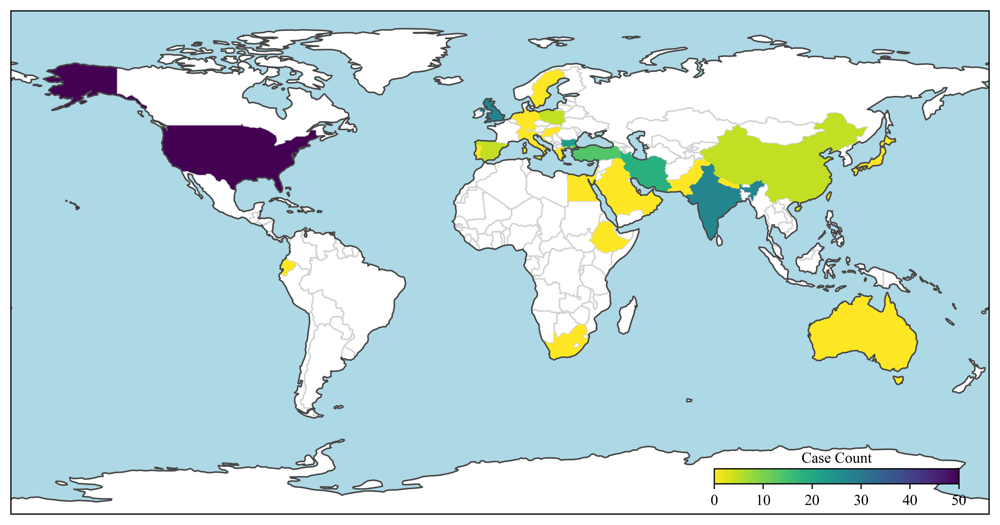

In [484]:
case_report_geog_summary = (
    case_data
    .groupby('Study_Country')
    .agg(
        Case_Count=('Patient_ID', 'count'),
        Citekey=('Citekey', lambda x: ', '.join(sorted(set(x))))
    )
    .reset_index()
)

case_report_geog_summary.columns = ['Country', 'Case_Count', 'Citekey']
case_report_geog_summary['Source'] = 'Case Report'

case_report_geog_summary['Plot_Country'] = case_report_geog_summary['Country'].replace(
    {'USA': 'United States of America',
     'UK': 'United Kingdom',
     'Republic of Korea': 'South Korea',
     'Bahrain': 'United Arab Emirates'}
)

import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import cartopy.crs as ccrs

# Copy data
plot_data = case_report_geog_summary[['Plot_Country', 'Case_Count']].copy()

# load Natural Earth country boundaries
shpfilename = shpreader.natural_earth(
    resolution='110m',
    category='cultural',
    name='admin_0_countries'
)
world = gpd.read_file(shpfilename)

# merge case counts into the GeoDataFrame
merged = world.merge(
    plot_data,
    how='left',
    left_on='ADMIN',
    right_on='Plot_Country'
)

# Plot the map
fig, ax = plt.subplots(
    figsize=(12, 6),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

# Base map
world.plot(ax=ax, facecolor='white', edgecolor='lightgrey', transform=ccrs.PlateCarree())

# Choropleth
chor = merged.dropna(subset=['Case_Count']).plot(
    ax=ax,
    column='Case_Count',
    cmap='viridis_r',
    legend=False,
    transform=ccrs.PlateCarree()
)

# Add coastlines and sea colour
ax.coastlines(color="#484848")
ax.set_facecolor('#ADD8E6')  # light blue sea

# Black ticks and spines
ax.tick_params(colors='black')
for spine in ax.spines.values():
    spine.set_edgecolor('black')

# Manual colorbar inset at bottom-right, moved up slightly
cax = inset_axes(ax, width="25%", height="3%", loc='lower right', borderpad=2)

# Set normalization and color mapping
norm = plt.Normalize(vmin=0, vmax=50)
sm = mpl.cm.ScalarMappable(cmap='viridis_r', norm=norm)
sm._A = []

# Add the colorbar with black styling
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal', ticks=[0, 10, 20, 30, 40, 50])
cbar.ax.set_title('Case Count', fontsize=10, color='black', pad=4)

# Style the tick lines, labels, and spine
cbar.outline.set_edgecolor('black')
cbar.ax.tick_params(color='black', labelcolor='black')
for tick in cbar.ax.get_xticklines():
    tick.set_color('black')

map_plot_list = []

# Add to list
map_plot_list.append(("Case Reports", fig, plot_data))

# Save figure
plot_path = os.path.join(REPORT_FIGURES_DIR, 'case_report_country_plot.png')
plt.savefig(plot_path, bbox_inches='tight')
plt.show()

In [485]:
len(case_data)
citekeys = ','.join(sorted(set(case_data['Citekey'].dropna())))
cite_block = rf"\cite{{{citekeys}}}"

In [486]:
case_report_geog_summary.sort_values(by='Case_Count', ascending=False)

,Country,Case_Count,Citekey,Source,Plot_Country
32,USA,12,"Alao_2006i, Ataya_2013, Bhumi_2024f, Fry_2010,...",Case Report,United States of America
11,India,7,"Bhasin_2014, Bhattacharjee_2008, Kar_2015, Kar...",Case Report,India
31,UK,7,"Beecroft_1998, Berry_2021e, Cauchi_2002, Cox_2...",Case Report,United Kingdom
2,Bulgaria,6,"Losanoff_1996, Losanoff_1997e",Case Report,Bulgaria
12,Iran,5,"DivsalarP._2023a, Emamhadi_2018, Farhadi_2024h",Case Report,Iran
30,Turkey,4,"Akay_2015f, Atayan_2016, Tanrikulu_2015e, Yild...",Case Report,Turkey
21,Poland,2,"Kobiela_2015, Wnęk_2015f",Case Report,Poland
26,Spain,2,"CamachoDorado_2018, fjbuilsRepeatedBehaviorDel...",Case Report,Spain
3,China,2,"Jin_2023, Li_2013",Case Report,China
27,Sweden,1,Naji_2012f,Case Report,Sweden


In [487]:
def create_short_text_summary(
        df,
        count_col='Count',
        var_col=None,   # must be specified
        n=3          # number of top entries to include
):
    if var_col is None:
        raise ValueError("You must specify var_col.")

    # Optionally limit to top-n by count
    df_sorted = df.sort_values(by=count_col, ascending=False)
    if n is not None:
        df_sorted = df_sorted.head(n)

    # Generate LaTeX-formatted phrases
    lines = [
        rf"{var} (\emph{{n}} = {count})"
        for var, count in zip(df_sorted[var_col], df_sorted[count_col])
    ]

    # Join with commas and "and"
    if len(lines) == 0:
        return ''
    elif len(lines) == 1:
        return lines[0] + '.'
    elif len(lines) == 2:
        return ' and '.join(lines) + '.'
    else:
        return ', '.join(lines[:-1]) + ', and ' + lines[-1] + '.'


In [488]:
case_geog_summary_text = create_short_text_summary(case_report_geog_summary,
                          var_col='Plot_Country',
                          count_col='Case_Count')

In [489]:
case_report_geog_summary['Percent'] = case_report_geog_summary['Case_Count'] / case_report_geog_summary['Case_Count'].sum() * 100
case_report_geog_summary = case_report_geog_summary.sort_values(by='Percent', ascending=False)


In [490]:
def calculate_median_iqr(series):
    """
    Calculate median and interquartile range (IQR) for a numeric column in a DataFrame.

    Parameters:
        df (pd.DataFrame): Input DataFrame.
        column (str): Name of the column to analyze.

    Returns:
        dict: Dictionary with median, q1, q3, and iqr.
    """
    series = series.dropna()

    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    median = series.median()
    iqr = q3 - q1

    return {
        'Median': median,
        'Q1': q1,
        'Q3': q3,
        'IQR': iqr
    }

In [491]:
case_geog_count_summary = calculate_median_iqr(case_report_geog_summary['Case_Count'])
case_geog_count_summary

{'Median': np.float64(1.0),
 'Q1': np.float64(1.0),
 'Q3': np.float64(2.0),
 'IQR': np.float64(1.0)}

In [492]:
section_path = os.path.join(SECTIONS_DIR, 'study_characteristics.tex')

case_report_description = f"""\\subsubsection{{Case Reports}}

A total of {len(case_data)} cases were reported {case_data['Study_Country'].nunique()} countries {cite_block}. 

The top three countries represented were the United States of America (\\emph{{n}} = 12), India (\\emph{{n}} = 7), and the United Kingdom (\\emph{{n}} = 7). The median number of case reports per country was {case_geog_count_summary['Median']} (IQR = {case_geog_count_summary['IQR']}[range {case_report_geog_summary['Case_Count'].min()}-{case_report_geog_summary['Case_Count'].max()}].

Cases were present from a wide age range (7 to 100 years) with a median age of 28 year [IQR = 18]. 

The majority of cases were reported in males (60\% vs 39\%), with 1 case of unknown gender. 

Half of cases had a psychiatric history and over a quarter (26\%) had ingested previously. 17\% were detained, 6\% were psychiatric inpatients, 10\% had a severe disability and 3\% (\emph{{n}} = 2) were displaced persons.

Psychiatric motivation was reported in nearly half of cases (48\%), with intent-to-harm and psychosocial reported in 29\% and 23\% of cases respectively. Protest was reported in 11\% of cases and other in 12\%.

Most ingestions involved large (\\textgreater{{}} 2.5cm) diameter (72\%), sharp (62\%) objects and multiple object ingestion (62\%). Almost 50\% of cases (48\%) involved sharp and sharp (45\%) object ingestion. Fewer ingestions involved magnets (12\%) and button batteries (2\%)

Complication rates were high (66\%), as were rates of endoscopy and surgery (61\% and 44\% respectively). Cases were only managed conservatively 10\% of the time. The mortality rate in case reports was 2.8\%. 

A table of case-level characteristics is shown in Table~\\ref{{tab:case_summary}}
"""

with open(section_path, 'w') as f:
    f.write(case_report_description)

print(case_report_description)

\subsubsection{Case Reports}

A total of 71 cases were reported 33 countries \cite{Akay_2015f,Al-Faham_2020k,AlShaaibi_2021b,Alao_2006i,Ali_2017,Ali_2020f,Ali_2022g,Apikotoa_2022f,Ataya_2013,Atayan_2016,Beecroft_1998,Benoist_2019e,Berry_2021e,Bhasin_2014,Bhattacharjee_2008,Bhumi_2024f,CamachoDorado_2018,Cauchi_2002,Chang_2017f,Cox_2007,Csaky_1998e,DelgadoSalazar_2020c,DivsalarP._2023a,Emamhadi_2018,Farhadi_2024h,Fry_2010,Gardner_2017h,Goldman_1998f,Guinan_2019f,Hardy_2023g,Jehangir_2019h,Jin_2023,Kar_2015,Kariholu_2008,Kerestes_2019,Kobiela_2015,Kumar_2001,Kumar_2019f,Li_2013,Liu_2005,Losanoff_1996,Losanoff_1997e,Mesfin_2022a,Misra_2013,Naji_2012f,Ohno_2005,Peixoto_2017f,Qureshi_2016,Riva_2018j,Sakellaridis_2008f,Sobnach_2011f,Sultan_2024f,Tammana_2012j,Tanrikulu_2015e,Tay_2004,Thapa_2019f,Trgo_2012f,Wadhwa_2015e,Wildhaber_2005,Wnęk_2015f,Yasin_2009,Yildiz_2016e,fjbuilsRepeatedBehaviorDeliberate2024,teWildt_2010}. 

The top three countries represented were the United States of America 

In [493]:
case_col_map

{'Metadata': {'Study_ID': {'Table': 'Study ID'},
  'Study_Country': {'Table': 'Country'},
  'Publication_Year': {'Table': 'Publication Year'},
  'Case_Count': {'Table': 'Case Count'},
  'Citekey': {'Table': 'Citekey'}},
 'Predictors': {'Gender': {'Gender_Male': {'Table': 'Male', 'Plot': 'Male'},
   'Gender_Female': {'Table': 'Female', 'Plot': 'Female'},
   'Gender_Unknown': {'Table': 'Unknown', 'Plot': 'Unknown Gender'}},
  'Age': {'Age_Yrs': {'Table': 'Age (Years)', 'Plot': 'Age (Years)'},
   'Age_Min': {'Table': 'Min', 'Plot': 'Min. Age'},
   'Age_Max': {'Table': 'Max', 'Plot': 'Max. Age'},
   'Age_Median': {'Table': 'Median', 'Plot': 'Median Age'},
   'Age_Mean': {'Table': 'Mean', 'Plot': 'Mean Age'},
   'Age_IQR': {'Table': 'IQR', 'Plot': 'IQR Age'}},
  'Age Group': {'Age_<18': {'Table': 'Child/Adolescent (<18)',
    'Plot': 'Child/Adolescent (<18yrs)'},
   'Age_18_24': {'Table': 'Young Adult (18–24)',
    'Plot': 'Young Adult (18–24yrs)'},
   'Age_25_39': {'Table': 'Adult (25–39)'

#### Case Series

In [494]:
series_data = included_series_data.copy()

citekeys = sorted(set(series_data['Citekey']))
citekey_block = '\\cite{' + ', '.join(citekeys) + '}' if citekeys else ''

In [495]:
def remove_rates_and_rename_cases(df):
    # Drop columns ending with '_Rates'
    df = df.drop(columns=[col for col in df.columns if col.endswith('_Rate')])

    # Rename columns ending with '_Cases' by removing the suffix
    df = df.rename(columns={
        col: col.replace('_Cases', '') for col in df.columns if col.endswith('_Cases')
    })

    return df    

series_data = remove_rates_and_rename_cases(series_data)

In [496]:
series_data = series_data.rename(columns={
    'Age_Low': 'Age_Min',
    'Age_High': 'Age_Max'
})

In [497]:
predictor_vars = []
for group_name, group_vars in case_col_map['Predictors'].items():
    if group_name == 'Age':
        # Only include age band variables
        for var in group_vars:
            if var in ['Age_<18', 'Age_18_24', 'Age_25_39', 'Age_40_64', 'Age_65plus']:
                predictor_vars.append(var)
    else:
        predictor_vars.extend(group_vars.keys())

outcome_vars = list(case_col_map['Outcomes'].keys())

all_vars = predictor_vars + outcome_vars

# Create all_case_vars as a copy of all_vars
all_case_vars = all_vars.copy()

# Create all_series_vars by excluding specific variables
exclude_vars = ['Age_Yrs', 'Age_IQR', 'Age_Category',
       'Age_<18', 'Age_18_24', 'Age_25_39', 'Age_40_64', 'Age_65plus']

all_series_vars = [var for var in all_vars if var not in exclude_vars]

all_series_vars.append('Case_Count')
all_series_vars.append('Study_Country')

In [498]:
def weighted_mean(values: pd.Series, weights: pd.Series) -> float:
    """Compute the weighted mean of values with weights."""
    values = pd.to_numeric(values, errors='coerce')
    weights = pd.to_numeric(weights, errors='coerce')
    valid = values.notna() & weights.notna()

    if valid.sum() == 0:
        return float('nan')

    return (values[valid] * weights[valid]).sum() / weights[valid].sum()

def weighted_median(values: pd.Series, weights: pd.Series) -> float:
    """Compute the weighted median of a pandas Series with weights."""
    values = pd.to_numeric(values, errors='coerce')
    weights = pd.to_numeric(weights, errors='coerce')
    valid = values.notna() & weights.notna()

    if valid.sum() == 0:
        return float('nan')

    sorted_data = pd.DataFrame({'values': values[valid], 'weights': weights[valid]}).sort_values('values')
    cum_weights = sorted_data['weights'].cumsum()
    cutoff = sorted_data['weights'].sum() / 2.0
    return sorted_data.loc[cum_weights >= cutoff, 'values'].iloc[0]

In [499]:
# Start with an empty dictionary
series_total_row = {'Comments': 'Cases Series'}

weight_col = 'Case_Count'

# Calculate weighted statistics
weighted_series_age_mean = weighted_mean(series_data['Age_Mean'], series_data[weight_col])
weighted_series_age_median = weighted_median(series_data['Age_Median'], series_data[weight_col])

# Start with a sum of all numeric columns
series_total_row = series_data.select_dtypes(include='number').sum().to_dict()

# Overwrite Age_Mean and Age_Median with weighted values
series_total_row['Age_Mean'] = weighted_mean(series_data['Age_Mean'], series_data[weight_col])
series_total_row['Age_Median'] = weighted_median(series_data['Age_Median'], series_data[weight_col])
series_total_row['Age_IQR'] = np.nan
series_total_row['Age_Min'] = series_data['Age_Min'].min()
series_total_row['Age_Max'] = series_data['Age_Max'].max()

# Add label
series_total_row['Comments'] = 'Series Only Totals'

series_total_row['Study_ID'] = 'Case_Series'

# Append to DataFrame
series_data_pooled = pd.concat([series_data, pd.DataFrame([series_total_row])], ignore_index=True)

In [500]:
series_data_pooled

,Study_ID,Comments,Patient_Count,Case_Count,Age_Min,Age_Max,Age_Mean,Age_Median,Verified_Ingestion,Gender_Male,...,Overall_Appraisal,Reviewer_Initials,Review_Date,Comments_Reasoning,Setting_Population,Study_Objective,Study_Method,Study_Results,Study_Conclusion,Age_IQR
0,523,"""The most common motive for swallowing was sui...",19.0,19.0,17.0,40.0,24.0,NaN,19.0,19.0,...,Include,JGE,2025-05-14,No comment.,Medical prison ward for men in a New York City...,Records were examined for demographic and psyc...,Two psychiatrically trained raters examined th...,See statistical breakdown.,In our series of 19 prisoners who ingested obj...,NaN
1,581,"""In summary, the foreign objects in prisoners ...",33.0,52.0,25.0,50.0,NaN,35.0,52.0,52.0,...,Include,JGE,2025-06-02,No comment.,Prisoners attended two hospitals in South Korea.,To investigate the time interval between forei...,Reviewed the medical records and endoscopic fi...,All the patients were male with a mean age of ...,The foreign objects in prisoners were a variet...,NaN
2,646,NaN,16.0,19.0,19.0,27.0,24.0,NaN,19.0,19.0,...,Include,JGE,2025-05-14,No comment.,Patients referred from prison to Department of...,A descriptive study including all detainees in...,NaN,"There were 16 men with a mean age of 24 years,...",Our experience enabled us to confirm the few d...,NaN
3,Case_Series,Series Only Totals,68.0,90.0,17.0,50.0,24.0,35.0,90.0,90.0,...,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [501]:
all_case_vars

['Gender_Male',
 'Gender_Female',
 'Gender_Unknown',
 'Age_<18',
 'Age_18_24',
 'Age_25_39',
 'Age_40_64',
 'Age_65plus',
 'Is_Prisoner',
 'Is_Psych_Inpat',
 'Is_Displaced_Person',
 'Under_Influence_Alcohol',
 'Psych_Hx',
 'Severe_Disability_Hx',
 'Previous_Ingestions',
 'Motivation_Protest',
 'Motivation_Psychiatric',
 'Motivation_Psychosocial',
 'Motivation_Intent_To_Harm',
 'Motivation_Other',
 'Object_Sharp',
 'Object_Long',
 'Object_Multiple',
 'Object_Button_Battery',
 'Object_Magnet',
 'Object_Diameter_Large',
 'Outcome_Endoscopy',
 'Outcome_Death',
 'Outcome_Surgery',
 'Outcome_Complication',
 'Outcome_Conservative']

In [502]:
all_series_vars

['Gender_Male',
 'Gender_Female',
 'Gender_Unknown',
 'Is_Prisoner',
 'Is_Psych_Inpat',
 'Is_Displaced_Person',
 'Under_Influence_Alcohol',
 'Psych_Hx',
 'Severe_Disability_Hx',
 'Previous_Ingestions',
 'Motivation_Protest',
 'Motivation_Psychiatric',
 'Motivation_Psychosocial',
 'Motivation_Intent_To_Harm',
 'Motivation_Other',
 'Object_Sharp',
 'Object_Long',
 'Object_Multiple',
 'Object_Button_Battery',
 'Object_Magnet',
 'Object_Diameter_Large',
 'Outcome_Endoscopy',
 'Outcome_Death',
 'Outcome_Surgery',
 'Outcome_Complication',
 'Outcome_Conservative',
 'Case_Count',
 'Study_Country']

In [503]:
all_series_vars.extend(['Age_Mean', 'Age_Min', 'Age_Median', 'Age_Max'])

In [504]:
# Create list of all_studies
series_ids = series_data_pooled['Study_ID'].unique().tolist()

# Melt series data for display
series_data_melted = series_data_pooled.melt(
    id_vars=['Study_ID'],
    value_vars=all_series_vars,
    var_name='Variable',
    value_name='Value'
)

# Pivot
series_data_pivot = series_data_melted.pivot(
    index=['Variable'],
    columns='Study_ID',
    values='Value'
)

# Reindex rows to all variables
series_data_pivot = series_data_pivot.reindex(all_series_vars)
series_data_pivot


Study_ID,523,581,646,Case_Series
Variable,,,,
Gender_Male,19.0,52.0,19.0,90.0
Gender_Female,0.0,0.0,0.0,0.0
Gender_Unknown,0.0,0.0,0.0,0.0
Is_Prisoner,19.0,52.0,19.0,90.0
Is_Psych_Inpat,0.0,0.0,0.0,0.0
Is_Displaced_Person,NaN,NaN,NaN,0.0
Under_Influence_Alcohol,NaN,NaN,NaN,0.0
Psych_Hx,18.0,9.464,2.375,29.839
Severe_Disability_Hx,NaN,0.0,NaN,0.0


In [505]:
# Create count columns
series_data_pivot.columns = [f"{col}_Count" for col in series_data_pivot.columns]

In [506]:
# Build variable → group mapping from case_col_map
var_to_group = {}
for group_name, variables in case_col_map['Predictors'].items():
    for var in variables:
        var_to_group[var] = group_name
for var in case_col_map['Outcomes']:
    var_to_group[var] = 'Outcome'

# Add a 'Group' column based on the index (which is Variable)
series_data_pivot['Group'] = series_data_pivot.index.map(var_to_group)

In [507]:
series_data_pivot

,523_Count,581_Count,646_Count,Case_Series_Count,Group
Variable,,,,,
Gender_Male,19.0,52.0,19.0,90.0,Gender
Gender_Female,0.0,0.0,0.0,0.0,Gender
Gender_Unknown,0.0,0.0,0.0,0.0,Gender
Is_Prisoner,19.0,52.0,19.0,90.0,Demographic
Is_Psych_Inpat,0.0,0.0,0.0,0.0,Demographic
Is_Displaced_Person,NaN,NaN,NaN,0.0,Demographic
Under_Influence_Alcohol,NaN,NaN,NaN,0.0,Demographic
Psych_Hx,18.0,9.464,2.375,29.839,Demographic
Severe_Disability_Hx,NaN,0.0,NaN,0.0,Demographic


In [508]:
def create_percentage_column(df, col, group):
    df = df.copy()

    # Filter rows belonging to the desired group
    group_df = df[df['Group'] == group]

    # Get denominator (sum of the column within this group)
    denominator = group_df[col].sum()

    # Avoid division by zero
    if denominator == 0:
        return df

    # Compute percentages only for rows in the group
    for idx in group_df.index:
        count = df.at[idx, col]
        percent = (count / denominator) * 100 if pd.notna(count) else None
        percentage_col = col.replace('_Count', '_Percentage')
        df.at[idx, percentage_col] = percent

    return df

# Copy base DataFrame
updated_df = series_data_pivot.copy()

# Identify count columns (one per study)
desired_cols = [col for col in updated_df.columns if col.endswith('_Count')]

# Define which groups to calculate percentages for
desired_groups = ['Gender', 'Demographic', 'Motivation', 'Object', 'Outcome']

# Apply
for group in desired_groups:
    for col in desired_cols:
        updated_df = create_percentage_column(updated_df, col, group)

# View result
series_data_pivot = updated_df.copy()

In [509]:
# --- Setup ---
study_ids = ['523', '581', '646']
count_cols = [f'{sid}_Count' for sid in study_ids]
percent_cols = [f'{sid}_Percentage' for sid in study_ids]
weighted_cols = [f'{sid}_Weighted' for sid in study_ids]

# Sanity check
if 'Case_Count' not in series_data_pivot.index:
    raise ValueError("Missing 'Case_Count' row.")

# Get case counts
case_counts = series_data_pivot.loc['Case_Count', count_cols].astype(float)
total_case_count = case_counts.sum()
series_total = series_data_pivot.loc['Case_Count', 'Case_Series_Count']

# Rows to compute (exclude metadata rows)
compute_mask = ~series_data_pivot.index.isin(['Case_Count', 'Study_Country', 'Age_Min', 'Age_Max', 'Age_Median', 'Age_Mean', 'Age_IQR'])

# --- Loop through each study ---
for sid in study_ids:
    count_col = f'{sid}_Count'
    percent_col = f'{sid}_Percentage'
    weighted_col = f'{sid}_Weighted'
    study_total = case_counts[count_col]

    if pd.isna(study_total) or study_total == 0:
        continue

    # For all non-metadata rows
    series_data_pivot.loc[compute_mask, percent_col] = (
        series_data_pivot.loc[compute_mask, count_col].astype(float) / study_total * 100
    ).round(1)

    series_data_pivot.loc[compute_mask, weighted_col] = (
        series_data_pivot.loc[compute_mask, count_col].astype(float) / total_case_count * 100
    ).round(1)

    # Set Case_Count row
    series_data_pivot.loc['Case_Count', percent_col] = round(study_total / total_case_count * 100, 1)
    series_data_pivot.loc['Case_Count', weighted_col] = round(study_total / total_case_count * 100, 1)

# --- Case_Series_Percentage fix ---
if 'Case_Series_Count' in series_data_pivot.columns:
    series_case_total = series_data_pivot.loc['Case_Count', 'Case_Series_Count']
    if not pd.isna(series_case_total) and series_case_total != 0:
        series_data_pivot.loc[compute_mask, 'Case_Series_Percentage'] = (
            series_data_pivot.loc[compute_mask, 'Case_Series_Count'].astype(float) / series_case_total * 100
        ).round(1)

        # And the Case_Count row should just be 100%
        series_data_pivot.loc['Case_Count', 'Case_Series_Percentage'] = 100.0

series_data_pivot

,523_Count,581_Count,646_Count,Case_Series_Count,Group,523_Percentage,581_Percentage,646_Percentage,Case_Series_Percentage,523_Weighted,581_Weighted,646_Weighted
Variable,,,,,,,,,,,,
Gender_Male,19.0,52.0,19.0,90.0,Gender,100.0,100.0,100.0,100.0,21.1,57.8,21.1
Gender_Female,0.0,0.0,0.0,0.0,Gender,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gender_Unknown,0.0,0.0,0.0,0.0,Gender,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Is_Prisoner,19.0,52.0,19.0,90.0,Demographic,100.0,100.0,100.0,100.0,21.1,57.8,21.1
Is_Psych_Inpat,0.0,0.0,0.0,0.0,Demographic,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Is_Displaced_Person,NaN,NaN,NaN,0.0,Demographic,NaN,NaN,NaN,0.0,NaN,NaN,NaN
Under_Influence_Alcohol,NaN,NaN,NaN,0.0,Demographic,NaN,NaN,NaN,0.0,NaN,NaN,NaN
Psych_Hx,18.0,9.464,2.375,29.839,Demographic,94.7,18.2,12.5,33.2,20.0,10.5,2.6
Severe_Disability_Hx,NaN,0.0,NaN,0.0,Demographic,NaN,0.0,NaN,0.0,NaN,0.0,NaN


In [510]:
series_data[['Study_ID', 'Citekey']]

,Study_ID,Citekey
0,523,Karp_1991b
1,581,Lee_2007
2,646,Elghali_2016


In [511]:
series_data_summary_text = f"""\\subsubsection{{Case Series}}

{len(series_data)} studies were case series, yielding {series_data['Case_Count'].sum():.0f} cases {citekey_block}. Case series were present from the United States of America \\cite{{Karp_1991b}} ($n = 19$), South Korea \\cite{{Lee_2007}} ($n = 52$) and Tunisia \\cite{{Elghali_2016}} ($n = 19$).

Values reported herein are mean averages across all case series. Unreported variables are treated as 0.

All cases were male, aged 17--50 years and detained 33\% had a psychiatric history (range 82-95\%) - no psychiatric inpatients. 

Demographic predictors were poorly recorded. Previous ingestion rates were only reported in one series at 11\%. There was no severe disability (not reporting in two series). Data on displaced person and alcohol influence were not reported at all.

Motivations were predominantly protest (78\%, range 16-97\%); psychiatric in 13\% (63.2\% in one series, 0\% in the other two); intent-to-harm in 7\% (range 0-21\%). There were no reports of other motivation or psychosocial motivation. 

One series only report sharp object ingestion and no other object characteristics \\cite{{Karp_1991b}}. In the other two series, overall ingestion involed a sharp object in most cases (76\%, range 64-100\%). Long objects were ingested 37\% of cases (36\%, 0-67\%), multiple objects were ingested in (27.8\%, range 0-67\%)

In terms of outcomes, complications were only reported in one series \\cite{{Lee_2007}}, data was absent from the other two. Endoscopy occuring in 52\% (range 5-89\%), although it was unreported in one series \\cite{{Karp_1991b}}. Surgery occured following 17\% of ingestions (range 12-26\%), conservative management following 32\% (0\% in one case and above 70\% in the other two).

A full list of grouped series-level characteristics and outcomes is available in Table~\\ref{{tab:series_results}}.
"""

output_path = os.path.join(SECTIONS_DIR, 'study_characteristics.tex')
with open(output_path, 'a') as f:
    f.write(series_data_summary_text)


In [512]:
series_data_pivot

,523_Count,581_Count,646_Count,Case_Series_Count,Group,523_Percentage,581_Percentage,646_Percentage,Case_Series_Percentage,523_Weighted,581_Weighted,646_Weighted
Variable,,,,,,,,,,,,
Gender_Male,19.0,52.0,19.0,90.0,Gender,100.0,100.0,100.0,100.0,21.1,57.8,21.1
Gender_Female,0.0,0.0,0.0,0.0,Gender,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gender_Unknown,0.0,0.0,0.0,0.0,Gender,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Is_Prisoner,19.0,52.0,19.0,90.0,Demographic,100.0,100.0,100.0,100.0,21.1,57.8,21.1
Is_Psych_Inpat,0.0,0.0,0.0,0.0,Demographic,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Is_Displaced_Person,NaN,NaN,NaN,0.0,Demographic,NaN,NaN,NaN,0.0,NaN,NaN,NaN
Under_Influence_Alcohol,NaN,NaN,NaN,0.0,Demographic,NaN,NaN,NaN,0.0,NaN,NaN,NaN
Psych_Hx,18.0,9.464,2.375,29.839,Demographic,94.7,18.2,12.5,33.2,20.0,10.5,2.6
Severe_Disability_Hx,NaN,0.0,NaN,0.0,Demographic,NaN,0.0,NaN,0.0,NaN,0.0,NaN


In [513]:
def format_authors(authors):
    if isinstance(authors, str) and ';' in authors:
        first_author = authors.split(';')[0].split(',')[0].strip()
        return f"{first_author} \\textit{{et al.}}"
    elif isinstance(authors, str):
        # Just one author
        return authors.split(',')[0].strip()
    else:
        return ""

series_data['Author_Tex'] = series_data['Authors'].apply(format_authors)

series_data['Author_Year_Tex'] = series_data.apply(
    lambda row: f"{row['Author_Tex']} ({row['Publication_Year']}) \\cite{{{row['Citekey']}}}", axis=1
)

series_data_pivot.columns = [
    'Pooled' if col == 'Case_Series' else col
    for col in series_data_pivot.columns
]

In [514]:
series_data_pivot

,523_Count,581_Count,646_Count,Case_Series_Count,Group,523_Percentage,581_Percentage,646_Percentage,Case_Series_Percentage,523_Weighted,581_Weighted,646_Weighted
Variable,,,,,,,,,,,,
Gender_Male,19.0,52.0,19.0,90.0,Gender,100.0,100.0,100.0,100.0,21.1,57.8,21.1
Gender_Female,0.0,0.0,0.0,0.0,Gender,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gender_Unknown,0.0,0.0,0.0,0.0,Gender,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Is_Prisoner,19.0,52.0,19.0,90.0,Demographic,100.0,100.0,100.0,100.0,21.1,57.8,21.1
Is_Psych_Inpat,0.0,0.0,0.0,0.0,Demographic,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Is_Displaced_Person,NaN,NaN,NaN,0.0,Demographic,NaN,NaN,NaN,0.0,NaN,NaN,NaN
Under_Influence_Alcohol,NaN,NaN,NaN,0.0,Demographic,NaN,NaN,NaN,0.0,NaN,NaN,NaN
Psych_Hx,18.0,9.464,2.375,29.839,Demographic,94.7,18.2,12.5,33.2,20.0,10.5,2.6
Severe_Disability_Hx,NaN,0.0,NaN,0.0,Demographic,NaN,0.0,NaN,0.0,NaN,0.0,NaN


In [515]:
study_id_map = {
    'Case_Series': 'Pooled',
    '523': 'Karp \\textit{et al.} (1991) \\cite{Karp_1991b}',
    '581': 'Lee \\textit{et al.} (2007) \\cite{Lee_2007}',
    '646': 'Elghali \\textit{et al.} (2016) \\cite{Elghali_2016}'
}

In [516]:
def pivot_df_to_tex_table_v2(
    df,
    case_col_map=case_col_map,
    study_id_map=None,
    caption="Grouped aggregate series-level summary.",
    label="tab:series_results",
    note_text=r"$n$, \\%. Pooled = predictor and outcome mean average rates across series'.",
    groups_no_percentage={"Age"},
    study_order=None
):
    """
    Converts your pivoted df to a LaTeX table using tabularx and adjustbox:
    - Uses case_col_map to label rows via Table_Label
    - Groups by 'Group' column
    - Omits non-variable rows like Case_Count and Study_Country
    """

    def lookup_table_label(var):
        # Outcomes: flat dict
        if var in case_col_map.get('Outcomes', {}):
            return case_col_map['Outcomes'][var]['Table']
        # Predictors: nested by group
        for group_dict in case_col_map.get('Predictors', {}).values():
            if var in group_dict:
                return group_dict[var]['Table']
        # Raise error if not found
        raise KeyError(f"Variable '{var}' not found in case_col_map.")

    # Extract study IDs
    if study_order:
        study_ids = study_order
    else:
        study_ids = sorted({col.split("_")[0] for col in df.columns if col.endswith("_Count") and col[:3].isdigit()})

    # Map study_id to label
    study_labels = [study_id_map.get(sid, sid) for sid in study_ids] if study_id_map else study_ids

    # Drop metadata rows
    data = df.drop(index=[idx for idx in df.index if idx in ['Case_Count', 'Study_Country']], errors='ignore')

    # Add Table_Label from case_col_map
    data = data.copy()
    data['Table_Label'] = data.index.map(lookup_table_label)

    # Sort rows within groups
    sorted_rows = []
    for group, group_df in data.groupby('Group', sort=False):
        sorted_group = group_df if group in groups_no_percentage else group_df.sort_values(by=f"{study_ids[0]}_Count", ascending=False)
        sorted_rows.append(sorted_group)
    sorted_df = pd.concat(sorted_rows)

    # Group totals
    group_totals = {
        group: {
            sid: group_df.get(f"{sid}_Count", pd.Series()).sum(skipna=True)
            for sid in study_ids
        }
        for group, group_df in sorted_df.groupby('Group')
    }

    column_spec = "p{5cm}" + "".join(">{\\centering\\arraybackslash}X" for _ in study_ids)

    latex_str = (
        "\\begin{table*}[tb]\n"
        f"\\caption{{{caption}}}\n"
        f"\\label{{{label}}}\n"
        "\\centering\n"
        "\\renewcommand{\\arraystretch}{1.2}\n"
        "\\small\n"
        "\\begin{adjustbox}{width=\\textwidth}\n"
        f"\\begin{{tabularx}}{{\\textwidth}}{{{column_spec}}}\n"
        "\\toprule\n"
        "\\textbf{Variable} " + "".join([f"& \\textbf{{{lbl}}} " for lbl in study_labels]) + "\\\\\n"
        "\\midrule\n"
    )

    # Total Cases row
    case_count_row = df.loc['Case_Count'] if 'Case_Count' in df.index else None
    if case_count_row is not None:
        latex_str += "\\multicolumn{1}{l}{\\textit{Total Cases}} & " + " & ".join(
            f"{int(round(case_count_row.get(f'{sid}_Count', np.nan)))}"
            if pd.notna(case_count_row.get(f"{sid}_Count", np.nan)) else "---"
            for sid in study_ids
        ) + " \\\\\n"

    # Content rows
    last_group = None
    for var, row in sorted_df.iterrows():
        group = row.get('Group', 'Unknown')
        label = row.get('Table_Label', var)

        if group != last_group:
            latex_str += f"\\textit{{{group}}}" + " &" * len(study_ids) + " \\\\\n"
            last_group = group

        cells = []
        for sid in study_ids:
            count = row.get(f"{sid}_Count")
            percent = row.get(f"{sid}_Percentage")
            if pd.notna(count):
                if group in groups_no_percentage or pd.isna(percent):
                    cells.append(f"{int(round(count))}")
                else:
                    cells.append(f"{int(round(count))} ({round(percent)}\\%)")
            else:
                cells.append("---")
        latex_str += f"\\hspace{{1em}}{label} & " + " & ".join(cells) + " \\\\\n"

    latex_str += (
        "\\bottomrule\n"
        f"\\multicolumn{{{1 + len(study_ids)}}}{{l}}{{\\parbox{{\\linewidth}}{{\\small {note_text}}}}}\n"
        "\\end{tabularx}\n"
        "\\end{adjustbox}\n"
        "\\end{table*}\n"
    )

    return latex_str

In [517]:
series_data_pivot_latex_table = pivot_df_to_tex_table_v2(
    series_data_pivot,
    study_id_map=study_id_map,
    study_order=['Case_Series', '523', '581', '646'],
    note_text=r"Key: \emph{n} (\%).")

table_path = os.path.join(TABLES_DIR, 'case_series_table.tex')
with open(table_path, 'w') as f:
    f.write(series_data_pivot_latex_table)

#### Pivot and aggregate

In [518]:
case_age_median = case_data['Age_Yrs'].median()
case_age_mean = case_data['Age_Yrs'].mean()
case_age_min = case_data['Age_Yrs'].min()
case_age_max = case_data['Age_Yrs'].max()
q1 = case_data['Age_Yrs'].quantile(0.25)
q3 = case_data['Age_Yrs'].quantile(0.75)
case_age_iqr = q3 - q1
case_data_case_count = len(case_data)

In [519]:
cols_to_pivot = ['Study_ID', 'Study_Country', 'Citekey', 'Case_Count'] + predictor_vars + outcome_vars

In [520]:
# Step 1: Sum selected variables
case_data_pooled = case_data[predictor_vars + outcome_vars].sum()

# Add age statistics
case_data_pooled['Age_Median'] = case_age_median
case_data_pooled['Age_Mean'] = case_age_mean
case_data_pooled['Age_IQR'] = case_age_iqr
case_data_pooled['Age_Min'] = case_age_min
case_data_pooled['Age_Max'] = case_age_max
case_data_pooled['Case_Count'] = case_data_case_count

# Add metadata
case_data_pooled['Study_ID'] = 'Case_Reports'
case_data_pooled['Citekey'] = ", ".join(case_data['Citekey'].dropna().unique())

# Start from existing pivot
series_data_case_data_pivot = series_data_pivot.copy()

# Add Case_Report_Count column where variable already exists
common_vars = series_data_case_data_pivot.index.intersection(case_data_pooled.index)
series_data_case_data_pivot.loc[common_vars, 'Case_Report_Count'] = case_data_pooled.loc[common_vars]

# Identify new variables not in pivot
missing_vars = case_data_pooled.index.difference(series_data_case_data_pivot.index)

# Create new rows from the missing variables
new_rows = pd.DataFrame(index=missing_vars)
new_rows['Case_Report_Count'] = case_data_pooled.loc[missing_vars]
new_rows.index.name = series_data_case_data_pivot.index.name  # Ensure index alignment

# Append new rows
series_data_case_data_pivot = pd.concat([series_data_case_data_pivot, new_rows], axis=0)

# Sort
series_data_case_data_pivot = series_data_case_data_pivot.sort_index()

# Drop temp metadata columns if they ended up in index
series_data_case_data_pivot = series_data_case_data_pivot.drop(columns=['Study_ID', 'Citekey'], errors='ignore')

In [521]:
case_data_pooled

Gender_Male                                                               43.0
Gender_Female                                                             27.0
Gender_Unknown                                                             1.0
Age_<18                                                                   13.0
Age_18_24                                                                 17.0
Age_25_39                                                                 25.0
Age_40_64                                                                 11.0
Age_65plus                                                                 3.0
Is_Prisoner                                                               12.0
Is_Psych_Inpat                                                             4.0
Is_Displaced_Person                                                        2.0
Under_Influence_Alcohol                                                    3.0
Psych_Hx                                            

In [522]:
# --- Compute Case_Report_Percentage ---

# Ensure we're not modifying in place
series_data_case_data_pivot = series_data_case_data_pivot.copy()

# Define metadata rows to exclude
meta_rows = [
    'Study_ID', 'Study_Country', 'Citekey', 'Age_Min', 'Age_Max',
    'Age_Median', 'Age_Mean', 'Age_IQR', 'Case_Series_Count'
]

# Create compute mask (rows to compute percentages for)
compute_mask = ~series_data_case_data_pivot.index.isin(meta_rows)

# Get total number of case reports
if 'Case_Count' in series_data_case_data_pivot.index:
    case_report_total = series_data_case_data_pivot.loc['Case_Count', 'Case_Report_Count']
else:
    case_report_total = series_data_case_data_pivot['Case_Report_Count'].sum()

# Only compute if valid
if not pd.isna(case_report_total) and case_report_total > 0:
    # Compute percentages for all valid rows
    series_data_case_data_pivot.loc[compute_mask, 'Case_Report_Percentage'] = (
        series_data_case_data_pivot.loc[compute_mask, 'Case_Report_Count'].astype(float) / case_report_total * 100
    ).round(1)

    # Set Case_Count row to 100%
    if 'Case_Count' in series_data_case_data_pivot.index:
        series_data_case_data_pivot.loc['Case_Count', 'Case_Report_Percentage'] = 100.0

In [523]:
# --- Copy to avoid modifying original ---
series_data_case_data_pivot = series_data_case_data_pivot.copy()

# --- Define metadata rows (to exclude from numeric calculations) ---
meta_rows = [
    'Study_ID', 'Study_Country', 'Citekey',
    'Age_Min', 'Age_Max', 'Age_Median', 'Age_Mean', 'Age_IQR'
]

# --- Mask for rows we want to compute pooled stats for ---
compute_mask = ~series_data_case_data_pivot.index.isin(meta_rows)

# --- Compute pooled count ONLY for compute_mask rows ---
series_data_case_data_pivot.loc[compute_mask, 'Pooled_Count'] = (
    pd.to_numeric(series_data_case_data_pivot.loc[compute_mask, 'Case_Report_Count'], errors='coerce').fillna(0) +
    pd.to_numeric(series_data_case_data_pivot.loc[compute_mask, 'Case_Series_Count'], errors='coerce').fillna(0)
)

# --- Get total pooled count for percentage calculations ---
if 'Case_Count' in series_data_case_data_pivot.index:
    pooled_total = series_data_case_data_pivot.at['Case_Count', 'Pooled_Count']
else:
    pooled_total = series_data_case_data_pivot.loc[compute_mask, 'Pooled_Count'].sum()

# --- Compute pooled percentage ---
if pd.notna(pooled_total) and pooled_total > 0:
    series_data_case_data_pivot.loc[compute_mask, 'Pooled_Percentage'] = (
        series_data_case_data_pivot.loc[compute_mask, 'Pooled_Count'] / pooled_total * 100
    ).round(1)

    # Case_Count row should explicitly be 100%
    series_data_case_data_pivot.loc['Case_Count', 'Pooled_Percentage'] = 100.0

In [524]:
series_data_case_data_pivot

,523_Count,581_Count,646_Count,Case_Series_Count,Group,523_Percentage,581_Percentage,646_Percentage,Case_Series_Percentage,523_Weighted,581_Weighted,646_Weighted,Case_Report_Count,Case_Report_Percentage,Pooled_Count,Pooled_Percentage
Variable,,,,,,,,,,,,,,,,
Age_18_24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,23.9,17.000,10.6
Age_25_39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,35.2,25.000,15.5
Age_40_64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,15.5,11.000,6.8
Age_65plus,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,4.2,3.000,1.9
Age_<18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,18.3,13.000,8.1
Age_IQR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,NaN,NaN,NaN
Age_Max,40.0,50.0,27.0,50.0,Age,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NaN,NaN,NaN
Age_Mean,24.0,NaN,24.0,24.0,Age,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.550725,NaN,NaN,NaN
Age_Median,NaN,35.0,NaN,35.0,Age,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.0,NaN,NaN,NaN


### Chi2

In [525]:
from scipy.stats import chi2_contingency, fisher_exact
import numpy as np
import pandas as pd

def lookup_table_label_and_group(var, case_col_map):
    if var in case_col_map.get('Outcomes', {}):
        return case_col_map['Outcomes'][var]['Table'], 'Outcome'
    for group_name, group_dict in case_col_map.get('Predictors', {}).items():
        if var in group_dict:
            return group_dict[var]['Table'], group_name
    return var, 'Unknown'  # fallback

def univariate_association_test(
    df: pd.DataFrame,
    case_col_map: dict,
    alpha: float = 0.05,
) -> pd.DataFrame:
    """
    Run chi-square or Fisher's exact tests on binary predictor/outcome combinations.
    Labels and groups are mapped using case_col_map.
    """

    # Extract predictor and outcome columns
    predictors = [
        var for group in case_col_map.get("Predictors", {}).values()
        for var in group.keys()
    ]
    outcomes = list(case_col_map.get("Outcomes", {}).keys())

    results = []

    for predictor in predictors:
        for outcome in outcomes:
            try:
                subset = df[[predictor, outcome]].dropna()

                if set(subset[predictor].unique()).issubset({0, 1}) and set(subset[outcome].unique()).issubset({0, 1}):
                    table = pd.crosstab(subset[predictor], subset[outcome])
                    table = table.reindex(index=[0, 1], columns=[0, 1], fill_value=0)

                    if table.shape == (2, 2):
                        chi2, p_chi2, _, expected = chi2_contingency(table)

                        if (expected < 5).any():
                            p = fisher_exact(table)[1]
                            note = "Fisher's Exact used"
                        else:
                            p = p_chi2
                            note = "Chi2 used"

                        a, b = table.loc[1, 1], table.loc[1, 0]
                        c, d = table.loc[0, 1], table.loc[0, 0]

                        if b == 0 or c == 0 or a == 0 or d == 0:
                            odds_ratio = np.nan
                            ci_lower = np.nan
                            ci_upper = np.nan
                        else:
                            odds_ratio = (a * d) / (b * c)
                            log_or = np.log(odds_ratio)
                            se = np.sqrt(1/a + 1/b + 1/c + 1/d)
                            z = 1.96
                            ci_lower = np.exp(log_or - z * se)
                            ci_upper = np.exp(log_or + z * se)

                        predictor_label, group = lookup_table_label_and_group(predictor, case_col_map)
                        outcome_label, _ = lookup_table_label_and_group(outcome, case_col_map)

                        results.append({
                            "Group": group,
                            "Predictor": predictor,
                            "Predictor_Label": predictor_label,
                            "Outcome": outcome,
                            "Outcome_Label": outcome_label,
                            "P-value": p,
                            "Odds Ratio": odds_ratio,
                            "95% CI Lower": ci_lower,
                            "95% CI Upper": ci_upper,
                            "Note": note
                        })
                    else:
                        results.append({
                            "Group": group,
                            "Predictor": predictor,
                            "Predictor_Label": predictor,
                            "Outcome": outcome,
                            "Outcome_Label": outcome,
                            "P-value": None,
                            "Odds Ratio": None,
                            "95% CI Lower": None,
                            "95% CI Upper": None,
                            "Note": f"Not 2x2: shape {table.shape}"
                        })
                else:
                    results.append({
                        "Group": group,
                        "Predictor": predictor,
                        "Predictor_Label": predictor,
                        "Outcome": outcome,
                        "Outcome_Label": outcome,
                        "P-value": None,
                        "Odds Ratio": None,
                        "95% CI Lower": None,
                        "95% CI Upper": None,
                        "Note": "Not binary 0/1 values"
                    })

            except Exception as e:
                results.append({
                    "Group": "Error",
                    "Predictor": predictor,
                    "Predictor_Label": predictor,
                    "Outcome": outcome,
                    "Outcome_Label": outcome,
                    "P-value": None,
                    "Odds Ratio": None,
                    "95% CI Lower": None,
                    "95% CI Upper": None,
                    "Note": str(e)
                })

    results_df = pd.DataFrame(results)
    results_df["Significant"] = (results_df["P-value"] < alpha) & (results_df['95% CI Lower']) & (results_df['95% CI Upper'])
    return results_df

In [526]:
univariate_results_df = univariate_association_test(df=case_data, case_col_map=case_col_map)
univariate_results_df[univariate_results_df['Significant'] == True]

,Group,Predictor,Predictor_Label,Outcome,Outcome_Label,P-value,Odds Ratio,95% CI Lower,95% CI Upper,Note,Significant
62,Age Group,Age_40_64,Middle-Aged (40–64),Outcome_Surgery,Surgery,0.019891,0.187500,0.044808,0.784589,Fisher's Exact used,True
122,Motivation,Motivation_Intent_To_Harm,Intent-to-Harm,Outcome_Surgery,Surgery,0.019661,5.684211,1.427352,22.636489,Chi2 used,True
127,Motivation,Motivation_Other,Other,Outcome_Surgery,Surgery,0.023816,0.146341,0.027904,0.767484,Fisher's Exact used,True
130,Object,Object_Sharp,Sharp,Outcome_Endoscopy,Endoscopy,0.037407,0.317460,0.118731,0.848820,Chi2 used,True


In [527]:
def univariate_df_to_tex_table(
    df: pd.DataFrame,
    caption: str = "Univariate associations between predictors and outcomes.",
    label: str = "tab:univariate_results",
    table_type: str = "table*",
    table_position: str = "tbhp",
    sig_threshold: float = 0.05,
    digits: int = 2
) -> str:
    """
    Converts univariate_association_test_with_map output into a LaTeX table.
    Assumes df includes: Group, Predictor, Predictor_Label, Outcome, Outcome_Label, Odds Ratio, CI, p-value.
    """

    # Extract ordered outcomes
    outcome_order = ["Outcome_Conservative", "Outcome_Endoscopy", "Outcome_Surgery", "Outcome_Death", "Outcome_Complication"]
    df = df[df['Outcome'].isin(outcome_order)]
    df = df[(df['Group'] != 'Error') & (df['Predictor'] != 'Age_Yrs') & (df['Predictor'] != 'Gender_Unknown')] # Filter out the 'Error' group
    df['Outcome'] = pd.Categorical(df['Outcome'], categories=outcome_order, ordered=True)
    outcome_list = df['Outcome'].cat.categories.tolist()
    outcome_labels = df.drop_duplicates('Outcome')[['Outcome', 'Outcome_Label']].set_index('Outcome').loc[outcome_list]['Outcome_Label'].tolist()

    # Build column spec
    column_spec = "p{4cm}" + "".join(">{\\centering\\arraybackslash}X" for _ in outcome_list)

    header = (
        f"\\begin{{{table_type}}}[{table_position}]\n"
        f"\\caption{{{caption}}}\n"
        f"\\label{{{label}}}\n"
        "\\centering\n"
        "\\begin{adjustbox}{width=\\textwidth}\n"
        "\\renewcommand{\\arraystretch}{1.2}\n"
        "\\small\n"
        f"\\begin{{tabularx}}{{\\textwidth}}{{{column_spec}}}\n"
        "\\toprule\n"
        f"\\textbf{{Variable}} & " + " & ".join(f"\\textbf{{{label}}}" for label in outcome_labels) + " \\\\\n"
        "\\midrule"
    )

    rows = []
    for group in df['Group'].dropna().unique():
        group_df = df[df['Group'] == group]
        rows.append(
            f"\n\\multicolumn{{{1 + len(outcome_list)}}}{{l}}{{\\textit{{{group}}}}} \\\\"
        )

        for predictor in group_df['Predictor'].dropna().unique():
            sub_df = group_df[group_df['Predictor'] == predictor]
            label = sub_df['Predictor_Label'].iloc[0]
            row = [f"\\hspace{{1em}}{label}"]

            for outcome in outcome_list:
                r = sub_df[sub_df['Outcome'] == outcome]
                if not r.empty:
                    r = r.iloc[0]
                    or_val = f"{r['Odds Ratio']:.{digits}f}" if pd.notnull(r['Odds Ratio']) else "---"
                    ci_lo = f"{r['95% CI Lower']:.{digits}f}" if pd.notnull(r['95% CI Lower']) else "---"
                    ci_hi = f"{r['95% CI Upper']:.{digits}f}" if pd.notnull(r['95% CI Upper']) else "---"
                    p_val = f"{r['P-value']:.3f}" if pd.notnull(r['P-value']) else "---"
                    sig = pd.notnull(r['P-value']) and r['P-value'] < sig_threshold
                    star = "*" if sig else ""

                    if "---" not in (or_val, ci_lo, ci_hi):
                        cell = f"{or_val} [{ci_lo}, {ci_hi}] (p={p_val}){star}"
                        if sig:
                            cell = f"\\textbf{{{cell}}}"
                    else:
                        cell = "---"
                else:
                    cell = "---"
                row.append(cell)

            rows.append(" & ".join(row) + " \\\\")

    if not rows:
        rows.append("\\textit{No data available} \\\\")

    footer_note = (
        f"\\multicolumn{{{1 + len(outcome_list)}}}{{l}}"
        f"{{\\small OR: Odds Ratio; CI: Confidence Interval; p: p-value. "
        f"* indicates $p < {sig_threshold:.2f}$. "
        f"Bold = statistically significant. "
        r"--- = missing or unstable estimate.} \\\\"
    )

    footer = (
        f"{footer_note}\n"
        "\\bottomrule\n"
        "\\end{tabularx}\n"
        "\\end{adjustbox}\n"
        f"\\end{{{table_type}}}\n"
    )

    return header + "\n" + "\n".join(rows) + "\n" + footer

In [528]:
univ_results_tex_table = univariate_df_to_tex_table(univariate_results_df,
                                                    table_position='!tb')
output_path = os.path.join(TABLES_DIR, 'univ_results_table.tex')
with open(output_path, 'w') as f:
    f.write(univ_results_tex_table)

In [529]:
print(univ_results_tex_table)

\begin{table*}[!tb]
\caption{Univariate associations between predictors and outcomes.}
\label{tab:univariate_results}
\centering
\begin{adjustbox}{width=\textwidth}
\renewcommand{\arraystretch}{1.2}
\small
\begin{tabularx}{\textwidth}{p{4cm}>{\centering\arraybackslash}X>{\centering\arraybackslash}X>{\centering\arraybackslash}X>{\centering\arraybackslash}X>{\centering\arraybackslash}X}
\toprule
\textbf{Variable} & \textbf{Conservative} & \textbf{Endoscopy} & \textbf{Surgery} & \textbf{Death} & \textbf{Complication} \\
\midrule

\multicolumn{6}{l}{\textit{Gender}} \\
\hspace{1em}Male & 0.22 [0.04, 1.25] (p=0.104) & 1.34 [0.51, 3.53] (p=0.722) & 0.99 [0.37, 2.62] (p=1.000) & --- & 1.49 [0.55, 4.06] (p=0.595) \\
\hspace{1em}Female & 4.77 [0.86, 26.63] (p=0.097) & 0.82 [0.31, 2.18] (p=0.887) & 0.92 [0.34, 2.44] (p=1.000) & --- & 0.79 [0.29, 2.17] (p=0.847) \\

\multicolumn{6}{l}{\textit{Age Group}} \\
\hspace{1em}Child/Adolescent (<18) & 1.93 [0.33, 11.24] (p=0.604) & 0.32 [0.08, 1.29] (p=0

### Subgroup Analysis

In [530]:
def run_subgroup_univariate_analysis(
    subgroup_df,
    comparison_df,
    comparison_data,
    subgroup_suffix,
    comparison_suffix,
    case_col_map,
    alpha=0.05
):
    from scipy.stats import fisher_exact, chi2_contingency
    import pandas as pd
    import numpy as np
    import math

    n_subgroup = len(subgroup_df)
    n_other = len(comparison_df)
    results = []

    for _, row in comparison_data.iterrows():
        a = row[f'Count{subgroup_suffix}']
        c = row[f'Count{comparison_suffix}'] - a
        b = n_subgroup - a
        d = n_other - c

        if min([a, b, c, d]) < 0:
            continue

        table = [[a, b], [c, d]]

        # Expected values for deciding test
        _, _, _, expected = chi2_contingency(table, correction=False)

        # Use chi2 or Fisher
        if expected.min() > 10:
            _, p_value, _, _ = chi2_contingency(table, correction=False)
        else:
            _, p_value = fisher_exact(table)

        # Odds ratio
        try:
            or_val = (a * d) / (b * c)
        except ZeroDivisionError:
            or_val = np.nan

        # CI for OR (Woolf method)
        try:
            se_log_or = math.sqrt(1/a + 1/b + 1/c + 1/d)
            ci_lower = math.exp(math.log(or_val) - 1.96 * se_log_or)
            ci_upper = math.exp(math.log(or_val) + 1.96 * se_log_or)
        except:
            ci_lower, ci_upper = np.nan, np.nan

        results.append({
            'Group': row['Group'],
            'Variable': row['Variable'],
            f'Count{subgroup_suffix}': a,
            f'Count{comparison_suffix}': row[f'Count{comparison_suffix}'],
            f'Percentage{subgroup_suffix}': row[f'Percentage{subgroup_suffix}'],
            f'Percentage{comparison_suffix}': row[f'Percentage{comparison_suffix}'],
            'Percentage_Difference': row['Percentage_Difference'],
            'p_value': p_value,
            'Odds_Ratio': or_val,
            'CI_Lower': ci_lower,
            'CI_Upper': ci_upper
        })

    sig_df = pd.DataFrame(results).sort_values('p_value')
    sig_df['Significant'] = sig_df['p_value'] < alpha

    # Build flat label map from case_col_map['Predictors'] and ['Outcomes']
    label_map = {}

    # Build flat label maps for both table and plot
    table_label_map = {}
    plot_label_map = {}

    # Unpack Predictors
    for group_vars in case_col_map['Predictors'].values():
        for var, var_dict in group_vars.items():
            if 'Table' in var_dict:
                table_label_map[var] = var_dict['Table']
            if 'Plot' in var_dict:
                plot_label_map[var] = var_dict['Plot']

    # Unpack Outcomes
    for var, var_dict in case_col_map['Outcomes'].items():
        if 'Table' in var_dict:
            table_label_map[var] = var_dict['Table']
        if 'Plot' in var_dict:
            plot_label_map[var] = var_dict['Plot']

    # Apply label maps
    sig_df['Table_Label'] = sig_df['Variable'].map(table_label_map).fillna(sig_df['Variable'].str.replace("_", " ").str.title())
    sig_df['Plot_Label'] = sig_df['Variable'].map(plot_label_map).fillna(sig_df['Variable'].str.replace("_", " ").str.title())
    
    return sig_df

In [531]:
series_data

,Study_ID,Comments,Patient_Count,Case_Count,Age_Min,Age_Max,Age_Mean,Age_Median,Verified_Ingestion,Gender_Male,...,Reviewer_Initials,Review_Date,Comments_Reasoning,Setting_Population,Study_Objective,Study_Method,Study_Results,Study_Conclusion,Author_Tex,Author_Year_Tex
0,523,"""The most common motive for swallowing was sui...",19.0,19.0,17.0,40.0,24.0,NaN,19.0,19.0,...,JGE,2025-05-14,No comment.,Medical prison ward for men in a New York City...,Records were examined for demographic and psyc...,Two psychiatrically trained raters examined th...,See statistical breakdown.,In our series of 19 prisoners who ingested obj...,Karp \textit{et al.},Karp \textit{et al.} (1991) \cite{Karp_1991b}
1,581,"""In summary, the foreign objects in prisoners ...",33.0,52.0,25.0,50.0,NaN,35.0,52.0,52.0,...,JGE,2025-06-02,No comment.,Prisoners attended two hospitals in South Korea.,To investigate the time interval between forei...,Reviewed the medical records and endoscopic fi...,All the patients were male with a mean age of ...,The foreign objects in prisoners were a variet...,Lee \textit{et al.},Lee \textit{et al.} (2007) \cite{Lee_2007}
2,646,NaN,16.0,19.0,19.0,27.0,24.0,NaN,19.0,19.0,...,JGE,2025-05-14,No comment.,Patients referred from prison to Department of...,A descriptive study including all detainees in...,NaN,"There were 16 men with a mean age of 24 years,...",Our experience enabled us to confirm the few d...,Elghali \textit{et al.},Elghali \textit{et al.} (2016) \cite{Elghali_2...


In [532]:
def plot_subgroup_percentage_differences(
    df,
    case_col_map,
    var=None,
    figsize=(4, 4),
    sort_by='Percentage_Difference',
    title=None,
    show_plot=True
):
    import matplotlib.pyplot as plt
    import seaborn as sns

    
    # Build plot label map
    plot_label_map = {
        var_name: var_info.get("Plot", var_name.replace("_", " ").title())
        for group in case_col_map["Predictors"].values()
        for var_name, var_info in group.items()
    }

    plot_label_map.update({
        var_name: var_info.get("Plot", var_name.replace("_", " ").title())
        for var_name, var_info in case_col_map["Outcomes"].items()
    })

    # Apply Plot_Label
    df = df.copy()
    df['Plot_Label'] = df['Variable'].map(plot_label_map).fillna(df['Variable'].str.replace("_", " ").str.title())

    # Sort
    df = df.sort_values(by=sort_by, ascending=False)

    # Create title if not provided
    if title is None and var is not None:
        subgroup_label = plot_label_map.get(var, var.replace("_", " ").title())
        title = f"Subgroup Analysis: {subgroup_label}"

    # Plot
    fig, ax = plt.subplots(figsize=figsize)
    sns.barplot(
        data=df,
        y='Plot_Label',
        x='Percentage_Difference',
        hue='Significant',
        palette='colorblind',
        ax=ax
    )

    # Add percentage labels to each bar
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', label_type='edge', padding=3)

    # Legend
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=['Non-significant', 'Significant'], title='Statistical Result')

    # Labels
    ax.set_xlabel('Percentage Difference')
    ax.set_ylabel('Variable')
    if title:
        ax.set_title(title)

    if show_plot:
        plt.show()
    else:
        plt.close(fig) 

    fig.tight_layout()
    return fig, ax


In [533]:
def create_long_summary(
    df,
    case_col_map=case_col_map
):
    def create_summary(df, var_cols, group):
        summary_df = df[var_cols].sum().sort_values(ascending=False).reset_index()
        summary_df.columns = ['Variable', 'Count']
        summary_df['Group'] = group
        summary_df['Percentage'] = summary_df['Count'] / summary_df['Count'].sum() * 100
        return summary_df

    results_list = []

    # Predictors
    for group, var_dict in case_col_map['Predictors'].items():
        var_cols = list(var_dict.keys())

        # Filter Age group if needed
        if group == 'Age':
            var_cols = [v for v in var_cols if v in ['Age_<18', 'Age_18_24', 'Age_25_39', 'Age_40_64', 'Age_65plus']]

        results_list.append(create_summary(df, var_cols, group))

    # Outcomes (Fixed)
    for group, var_dict in case_col_map['Outcomes'].items():
        for var in var_dict.keys():
            if var in df.columns:
                results_list.append(create_summary(df, [var], group))

    summary_df = pd.concat(results_list).reset_index(drop=True)
    return summary_df[['Group', 'Variable', 'Count', 'Percentage']]


In [534]:
def merge_comparison_dfs(
        subgroup_df,
        comparison_df,
        subgroup_suffix,
        comparison_suffix,
):
    comparison_data = pd.merge(
        subgroup_df,
        comparison_df,
        how='left',
        on=['Variable', 'Group'],
        suffixes=(subgroup_suffix, comparison_suffix)
    )

    comparison_data['Percentage_Difference'] = (
        comparison_data[f'Percentage{subgroup_suffix}'] - comparison_data[f'Percentage{comparison_suffix}']
    )

    comparison_data['Absolute_Difference'] = comparison_data['Percentage_Difference'].abs()

    comparison_data = comparison_data.sort_values(by='Percentage_Difference', ascending=True)

    return comparison_data


In [535]:
def create_subgroup_comparison(
    df,
    var,
    case_col_map=case_col_map,
    show_plot=True
):
    # Define subgroup and comparison populations
    subgroup_data = df[df[var] == 1]
    comparison_data = df[df[var] != 1]
    n_sub = len(subgroup_data)
    n_comp = len(comparison_data)

    # Create summaries from each population
    subgroup_df = create_long_summary(subgroup_data, case_col_map)
    print(f"Subgroup n={n_sub}")
    comparison_df = create_long_summary(comparison_data, case_col_map)
    print(f"Comparison n={n_comp}")

    # Merge summary data
    merged_df = merge_comparison_dfs(
        subgroup_df=subgroup_df,
        comparison_df=comparison_df,
        subgroup_suffix='_Subgroup',
        comparison_suffix='_Comparison'
    )

    # Filter out other age bands if relevant
    mutually_exclusive_age_vars = {'Age_<18', 'Age_18_24', 'Age_25_39', 'Age_40_64', 'Age_65plus'}
    if var in mutually_exclusive_age_vars:
        merged_df = merged_df[
            ~((merged_df['Group'] == 'Age') & (merged_df['Variable'] != var))
        ]

    # Run statistical tests
    sig_df = run_subgroup_univariate_analysis(
        subgroup_df=subgroup_data,
        comparison_df=comparison_data,
        comparison_data=merged_df,
        subgroup_suffix='_Subgroup',
        comparison_suffix='_Comparison',
        case_col_map=case_col_map
    )

    plot_subgroup_percentage_differences(sig_df, case_col_map=case_col_map,
                                         show_plot=False)

    # Get label for var from map
    label_map = {
        var_name: var_info.get("Plot", var_name.replace("_", " ").title())
        for group in case_col_map["Predictors"].values()
        for var_name, var_info in group.items()
    }
    label = label_map.get(var, var)

    return sig_df, n_sub, n_comp


#### Significant Items Chi2

In [536]:
univariate_sig_df = univariate_results_df[univariate_results_df['Significant'] == True]
univariate_sig_df
    

,Group,Predictor,Predictor_Label,Outcome,Outcome_Label,P-value,Odds Ratio,95% CI Lower,95% CI Upper,Note,Significant
62,Age Group,Age_40_64,Middle-Aged (40–64),Outcome_Surgery,Surgery,0.019891,0.187500,0.044808,0.784589,Fisher's Exact used,True
122,Motivation,Motivation_Intent_To_Harm,Intent-to-Harm,Outcome_Surgery,Surgery,0.019661,5.684211,1.427352,22.636489,Chi2 used,True
127,Motivation,Motivation_Other,Other,Outcome_Surgery,Surgery,0.023816,0.146341,0.027904,0.767484,Fisher's Exact used,True
130,Object,Object_Sharp,Sharp,Outcome_Endoscopy,Endoscopy,0.037407,0.317460,0.118731,0.848820,Chi2 used,True


In [537]:
def get_label_from_case_col_map(var, case_col_map, kind='Predictors', label_type='Plot'):
    for group_dict in case_col_map.get(kind, {}).values():
        if var in group_dict:
            return group_dict[var].get(label_type) or group_dict[var].get("Table")
    return var.replace("_", " ").title()

Subgroup n=11
Comparison n=60
Subgroup n=21
Comparison n=50
Subgroup n=9
Comparison n=62
Subgroup n=34
Comparison n=37


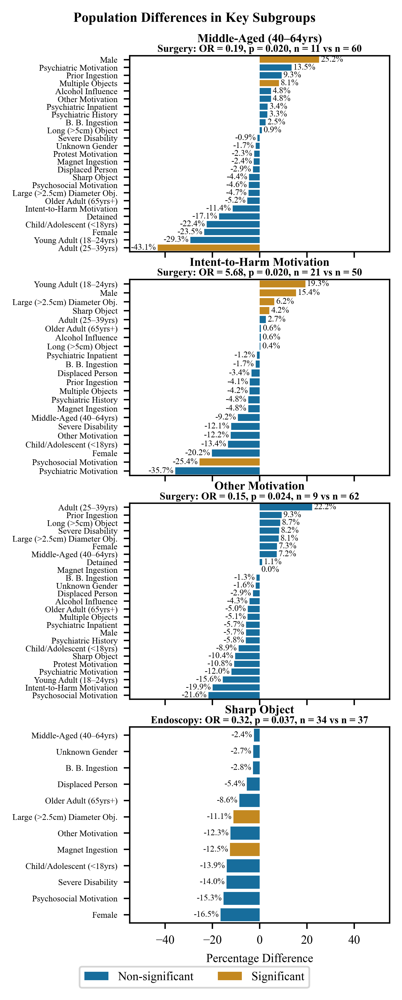

In [592]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import os


# Constants
xlim = (-55, 55)
n_plots = min(len(univariate_sig_df), 5)

# Use a narrow width (IEEE single-column is ~3.5 inches wide)
fig_width = 3.6  # inches
fig_height_per_plot = 2.1  # adjust this if overlap remains

# Setup figure
fig = plt.figure(figsize=(fig_width, fig_height_per_plot * n_plots))
gs = gridspec.GridSpec(n_plots, 1, figure=fig)
axs = [fig.add_subplot(gs[i, 0]) for i in range(n_plots)]

# Constants
xlim = (-55, 55)
n_plots = min(len(univariate_sig_df), 5)

# Loop through plots
legend_handles_labels = None

for i, (_, row) in enumerate(univariate_sig_df.iterrows()):
    if i >= n_plots:
        break

    or_val = row['Odds Ratio']
    p_val = row['P-value']
    group = row['Group']
    predictor = row['Predictor']
    predictor_label = get_label_from_case_col_map(predictor, case_col_map)
    outcome = row['Outcome']
    outcome_label = row['Outcome_Label']
    ci_lower = row['95% CI Lower']
    ci_upper = row['95% CI Upper']
    test_used = row['Note']

    # Run subgroup analysis
    subgroup_analysis, n_sub, n_comp = create_subgroup_comparison(df=case_data, var=predictor, show_plot=False)
    subgroup_analysis_sorted = subgroup_analysis.sort_values(by='Percentage_Difference', ascending=False)

    ax = axs[i]

    # Plot
    barplot = sns.barplot(
        data=subgroup_analysis_sorted,
        y='Plot_Label',
        x='Percentage_Difference',
        hue='Significant',
        palette='colorblind',
        ax=ax
    )

    # Store legend handles just once
    if legend_handles_labels is None:
        legend_handles_labels = barplot.get_legend_handles_labels()

    # Title & subtitle
    ax.set_title(predictor_label, fontsize=7, fontweight='bold', loc='center', pad=8)
    subtitle = f"{outcome_label}: OR = {or_val:.2f}, p = {p_val:.3f}, n = {n_sub} vs n = {n_comp}"
    ax.text(
        0.5, 1.02, subtitle,
        transform=ax.transAxes,
        ha='center',
        fontsize=6,
        fontweight='bold'
    )

    # Formatting
    ax.set_ylabel("")
    ax.set_xlim(xlim)

    for container in barplot.containers:
        barplot.bar_label(
            container,
            labels=[f"{v.get_width():.1f}%" for v in container],
            label_type='edge',
            fontsize=5,
            padding=1
        )

    ax.tick_params(axis='y', labelsize=5)
    ax.get_legend().remove()

    if i == n_plots - 1:
        ax.set_xlabel("Percentage Difference", fontsize=7)  # axis label font size
        ax.tick_params(axis='x', labelsize=7)               # x-tick font size
    else:
        ax.set_xlabel("")
        ax.tick_params(axis='x', labelbottom=False, labelsize=7)

# Shared legend
if legend_handles_labels:
    handles, labels = legend_handles_labels
    fig.legend(
        handles=handles,
        labels=["Non-significant", "Significant"],
        loc='lower center',
        bbox_to_anchor=(0.5, 0.01),
        ncol=2,
        fontsize=7
    )

fig.suptitle("Population Differences in Key Subgroups", fontsize=8, fontweight='bold', y=0.953)
plt.tight_layout(rect=[0.05, 0.02, 0.98, 0.98], h_pad=0)
plot_path = os.path.join(REPORT_FIGURES_DIR, 'case_subgroup_analysis.png')
plt.savefig(plot_path, bbox_inches='tight')

In [539]:
case_col_map

{'Metadata': {'Study_ID': {'Table': 'Study ID'},
  'Study_Country': {'Table': 'Country'},
  'Publication_Year': {'Table': 'Publication Year'},
  'Case_Count': {'Table': 'Case Count'},
  'Citekey': {'Table': 'Citekey'}},
 'Predictors': {'Gender': {'Gender_Male': {'Table': 'Male', 'Plot': 'Male'},
   'Gender_Female': {'Table': 'Female', 'Plot': 'Female'},
   'Gender_Unknown': {'Table': 'Unknown', 'Plot': 'Unknown Gender'}},
  'Age': {'Age_Yrs': {'Table': 'Age (Years)', 'Plot': 'Age (Years)'},
   'Age_Min': {'Table': 'Min', 'Plot': 'Min. Age'},
   'Age_Max': {'Table': 'Max', 'Plot': 'Max. Age'},
   'Age_Median': {'Table': 'Median', 'Plot': 'Median Age'},
   'Age_Mean': {'Table': 'Mean', 'Plot': 'Mean Age'},
   'Age_IQR': {'Table': 'IQR', 'Plot': 'IQR Age'}},
  'Age Group': {'Age_<18': {'Table': 'Child/Adolescent (<18)',
    'Plot': 'Child/Adolescent (<18yrs)'},
   'Age_18_24': {'Table': 'Young Adult (18–24)',
    'Plot': 'Young Adult (18–24yrs)'},
   'Age_25_39': {'Table': 'Adult (25–39)'

In [540]:
case_data_is_detained = create_subgroup_comparison(df=case_data, var='Is_Prisoner')

case_data_is_detained

Subgroup n=12
Comparison n=59


(          Group                   Variable  Count_Subgroup  Count_Comparison  \
 23       Gender                Gender_Male            12.0              31.0   
 21   Motivation  Motivation_Intent_To_Harm             8.0              13.0   
 0        Gender              Gender_Female             0.0              27.0   
 22    Age Group                  Age_25_39             7.0              18.0   
 19       Object      Object_Diameter_Large            11.0              40.0   
 18       Object               Object_Sharp             8.0              26.0   
 20    Age Group                  Age_18_24             5.0              12.0   
 3     Age Group                    Age_<18             0.0              13.0   
 1   Demographic                   Psych_Hx             3.0              33.0   
 4     Age Group                  Age_40_64             0.0              11.0   
 2    Motivation     Motivation_Psychiatric             3.0              31.0   
 8        Object            

In [541]:
is_prisoner_cases = case_data[case_data['Is_Prisoner'] == 1]

is_prisoner_cases['Motivation_Protest'].mean(skipna=True) * 100

middle_age_cases = case_data[case_data['Age_40_64'] == 1]


middle_age_cases['Citekey']

create_subgroup_comparison(df=case_data, var='Age_40_64', case_col_map=case_col_map)

Subgroup n=11
Comparison n=60


(          Group                   Variable  Count_Subgroup  Count_Comparison  \
 21       Object            Object_Multiple            10.0              34.0   
 0     Age Group                  Age_25_39             0.0              25.0   
 24       Gender                Gender_Male             9.0              34.0   
 1     Age Group                  Age_18_24             0.0              17.0   
 23   Motivation     Motivation_Psychiatric             7.0              27.0   
 16       Object      Object_Button_Battery             1.0               1.0   
 4   Demographic                Is_Prisoner             0.0              12.0   
 15       Object                Object_Long             6.0              26.0   
 3     Age Group                    Age_<18             0.0              13.0   
 22  Demographic        Previous_Ingestions             4.0              15.0   
 20  Demographic    Under_Influence_Alcohol             1.0               2.0   
 19   Motivation           M

#### Demographics

In [542]:
len(case_data)

71

In [543]:
for var in case_col_map['Predictors']['Demographic']:
    print(var)
    create_subgroup_comparison(var=var, df=case_data)

Is_Prisoner
Subgroup n=12
Comparison n=59
Is_Psych_Inpat
Subgroup n=4
Comparison n=67
Is_Displaced_Person
Subgroup n=2
Comparison n=69
Under_Influence_Alcohol
Subgroup n=3
Comparison n=68
Psych_Hx
Subgroup n=36
Comparison n=35
Severe_Disability_Hx
Subgroup n=7
Comparison n=64
Previous_Ingestions
Subgroup n=19
Comparison n=52


### Heat Map

In [544]:
series_data_not_pooled = series_data[series_data['Study_ID'] != 'Case_Series']



In [545]:
series_country_data = series_data[['Study_Country','Citekey','Case_Count']]
series_country_data = series_country_data[~series_country_data['Study_Country'].isna()]
series_country_data.columns = ['Country','Citekey','Case_Count']
series_country_data['Source'] = 'Case Series'
series_country_data 

# Group case reports by country, count patients, and collect citekeys
case_country_data = (
    case_data
    .groupby('Study_Country')
    .agg(
        Case_Count=('Patient_ID', 'count'),
        Citekey=('Citekey', lambda x: ', '.join(sorted(set(x))))
    )
    .reset_index()
)

case_country_data.columns = ['Country', 'Case_Count', 'Citekey']
case_country_data['Source'] = 'Case Report'

# Concatenate both
all_country_data = pd.concat([series_country_data, case_country_data], ignore_index=True)

# Optional: Order Source
all_country_data['Source'] = pd.Categorical(
    all_country_data['Source'],
    categories=['Case Series', 'Case Report'],
    ordered=True
)

# Sort nicely
all_country_data = all_country_data.sort_values(['Country', 'Source'])

# Optional: total case counts per country (drop citekeys if so)
# If you want to keep citekeys grouped per country too:
all_country_data = (
    all_country_data
    .groupby('Country')
    .agg(
        Case_Count=('Case_Count', 'sum'),
        Citekey=('Citekey', lambda x: '; '.join(sorted(set(x.dropna()))))
    )
    .sort_values(by='Case_Count', ascending=False)
    .reset_index()
)

all_country_data['Plot_Country'] = all_country_data['Country'].replace(
    {'USA': 'United States of America',
     'UK': 'United Kingdom',
     'Republic of Korea': 'South Korea',
     'Bahrain': 'United Arab Emirates'}
)

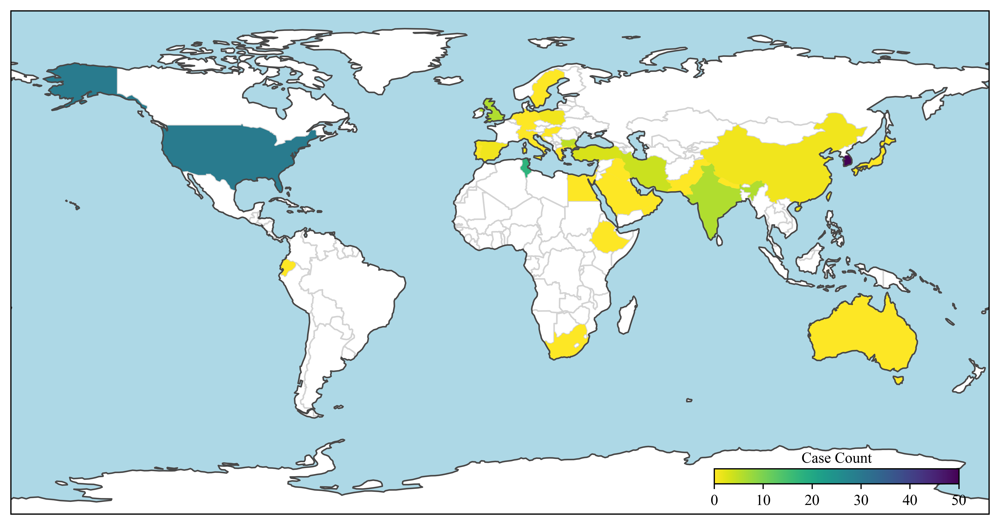

In [546]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import cartopy.crs as ccrs

# 1. Copy your data (must have 'Country' and 'Case_Count')
plot_data = all_country_data[['Plot_Country', 'Case_Count']].copy()

# 2. Load Natural Earth country boundaries
shpfilename = shpreader.natural_earth(
    resolution='110m',
    category='cultural',
    name='admin_0_countries'
)
world = gpd.read_file(shpfilename)

# 3. Merge case counts into the GeoDataFrame
merged = world.merge(
    plot_data,
    how='left',
    left_on='ADMIN',
    right_on='Plot_Country'
)

# Plot the map
fig, ax = plt.subplots(
    figsize=(12, 6),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

# Base map
world.plot(ax=ax, facecolor='white', edgecolor='lightgrey', transform=ccrs.PlateCarree())

# Choropleth
chor = merged.dropna(subset=['Case_Count']).plot(
    ax=ax,
    column='Case_Count',
    cmap='viridis_r',
    legend=False,
    transform=ccrs.PlateCarree()
)

# Add coastlines and sea color
ax.coastlines(color="#484848")
ax.set_facecolor('#ADD8E6')  # light blue sea

# Black ticks and spines
ax.tick_params(colors='black')
for spine in ax.spines.values():
    spine.set_edgecolor('black')

# Manual colorbar inset at bottom-right, moved up slightly
cax = inset_axes(ax, width="25%", height="3%", loc='lower right', borderpad=2)

# Set normalization and color mapping
norm = plt.Normalize(vmin=0, vmax=50)
sm = mpl.cm.ScalarMappable(cmap='viridis_r', norm=norm)
sm._A = []

# Add the colorbar with black styling
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal', ticks=[0, 10, 20, 30, 40, 50])
cbar.ax.set_title('Case Count', fontsize=10, color='black', pad=4)

# Style the tick lines, labels, and spine
cbar.outline.set_edgecolor('black')
cbar.ax.tick_params(color='black', labelcolor='black')
for tick in cbar.ax.get_xticklines():
    tick.set_color('black')

# Save figure
plot_path = os.path.join(REPORT_FIGURES_DIR, 'case_country_plot.png')
plt.savefig(plot_path, bbox_inches='tight')
plt.show()

In [585]:
# 1. Prepare table data
table_data = all_country_data[['Plot_Country', 'Case_Count', 'Citekey']].copy()

def build_citekey_tex(citekey_str):
    if pd.isna(citekey_str) or citekey_str.strip() == '':
        return ''
    # Split on both commas and semicolons, strip spaces, deduplicate, and join
    keys = [k.strip() for part in citekey_str.split(';') for k in part.split(',')]
    keys = sorted(set(filter(None, keys)))  # remove empty strings, deduplicate, sort
    return f"\\cite{{{', '.join(keys)}}}"

# Apply to your DataFrame
table_data['Citekey_Tex'] = table_data['Citekey'].apply(build_citekey_tex)

table_data.columns = ['Plot_Country', 'Case Count', 'Citekey' ,'Citekey_Tex']
table_data = table_data[['Plot_Country', 'Case Count', 'Citekey_Tex']]
table_data.columns = ['Country', 'Case Count', 'References']

# Add formatted percentage column
table_data['Percentage'] = table_data['Case Count'] / table_data['Case Count'].sum() * 100
table_data['Percentage'] = table_data['Percentage'].map(lambda x: f"{x:.1f}\\%")

# Reorder columns
table_data = table_data[['Country', 'Case Count', 'Percentage', 'References']]

# 2. Create LaTeX table string
latex_body = table_data.to_latex(
    index=False,
    escape=False,
    column_format='lr'  # placeholder; replaced below
)

# 3. Replace default tabular with your tabularx layout
latex_body = latex_body.replace(
    r'\begin{tabular}{lr}',
    r'\begin{tabularx}{\columnwidth}{p{3.5cm}>{\centering\arraybackslash}X>{\centering\arraybackslash}X>{\centering\arraybackslash}X>{\centering\arraybackslash}X}'
)
latex_body = latex_body.replace(r'\end{tabular}', r'\end{tabularx}')

# 4. Add footer note before \end{tabularx}
footer_note = r"""\bottomrule
\multicolumn{4}{l}{\footnotesize\textit{Note:} Percentages are rounded to one decimal place. Some references include multiple cases.}
"""
latex_body = latex_body.replace(r'\end{tabularx}', footer_note + '\n\\end{tabularx}')

# 5. Wrap in IEEE single-column table format
latex_wrapped = f"""
\\begin{{table}}[!t]
\\caption{{Case counts per country.}}
\\label{{tab:case_country_counts}}
\\centering
\\begin{{adjustbox}}{{width=\\columnwidth}}
\\renewcommand{{\\arraystretch}}{{1.2}}
{latex_body}
\\end{{adjustbox}}
\\end{{table}}
"""

# 6. Save to .tex file
table_path = os.path.join(TABLES_DIR, 'country_table.tex')
with open(table_path, 'w') as f:
    f.write(latex_wrapped)

In [586]:
print(latex_wrapped)


\begin{table}[!t]
\caption{Case counts per country.}
\label{tab:case_country_counts}
\centering
\begin{adjustbox}{width=\columnwidth}
\renewcommand{\arraystretch}{1.2}
\begin{tabularx}{\columnwidth}{p{3.5cm}>{\centering\arraybackslash}X>{\centering\arraybackslash}X>{\centering\arraybackslash}X>{\centering\arraybackslash}X}
\toprule
Country & Case Count & Percentage & References \\
\midrule
South Korea & 52.000000 & 32.3\% & \cite{Lee_2007} \\
United States of America & 31.000000 & 19.3\% & \cite{Alao_2006i, Ataya_2013, Bhumi_2024f, Fry_2010, Guinan_2019f, Hardy_2023g, Jehangir_2019h, Karp_1991b, Kerestes_2019, Kumar_2001, Liu_2005, Tammana_2012j, Tay_2004} \\
Tunisia & 19.000000 & 11.8\% & \cite{Elghali_2016} \\
United Kingdom & 7.000000 & 4.3\% & \cite{Beecroft_1998, Berry_2021e, Cauchi_2002, Cox_2007, Gardner_2017h, Qureshi_2016} \\
India & 7.000000 & 4.3\% & \cite{Bhasin_2014, Bhattacharjee_2008, Kar_2015, Kariholu_2008, Kumar_2019f, Misra_2013, Wadhwa_2015e} \\
Bulgaria & 6.000000

### Meta-Analysis of Proportions

In [549]:
def get_label_and_group(col, case_col_map=case_col_map):
    """
    Retrieve group and label info from the nested case_col_map.
    Handles 'Predictors' and 'Outcomes'. Falls back if unmatched.
    """
    original_col = col
    col_base = col.replace('_Cases', '')  # Strip suffix if present

    # Check Predictors (nested groups)
    for group_name, variables in case_col_map.get('Predictors', {}).items():
        for var_name, label_dict in variables.items():
            if col == var_name or col_base == var_name:
                table_label = label_dict.get('Table', var_name)
                plot_label = label_dict.get('Plot', table_label)
                text_label = table_label.lower()
                return {
                    'Group': group_name,
                    'Table': table_label,
                    'Plot': plot_label,
                    'Text': text_label
                }

    # Check Outcomes (flat)
    for var_name, label_dict in case_col_map.get('Outcomes', {}).items():
        if col == var_name or col_base == var_name:
            table_label = label_dict.get('Table', var_name)
            plot_label = label_dict.get('Plot', table_label)
            text_label = table_label.lower()
            return {
                'Group': 'Outcome',
                'Table': table_label,
                'Plot': plot_label,
                'Text': text_label
            }

    # Fallback
    return {
        'Group': None,
        'Table': original_col,
        'Plot': original_col,
        'Text': original_col.lower()
    }

In [550]:
import numpy as np
from scipy.optimize import minimize_scalar
from scipy.stats import t

def reml_meta_analysis_proportion(
    df,
    var_col,
    total_col='Case_Count',
    label_col='Study_ID',
    citekey_col='Citekey',
    use_hk=True,
    print_results=True,
):
    # Pre-filter rows that are numerically valid (for logging and citekeys)
    valid_rows = df[(df[var_col].notna()) & (df[total_col] > 0)]
    citekeys_str = ", ".join(valid_rows[citekey_col].dropna().astype(str).unique()) if citekey_col in df.columns else ""

    # Create working DataFrame for meta-analysis
    meta_df = valid_rows.copy()

    # Compute proportions and logits
    meta_df['Prop'] = meta_df[var_col] / meta_df[total_col]
    meta_df['Prop'] = meta_df['Prop'].clip(0.001, 0.999)  # avoid infinite logits
    meta_df['Logit_Prop'] = np.log(meta_df['Prop'] / (1 - meta_df['Prop']))

    # Apply continuity correction to avoid dropping 0% or 100% rows
    a = meta_df[var_col].replace(0, 0.5)
    b = (meta_df[total_col] - meta_df[var_col]).replace(0, 0.5)
    meta_df['Var_Logit_Prop'] = 1 / a + 1 / b

    meta_df = meta_df.dropna(subset=['Var_Logit_Prop'])

    if meta_df.shape[0] < 2:
        print(f"\n⚠️ Skipping meta-analysis for {var_col}: only {meta_df.shape[0]} valid studies.")
        return {
            'Variable': var_col,
            'Pooled_Prop': np.nan,
            'CI_Lower': np.nan,
            'CI_Upper': np.nan,
            'I2': np.nan,
            'Tau2': np.nan,
            'N_Studies': meta_df.shape[0],
            'Citekeys': citekeys_str
        }

    yi = meta_df['Logit_Prop'].values
    vi = meta_df['Var_Logit_Prop'].values
    k = len(yi)

    def reml_neg_log_likelihood(tau2):
        weights = 1 / (vi + tau2)
        mu_hat = np.sum(weights * yi) / np.sum(weights)
        Q = np.sum(weights * (yi - mu_hat) ** 2)
        log_det = np.sum(np.log(vi + tau2))
        return 0.5 * (log_det + Q)

    opt = minimize_scalar(reml_neg_log_likelihood, bounds=(0, 5), method='bounded')
    tau2_reml = max(opt.x, 0)

    weights_re = 1 / (vi + tau2_reml)
    pooled_logit = np.sum(weights_re * yi) / np.sum(weights_re)
    pooled_var = 1 / np.sum(weights_re)
    se_pooled = np.sqrt(pooled_var)

    if use_hk and k > 2:
        vk = np.sum(weights_re * (yi - pooled_logit) ** 2) / (k - 1)
        se_hk = np.sqrt(vk / np.sum(weights_re))
        df_hk = k - 1
        t_val = t.ppf(0.975, df_hk)
        ci_low = pooled_logit - t_val * se_hk
        ci_high = pooled_logit + t_val * se_hk
    else:
        ci_low = pooled_logit - 1.96 * se_pooled
        ci_high = pooled_logit + 1.96 * se_pooled

    pooled_prop = 1 / (1 + np.exp(-pooled_logit))
    pooled_prop_low = 1 / (1 + np.exp(-ci_low))
    pooled_prop_high = 1 / (1 + np.exp(-ci_high))

    Q = np.sum(weights_re * (yi - pooled_logit) ** 2)
    i2 = max(0, (Q - (k - 1)) / Q) * 100 if Q > (k - 1) else 0

    if print_results:
        print(f"\n=== REML Meta-analysis for {var_col} ===")
        print(f"Pooled Proportion: {pooled_prop:.3f} ({pooled_prop_low:.3f} - {pooled_prop_high:.3f})")
        print(f"I² = {i2:.1f}%, Tau² (REML) = {tau2_reml:.3f}")
        print(f"Citekeys: {citekeys_str}")

    return {
        'Variable': var_col,
        'Pooled_Prop': pooled_prop,
        'CI_Lower': pooled_prop_low,
        'CI_Upper': pooled_prop_high,
        'I2': i2,
        'Tau2': tau2_reml,
        'N_Studies': k,
        'Citekeys': citekeys_str
    }
series_data_not_pooled = series_data[series_data['Study_ID'] != 'Case_Series']

results = []

vars_to_skip = ['Study_Country', 'Case_Count', 'Gender_Unknown', 'Age_Min', 'Age_Max', 'Age_Median', 'Age_Mean']

for var in all_series_vars:
    if var not in vars_to_skip:
        res = reml_meta_analysis_proportion(
            df=series_data_not_pooled,
            var_col=var,
            print_results=True,
            use_hk=True
        )
        if res is not None:
            results.append(res)

series_reml_meta_df = pd.DataFrame(results)


=== REML Meta-analysis for Gender_Male ===
Pooled Proportion: 0.999 (0.999 - 0.999)
I² = 0.0%, Tau² (REML) = 0.000
Citekeys: Karp_1991b, Lee_2007, Elghali_2016

=== REML Meta-analysis for Gender_Female ===
Pooled Proportion: 0.001 (0.001 - 0.001)
I² = 0.0%, Tau² (REML) = 0.000
Citekeys: Karp_1991b, Lee_2007, Elghali_2016

=== REML Meta-analysis for Is_Prisoner ===
Pooled Proportion: 0.999 (0.999 - 0.999)
I² = 0.0%, Tau² (REML) = 0.000
Citekeys: Karp_1991b, Lee_2007, Elghali_2016

=== REML Meta-analysis for Is_Psych_Inpat ===
Pooled Proportion: 0.001 (0.001 - 0.001)
I² = 0.0%, Tau² (REML) = 0.000
Citekeys: Karp_1991b, Lee_2007, Elghali_2016

⚠️ Skipping meta-analysis for Is_Displaced_Person: only 0 valid studies.

⚠️ Skipping meta-analysis for Under_Influence_Alcohol: only 0 valid studies.

=== REML Meta-analysis for Psych_Hx ===
Pooled Proportion: 0.412 (0.001 - 0.998)
I² = 37.8%, Tau² (REML) = 3.630
Citekeys: Karp_1991b, Lee_2007, Elghali_2016

⚠️ Skipping meta-analysis for Severe_Di

In [551]:
series_reml_meta_df = series_reml_meta_df.sort_values(by=['Pooled_Prop', 'I2'], ascending=False)
series_reml_meta_df

,Variable,Pooled_Prop,CI_Lower,CI_Upper,I2,Tau2,N_Studies,Citekeys
0,Gender_Male,0.999000,9.990000e-01,0.999000,0.000000,0.000004,3,"Karp_1991b, Lee_2007, Elghali_2016"
2,Is_Prisoner,0.999000,9.990000e-01,0.999000,0.000000,0.000004,3,"Karp_1991b, Lee_2007, Elghali_2016"
14,Object_Sharp,0.935171,4.871778e-03,0.999976,44.621506,4.999996,3,"Karp_1991b, Lee_2007, Elghali_2016"
9,Motivation_Protest,0.779902,4.470061e-03,0.999643,32.679322,4.318803,3,"Karp_1991b, Lee_2007, Elghali_2016"
20,Outcome_Endoscopy,0.441088,2.894192e-02,0.954332,53.686345,4.999994,2,"Lee_2007, Elghali_2016"
6,Psych_Hx,0.412281,1.145607e-03,0.997675,37.765143,3.630482,3,"Karp_1991b, Lee_2007, Elghali_2016"
24,Outcome_Conservative,0.261527,6.087821e-06,0.999951,70.436916,4.999994,3,"Karp_1991b, Lee_2007, Elghali_2016"
16,Object_Multiple,0.243545,5.334193e-02,0.647835,54.040640,1.153999,2,"Lee_2007, Elghali_2016"
22,Outcome_Surgery,0.175726,5.198355e-02,0.453211,17.359220,0.000004,3,"Karp_1991b, Lee_2007, Elghali_2016"
15,Object_Long,0.067947,2.504870e-03,0.679111,77.706765,4.999994,2,"Lee_2007, Elghali_2016"


In [552]:
# Step 1: Copy and prefix reml_meta_df columns except 'Variable'
series_reml_meta_df_prefixed = series_reml_meta_df.copy()
series_reml_meta_df_prefixed = series_reml_meta_df_prefixed.rename(
    columns={col: f"Case_Series_MA_{col}" for col in series_reml_meta_df.columns if col != "Variable"}
)

# Step 2: Merge on 'Variable'
series_data_case_data_pivot_plus_series_ma = pd.merge(
    series_data_case_data_pivot,
    series_reml_meta_df_prefixed,
    how='left',
    on='Variable'
)

#### Aggregate Case Report Case Dat MA

In [553]:
# Convert Series to a one-row DataFrame
case_data_row = case_data_pooled.to_frame().T

# Set index (optional: label it e.g., 'Case_Reports')
case_data_row.index = ['Case_Reports']

# Align columns: add missing ones in either df
case_data_row = case_data_row.reindex(columns=series_data.columns)

# Append the row
series_data_case_data_pooled = pd.concat([series_data, case_data_row], axis=0)

series_data_case_data_pooled

,Study_ID,Comments,Patient_Count,Case_Count,Age_Min,Age_Max,Age_Mean,Age_Median,Verified_Ingestion,Gender_Male,...,Reviewer_Initials,Review_Date,Comments_Reasoning,Setting_Population,Study_Objective,Study_Method,Study_Results,Study_Conclusion,Author_Tex,Author_Year_Tex
0,523,"""The most common motive for swallowing was sui...",19.0,19.0,17.0,40.0,24.0,NaN,19.0,19.0,...,JGE,2025-05-14,No comment.,Medical prison ward for men in a New York City...,Records were examined for demographic and psyc...,Two psychiatrically trained raters examined th...,See statistical breakdown.,In our series of 19 prisoners who ingested obj...,Karp \textit{et al.},Karp \textit{et al.} (1991) \cite{Karp_1991b}
1,581,"""In summary, the foreign objects in prisoners ...",33.0,52.0,25.0,50.0,NaN,35.0,52.0,52.0,...,JGE,2025-06-02,No comment.,Prisoners attended two hospitals in South Korea.,To investigate the time interval between forei...,Reviewed the medical records and endoscopic fi...,All the patients were male with a mean age of ...,The foreign objects in prisoners were a variet...,Lee \textit{et al.},Lee \textit{et al.} (2007) \cite{Lee_2007}
2,646,NaN,16.0,19.0,19.0,27.0,24.0,NaN,19.0,19.0,...,JGE,2025-05-14,No comment.,Patients referred from prison to Department of...,A descriptive study including all detainees in...,NaN,"There were 16 men with a mean age of 24 years,...",Our experience enabled us to confirm the few d...,Elghali \textit{et al.},Elghali \textit{et al.} (2016) \cite{Elghali_2...
Case_Reports,Case_Reports,NaN,NaN,71.0,7.0,100.0,30.550725,28.0,NaN,43.0,...,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [554]:

# Ensure all relevant columns are numeric
for var in all_series_vars + ['Case_Count']:
    if var in series_data_case_data_pooled.columns:
        series_data_case_data_pooled[var] = pd.to_numeric(series_data_case_data_pooled[var], errors='coerce')
        
results = []

vars_to_skip = ['Study_Country', 'Gender_Unknown', 'Age_Min', 'Age_Max', 'Age_Median', 'Age_Mean', 'Citekey']

for var in all_series_vars:
    if var not in vars_to_skip:
        res = reml_meta_analysis_proportion(
            df=series_data_case_data_pooled,
            var_col=var,
            print_results=True,
            use_hk=True
        )
        if res is not None:
            results.append(res)

series_data_case_data_reml_meta_df = pd.DataFrame(results)


=== REML Meta-analysis for Gender_Male ===
Pooled Proportion: 0.992 (0.335 - 1.000)
I² = 47.1%, Tau² (REML) = 5.000
Citekeys: Karp_1991b, Lee_2007, Elghali_2016, Losanoff_1996, Losanoff_1997e, Goldman_1998f, Csaky_1998e, Alao_2006i, Sakellaridis_2008f, Sobnach_2011f, Trgo_2012f, Tammana_2012j, Naji_2012f, Tanrikulu_2015e, Wadhwa_2015e, Wnęk_2015f, Akay_2015f, Yildiz_2016e, Peixoto_2017f, Chang_2017f, Gardner_2017h, Riva_2018j, Thapa_2019f, Kumar_2019f, Jehangir_2019h, Benoist_2019e, Guinan_2019f, Al-Faham_2020k, Ali_2020f, DelgadoSalazar_2020c, AlShaaibi_2021b, Berry_2021e, Apikotoa_2022f, Ali_2022g, DivsalarP._2023a, Hardy_2023g, Sultan_2024f, Farhadi_2024h, fjbuilsRepeatedBehaviorDeliberate2024, Bhumi_2024f, Beecroft_1998, Kumar_2001, Cauchi_2002, Tay_2004, Liu_2005, Ohno_2005, Wildhaber_2005, Cox_2007, Bhattacharjee_2008, Kariholu_2008, Yasin_2009, Fry_2010, teWildt_2010, Ataya_2013, Li_2013, Misra_2013, Bhasin_2014, Kar_2015, Kobiela_2015, Atayan_2016, Ali_2017, CamachoDorado_2018

In [555]:
print(series_data_case_data_reml_meta_df.columns) 

Index(['Variable', 'Pooled_Prop', 'CI_Lower', 'CI_Upper', 'I2', 'Tau2',
       'N_Studies', 'Citekeys'],
      dtype='object')


In [556]:
# Step 1: Copy and prefix columns in the *correct* DataFrame
series_data_case_data_reml_meta_df_prefixed = series_data_case_data_reml_meta_df.copy()
series_data_case_data_reml_meta_df_prefixed = series_data_case_data_reml_meta_df_prefixed.rename(
    columns={
        col: f"Aggregate_MA_{col}"
        for col in series_data_case_data_reml_meta_df_prefixed.columns
        if col != "Variable"
    }
)

# Step 2: Merge onto existing pivot-with-series-MA
series_data_case_data_pivot_plus_all_ma = pd.merge(
    series_data_case_data_pivot_plus_series_ma,
    series_data_case_data_reml_meta_df_prefixed,
    how='left',
    on='Variable'
)

pooled_results_df = series_data_case_data_pivot_plus_all_ma.copy()

In [557]:
# Define new metadata block
new_metadata = {
    'Study_ID': {'Table': 'Study ID'},
    'Study_Country': {'Table': 'Country'},
    'Publication_Year': {'Table': 'Publication Year'},
    'Case_Count': {'Table': 'Case Count'},
    'Citekey': {'Table': 'Citekey'}
}

# Ensure 'Metadata' key exists in case_col_map
case_col_map.setdefault('Metadata', {})

# Update 'Metadata' section with new entries (without overwriting existing keys unless intentional)
case_col_map['Metadata'].update(new_metadata)

case_col_map


{'Metadata': {'Study_ID': {'Table': 'Study ID'},
  'Study_Country': {'Table': 'Country'},
  'Publication_Year': {'Table': 'Publication Year'},
  'Case_Count': {'Table': 'Case Count'},
  'Citekey': {'Table': 'Citekey'}},
 'Predictors': {'Gender': {'Gender_Male': {'Table': 'Male', 'Plot': 'Male'},
   'Gender_Female': {'Table': 'Female', 'Plot': 'Female'},
   'Gender_Unknown': {'Table': 'Unknown', 'Plot': 'Unknown Gender'}},
  'Age': {'Age_Yrs': {'Table': 'Age (Years)', 'Plot': 'Age (Years)'},
   'Age_Min': {'Table': 'Min', 'Plot': 'Min. Age'},
   'Age_Max': {'Table': 'Max', 'Plot': 'Max. Age'},
   'Age_Median': {'Table': 'Median', 'Plot': 'Median Age'},
   'Age_Mean': {'Table': 'Mean', 'Plot': 'Mean Age'},
   'Age_IQR': {'Table': 'IQR', 'Plot': 'IQR Age'}},
  'Age Group': {'Age_<18': {'Table': 'Child/Adolescent (<18)',
    'Plot': 'Child/Adolescent (<18yrs)'},
   'Age_18_24': {'Table': 'Young Adult (18–24)',
    'Plot': 'Young Adult (18–24yrs)'},
   'Age_25_39': {'Table': 'Adult (25–39)'

In [558]:
def map_group_and_label(var, case_cols_dict, label_type='Table'):
    for top_level_group, group_dict in case_cols_dict.items():
        if top_level_group == "Outcomes":
            if var in group_dict:
                label = group_dict[var].get(label_type, var)
                return pd.Series({'Group': 'Outcome', 'Table_Label': label})
        elif top_level_group == "Metadata":
            if var in group_dict:
                label = group_dict[var].get(label_type, var)
                return pd.Series({'Group': 'Metadata', 'Table_Label': label})
        else:
            for subgroup, variables in group_dict.items():
                if var in variables:
                    label = variables[var].get(label_type, var)
                    return pd.Series({'Group': subgroup, 'Table_Label': label})
    
    # fallback — must still include 'Table_Label' key
    return pd.Series({'Group': None, 'Table_Label': var})

series_reml_meta_df[['Group', 'Table_Label']] = series_reml_meta_df['Variable'].apply(
    lambda var: map_group_and_label(var, case_col_map)
)

pooled_results_df[['Group', 'Table_Label']] = pooled_results_df['Variable'].apply(
    lambda var: map_group_and_label(var, case_col_map)
)

pooled_results_df.columns

Index(['Variable', '523_Count', '581_Count', '646_Count', 'Case_Series_Count',
       'Group', '523_Percentage', '581_Percentage', '646_Percentage',
       'Case_Series_Percentage', '523_Weighted', '581_Weighted',
       '646_Weighted', 'Case_Report_Count', 'Case_Report_Percentage',
       'Pooled_Count', 'Pooled_Percentage', 'Case_Series_MA_Pooled_Prop',
       'Case_Series_MA_CI_Lower', 'Case_Series_MA_CI_Upper',
       'Case_Series_MA_I2', 'Case_Series_MA_Tau2', 'Case_Series_MA_N_Studies',
       'Case_Series_MA_Citekeys', 'Aggregate_MA_Pooled_Prop',
       'Aggregate_MA_CI_Lower', 'Aggregate_MA_CI_Upper', 'Aggregate_MA_I2',
       'Aggregate_MA_Tau2', 'Aggregate_MA_N_Studies', 'Aggregate_MA_Citekeys',
       'Table_Label'],
      dtype='object')

In [559]:
pooled_results_df.columns

Index(['Variable', '523_Count', '581_Count', '646_Count', 'Case_Series_Count',
       'Group', '523_Percentage', '581_Percentage', '646_Percentage',
       'Case_Series_Percentage', '523_Weighted', '581_Weighted',
       '646_Weighted', 'Case_Report_Count', 'Case_Report_Percentage',
       'Pooled_Count', 'Pooled_Percentage', 'Case_Series_MA_Pooled_Prop',
       'Case_Series_MA_CI_Lower', 'Case_Series_MA_CI_Upper',
       'Case_Series_MA_I2', 'Case_Series_MA_Tau2', 'Case_Series_MA_N_Studies',
       'Case_Series_MA_Citekeys', 'Aggregate_MA_Pooled_Prop',
       'Aggregate_MA_CI_Lower', 'Aggregate_MA_CI_Upper', 'Aggregate_MA_I2',
       'Aggregate_MA_Tau2', 'Aggregate_MA_N_Studies', 'Aggregate_MA_Citekeys',
       'Table_Label'],
      dtype='object')

In [560]:
ma_cols = ['Pooled_Prop', 'CI_Lower', 'CI_Upper', 'I2', 'Tau2', 'N_Studies']
cs_prefix = 'Case_Series_MA_'
agg_prefix = 'Aggregate_MA_'

for col in ma_cols:
    cs_col = f'{cs_prefix}{col}'
    agg_col = f'{agg_prefix}{col}'

    # Absolute difference
    pooled_results_df[f'{col}_Abs_Difference'] = pooled_results_df[cs_col] - pooled_results_df[agg_col]

    # Relative difference (signed ratio)
    pooled_results_df[f'{col}_Rel_Difference'] = pooled_results_df[f'{col}_Abs_Difference'] / pooled_results_df[agg_col]

    # Percentage difference (multiply relative difference by 100)
    pooled_results_df[f'{col}_Pct_Difference'] = pooled_results_df[f'{col}_Rel_Difference'] * 100

pooled_results_df

pooled_results_df.columns

Index(['Variable', '523_Count', '581_Count', '646_Count', 'Case_Series_Count',
       'Group', '523_Percentage', '581_Percentage', '646_Percentage',
       'Case_Series_Percentage', '523_Weighted', '581_Weighted',
       '646_Weighted', 'Case_Report_Count', 'Case_Report_Percentage',
       'Pooled_Count', 'Pooled_Percentage', 'Case_Series_MA_Pooled_Prop',
       'Case_Series_MA_CI_Lower', 'Case_Series_MA_CI_Upper',
       'Case_Series_MA_I2', 'Case_Series_MA_Tau2', 'Case_Series_MA_N_Studies',
       'Case_Series_MA_Citekeys', 'Aggregate_MA_Pooled_Prop',
       'Aggregate_MA_CI_Lower', 'Aggregate_MA_CI_Upper', 'Aggregate_MA_I2',
       'Aggregate_MA_Tau2', 'Aggregate_MA_N_Studies', 'Aggregate_MA_Citekeys',
       'Table_Label', 'Pooled_Prop_Abs_Difference',
       'Pooled_Prop_Rel_Difference', 'Pooled_Prop_Pct_Difference',
       'CI_Lower_Abs_Difference', 'CI_Lower_Rel_Difference',
       'CI_Lower_Pct_Difference', 'CI_Upper_Abs_Difference',
       'CI_Upper_Rel_Difference', 'CI_Upper_

In [561]:
import pandas as pd

def df_to_ieee_landscape_longtable_combined_with_difference(
    df,
    group_col='Group',
    label_col='Table_Label',
    label="tab:ieee_longtable_combined_diff",
    caption="Summary of outcomes by variable across pooled sources, case series, and meta-analyses, including relative differences.",
    float_precision=1
):
    # Define what to display
    count_pct_pairs = [
        ("Pooled_Count", "Pooled_Percentage", "Pooled"),
        ("Case_Series_Count", "Case_Series_Percentage", "Case Series"),
    ]

    meta_cols = [
        ("Aggregate_MA_Pooled_Prop", "$\\hat{p}_A$"),
        ("Aggregate_MA_CI_Lower", "$CI_{A,L}$"),
        ("Aggregate_MA_CI_Upper", "$CI_{A,U}$"),
        ("Aggregate_MA_I2", "$I^2_A$"),
        ("Aggregate_MA_Tau2", "$\\tau^2_A$"),
        ("Aggregate_MA_N_Studies", "$k_A$"),
        ("Case_Series_MA_Pooled_Prop", "$\\hat{p}_S$"),
        ("Case_Series_MA_CI_Lower", "$CI_{S,L}$"),
        ("Case_Series_MA_CI_Upper", "$CI_{S,U}$"),
        ("Case_Series_MA_I2", "$I^2_S$"),
        ("Case_Series_MA_Tau2", "$\\tau^2_S$"),
        ("Case_Series_MA_N_Studies", "$k_S$")
    ]

    # Relative difference columns to display at the end
    rel_diff_cols = [
        ("Pooled_Prop_Rel_Difference", "$\\Delta\\hat{p}$"),
        ("CI_Lower_Rel_Difference", "$\\Delta CI_L$"),
        ("CI_Upper_Rel_Difference", "$\\Delta CI_U$"),
        ("I2_Rel_Difference", "$\\Delta I^2$"),
        ("Tau2_Rel_Difference", "$\\Delta \\tau^2$"),
        ("N_Studies_Rel_Difference", "$\\Delta k$")
    ]

    # Build column headers and spec
    column_labels = ["\\textbf{Variable}"] + [
        f"\\textbf{{{label}}}" for *_, label in count_pct_pairs
    ] + [f"\\textbf{{{lab}}}" for _, lab in meta_cols] + [f"\\textbf{{{lab}}}" for _, lab in rel_diff_cols]

    col_spec = ["p{4.5cm}"] + ["c"] * (len(column_labels) - 1)

    # Begin LaTeX table
    latex = (
        "\\begin{landscape}\n"
        "\\begin{longtable}{" + " ".join(col_spec) + "}\n"
        f"\\caption{{{caption}}} \\\\ \n"
        f"\\label{{{label}}} \n"
        "\\toprule\n"
        + " & ".join(column_labels) + " \\\\\n"
        "\\midrule\n"
        "\\endfirsthead\n"
        "\\toprule\n"
        + " & ".join(column_labels) + " \\\\\n"
        "\\midrule\n"
        "\\endhead\n"
        "\\bottomrule\n"
        "\\endfoot\n"
        "\\bottomrule\n"
        "\\endlastfoot\n"
    )

    grouped = df[df[label_col].notna()].sort_values([group_col, label_col]).groupby(group_col)

    for group_name, group_df in grouped:
        latex += f"\\multicolumn{{{len(column_labels)}}}{{l}}{{\\textbf{{{group_name}}}}} \\\\\n"
        for _, row in group_df.iterrows():
            row_cells = [f"\\hspace{{1em}}{row.get(label_col, '---')}"]

            # Counts + percentage
            for count_col, pct_col, _ in count_pct_pairs:
                count = row.get(count_col)
                pct = row.get(pct_col)
                if pd.notna(count):
                    cell = f"{int(count)}"
                    if pd.notna(pct):
                        cell += f" ({pct:.{float_precision}f}\\%)"
                else:
                    cell = "---"
                row_cells.append(cell)

            # Meta-analysis columns
            for meta_col, _ in meta_cols:
                val = row.get(meta_col)
                if pd.isna(val):
                    cell = "---"
                elif isinstance(val, float):
                    cell = f"{val:.{float_precision}f}"
                else:
                    cell = str(val)
                row_cells.append(cell)

            # Relative difference columns
            for diff_col, _ in rel_diff_cols:
                val = row.get(diff_col)
                if pd.isna(val):
                    cell = "---"
                else:
                    sign = "+" if val > 0 else ""
                    cell = f"{sign}{val:.{float_precision}f}"
                row_cells.append(cell)

            latex += " & ".join(row_cells) + " \\\\\n"

    latex += "\\end{longtable}\n\\end{landscape}\n"
    return latex

# Usage
pooled_result_latex_table = df_to_ieee_landscape_longtable_combined_with_difference(pooled_results_df)
print(pooled_result_latex_table)

\begin{landscape}
\begin{longtable}{p{4.5cm} c c c c c c c c c c c c c c c c c c c c}
\caption{Summary of outcomes by variable across pooled sources, case series, and meta-analyses, including relative differences.} \\ 
\label{tab:ieee_longtable_combined_diff} 
\toprule
\textbf{Variable} & \textbf{Pooled} & \textbf{Case Series} & \textbf{$\hat{p}_A$} & \textbf{$CI_{A,L}$} & \textbf{$CI_{A,U}$} & \textbf{$I^2_A$} & \textbf{$\tau^2_A$} & \textbf{$k_A$} & \textbf{$\hat{p}_S$} & \textbf{$CI_{S,L}$} & \textbf{$CI_{S,U}$} & \textbf{$I^2_S$} & \textbf{$\tau^2_S$} & \textbf{$k_S$} & \textbf{$\Delta\hat{p}$} & \textbf{$\Delta CI_L$} & \textbf{$\Delta CI_U$} & \textbf{$\Delta I^2$} & \textbf{$\Delta \tau^2$} & \textbf{$\Delta k$} \\
\midrule
\endfirsthead
\toprule
\textbf{Variable} & \textbf{Pooled} & \textbf{Case Series} & \textbf{$\hat{p}_A$} & \textbf{$CI_{A,L}$} & \textbf{$CI_{A,U}$} & \textbf{$I^2_A$} & \textbf{$\tau^2_A$} & \textbf{$k_A$} & \textbf{$\hat{p}_S$} & \textbf{$CI_{S,L}$} & \text

In [562]:
output_path = os.path.join(TABLES_DIR, 'pooled_results_table.tex')
with open(output_path, 'w') as f:
    f.write(pooled_result_latex_table)

In [563]:
def meta_analysis_to_tex_table(
    meta_df,
    caption="Meta-analysis of proportions summary.",
    label="tab:meta_analysis",
    note_text=None,
    table_type="table*",
    table_position="!t",
    group_order=['Age', 'Gender', 'Demographic', 'Motivation', 'Object', 'Outcome']
):
    """
    Generate a LaTeX table summarizing meta-analysis results with grouping.
    Replaces NaN values with '--' and adds a note below the table.
    Includes Citekeys column with \cite{} references.
    Optionally respects a group_order list.
    """
    import pandas as pd

    if group_order:
        meta_df['Group'] = pd.Categorical(meta_df['Group'], categories=group_order, ordered=True)

    meta_df_sorted = meta_df.sort_values(by=['Group', 'Variable'])

    column_spec = (
        "p{4.5cm} >{\\centering\\arraybackslash}X >{\\centering\\arraybackslash}X "
        ">{\\centering\\arraybackslash}X >{\\centering\\arraybackslash}X >{\\centering\\arraybackslash}X "
        ">{\\raggedright\\arraybackslash}p{2cm}"
    )

    header = (
        f"\\begin{{{table_type}}}[{table_position}]\n"
        f"\\caption{{{caption}}}\n"
        f"\\label{{{label}}}\n"
        "\\centering\n"
        "\\renewcommand{\\arraystretch}{1.2}\n"
        "\\small\n"
        "\\begin{adjustbox}{width=\\textwidth}\n"
        f"\\begin{{tabularx}}{{\\textwidth}}{{{column_spec}}}\n"
        "\\toprule\n"
        "\\textbf{Variable} & \\textbf{Pooled \\%} & \\textbf{95\\% CI} & "
        "\\textbf{I$^2$} & \\textbf{Tau$^2$} & \\textbf{Studies} & \\textbf{Citekeys} \\\\\n"
        "\\midrule"
    )

    last_group = None
    rows = []
    any_missing = False

    for _, row in meta_df_sorted.iterrows():
        group = row.get('Group', 'Unknown')
        label = row.get('Table_Label', row.get('Variable', ''))

        # Handle missing values
        pooled = f"{row['Pooled_Prop'] * 100:.1f}\\%" if pd.notna(row['Pooled_Prop']) else "--"
        ci = (
            f"{row['CI_Lower'] * 100:.1f}--{row['CI_Upper'] * 100:.1f}\\%"
            if pd.notna(row['CI_Lower']) and pd.notna(row['CI_Upper']) else "--"
        )
        i2 = f"{row['I2']:.1f}\\%" if pd.notna(row['I2']) else "--"
        tau2 = f"{row['Tau2']:.3f}" if pd.notna(row['Tau2']) else "--"
        n_studies = str(int(row['N_Studies'])) if pd.notna(row['N_Studies']) else "--"

        for val in [row['Pooled_Prop'], row['CI_Lower'], row['CI_Upper'], row['I2'], row['Tau2'], row['N_Studies']]:
            if pd.isna(val):
                any_missing = True
                break

        citekeys = row.get("Citekeys", "")
        citekey_str = f"\\cite{{{citekeys.replace(';', ',')}}}" if citekeys.strip() else "---"

        if group != last_group:
            rows.append(f"\\textit{{{group}}}" + " &" * 6 + " \\\\")
            last_group = group

        rows.append(
            f"\\hspace{{1em}}{label} & {pooled} & {ci} & {i2} & {tau2} & {n_studies} & {citekey_str} \\\\"
        )

    default_note = "-- indicates value could not be estimated due to limited data."
    full_note = f"{note_text or ''} {default_note}" if any_missing else (note_text or '')

    footer = [
        "\\bottomrule",
        f"\\multicolumn{{7}}{{l}}{{\\parbox{{\\linewidth}}{{\\small {full_note.strip()}}}}}",
        "\\end{tabularx}",
        "\\end{adjustbox}",
        rf"\end{{{table_type}}}"
    ]

    return header + "\n" + "\n".join(rows) + "\n" + "\n".join(footer)

In [564]:
meta_analysis_tex_table_series_only = meta_analysis_to_tex_table(
    series_reml_meta_df,
    label="tab:ma_outcomes_series_only",
    table_position='tb')


print(meta_analysis_tex_table_series_only)
table_path = os.path.join(TABLES_DIR, "meta_analysis_series_only_table.tex")
with open(table_path, 'w') as f:
    f.write(meta_analysis_tex_table_series_only)

\begin{table*}[tb]
\caption{Meta-analysis of proportions summary.}
\label{tab:ma_outcomes_series_only}
\centering
\renewcommand{\arraystretch}{1.2}
\small
\begin{adjustbox}{width=\textwidth}
\begin{tabularx}{\textwidth}{p{4.5cm} >{\centering\arraybackslash}X >{\centering\arraybackslash}X >{\centering\arraybackslash}X >{\centering\arraybackslash}X >{\centering\arraybackslash}X >{\raggedright\arraybackslash}p{2cm}}
\toprule
\textbf{Variable} & \textbf{Pooled \%} & \textbf{95\% CI} & \textbf{I$^2$} & \textbf{Tau$^2$} & \textbf{Studies} & \textbf{Citekeys} \\
\midrule
\textit{Gender} & & & & & & \\
\hspace{1em}Female & 0.1\% & 0.1--0.1\% & 0.0\% & 0.000 & 3 & \cite{Karp_1991b, Lee_2007, Elghali_2016} \\
\hspace{1em}Male & 99.9\% & 99.9--99.9\% & 0.0\% & 0.000 & 3 & \cite{Karp_1991b, Lee_2007, Elghali_2016} \\
\textit{Demographic} & & & & & & \\
\hspace{1em}Displaced Person & -- & -- & -- & -- & 0 & --- \\
\hspace{1em}Detained & 99.9\% & 99.9--99.9\% & 0.0\% & 0.000 & 3 & \cite{Karp_1991b, 

In [565]:

def classify_i2(i2):
    if pd.isna(i2):
        return "Unknown"
    elif i2 < 30:
        return "Low"
    elif i2 < 60:
        return "Moderate"
    elif i2 < 90:
        return "High"
    else:
        return "Very high"

series_reml_meta_df['Heterogeneity'] = series_reml_meta_df['I2'].apply(classify_i2)

series_reml_meta_df

,Variable,Pooled_Prop,CI_Lower,CI_Upper,I2,Tau2,N_Studies,Citekeys,Group,Table_Label,Heterogeneity
0,Gender_Male,0.999000,9.990000e-01,0.999000,0.000000,0.000004,3,"Karp_1991b, Lee_2007, Elghali_2016",Gender,Male,Low
2,Is_Prisoner,0.999000,9.990000e-01,0.999000,0.000000,0.000004,3,"Karp_1991b, Lee_2007, Elghali_2016",Demographic,Detained,Low
14,Object_Sharp,0.935171,4.871778e-03,0.999976,44.621506,4.999996,3,"Karp_1991b, Lee_2007, Elghali_2016",Object,Sharp,Moderate
9,Motivation_Protest,0.779902,4.470061e-03,0.999643,32.679322,4.318803,3,"Karp_1991b, Lee_2007, Elghali_2016",Motivation,Protest,Moderate
20,Outcome_Endoscopy,0.441088,2.894192e-02,0.954332,53.686345,4.999994,2,"Lee_2007, Elghali_2016",Outcome,Endoscopy,Moderate
6,Psych_Hx,0.412281,1.145607e-03,0.997675,37.765143,3.630482,3,"Karp_1991b, Lee_2007, Elghali_2016",Demographic,Psychiatric History,Moderate
24,Outcome_Conservative,0.261527,6.087821e-06,0.999951,70.436916,4.999994,3,"Karp_1991b, Lee_2007, Elghali_2016",Outcome,Conservative,High
16,Object_Multiple,0.243545,5.334193e-02,0.647835,54.040640,1.153999,2,"Lee_2007, Elghali_2016",Object,Multiple,Moderate
22,Outcome_Surgery,0.175726,5.198355e-02,0.453211,17.359220,0.000004,3,"Karp_1991b, Lee_2007, Elghali_2016",Outcome,Surgery,Low
15,Object_Long,0.067947,2.504870e-03,0.679111,77.706765,4.999994,2,"Lee_2007, Elghali_2016",Object,Long (>5cm),High


In [566]:
def meta_df_to_tex_prose(
    df,
    group_order=['Gender', 'Age', 'Demographic', 'Motivation', 'Object', 'Outcome'],
    percent_format="{:.1f}",
    min_studies=2
):
    """
    Generate LaTeX-formatted prose for each row in the meta-analysis summary.
    Skips rows with NaN or too few studies.
    """
    prose_blocks = []

    df = df.copy()
    df['Group'] = pd.Categorical(df['Group'], categories=group_order, ordered=True)
    df = df.sort_values(['Group', 'Pooled_Prop'], ascending=[True, False])

    for group in df['Group'].cat.categories:
        group_df = df[df['Group'] == group]
        if group_df.empty:
            continue

        prose_blocks.append(f"\\paragraph*{{{group}}}")
        for _, row in group_df.iterrows():
            label = row['Table_Label']
            prop = row['Pooled_Prop']
            ci_low = row['CI_Lower']
            ci_high = row['CI_Upper']
            i2 = row['I2']
            heterogeneity = row['Heterogeneity']
            n_studies = row['N_Studies']

            if pd.isna(prop) or n_studies < min_studies:
                continue

            percent = percent_format.format(prop * 100)
            ci_l = percent_format.format(ci_low * 100)
            ci_h = percent_format.format(ci_high * 100)
            i2_val = f"{i2:.1f}\\%" if pd.notna(i2) else "N/A"

            sentence = (
                f"{label} was observed in {percent}\\% of patients "
                f"({ci_l}--{ci_h}\\% across {n_studies} studies), "
                f"with {heterogeneity.lower()} heterogeneity (I$^2$ = {i2_val})."
            )
            prose_blocks.append(sentence)

    return "\n\n".join(prose_blocks)
print (meta_df_to_tex_prose(series_reml_meta_df))

\paragraph*{Gender}

Male was observed in 99.9\% of patients (99.9--99.9\% across 3 studies), with low heterogeneity (I$^2$ = 0.0\%).

Female was observed in 0.1\% of patients (0.1--0.1\% across 3 studies), with low heterogeneity (I$^2$ = 0.0\%).

\paragraph*{Demographic}

Detained was observed in 99.9\% of patients (99.9--99.9\% across 3 studies), with low heterogeneity (I$^2$ = 0.0\%).

Psychiatric History was observed in 41.2\% of patients (0.1--99.8\% across 3 studies), with moderate heterogeneity (I$^2$ = 37.8\%).

Psychiatric Inpatient was observed in 0.1\% of patients (0.1--0.1\% across 3 studies), with low heterogeneity (I$^2$ = 0.0\%).

\paragraph*{Motivation}

Protest was observed in 78.0\% of patients (0.4--100.0\% across 3 studies), with moderate heterogeneity (I$^2$ = 32.7\%).

Intent-to-Harm was observed in 4.2\% of patients (0.0--98.1\% across 3 studies), with moderate heterogeneity (I$^2$ = 40.4\%).

Psychiatric was observed in 2.0\% of patients (0.0--99.9\% across 3 st

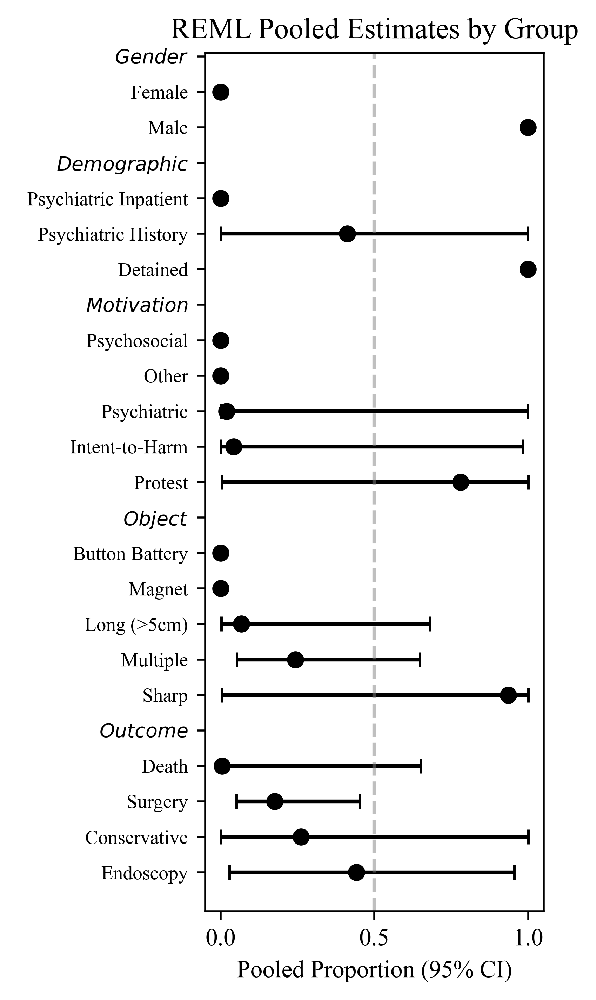

In [567]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Drop rows with missing values
plot_df = series_reml_meta_df.dropna(subset=['Pooled_Prop', 'CI_Lower', 'CI_Upper']).copy()

# Sort by group and optionally by prop within group
group_order = ['Gender', 'Age', 'Demographic', 'Motivation', 'Object', 'Outcome']
plot_df['Group'] = pd.Categorical(plot_df['Group'], categories=group_order, ordered=True)
plot_df = plot_df.sort_values(['Group', 'Pooled_Prop'])

# Prepare plotting containers
labels = []
proportions = []
ci_lowers = []
ci_uppers = []
y_pos = []

current_y = 0
for group in group_order:
    group_data = plot_df[plot_df['Group'] == group]
    if group_data.empty:
        continue

    # Add group header
    labels.append(r"$\bf{\it{" + group + "}}$")
    proportions.append(None)
    ci_lowers.append(None)
    ci_uppers.append(None)
    y_pos.append(current_y)
    current_y += 1

    # Add each variable in the group
    for _, row in group_data.iterrows():
        labels.append("  " + row['Table_Label'])
        proportions.append(row['Pooled_Prop'])
        ci_lowers.append(row['Pooled_Prop'] - row['CI_Lower'])
        ci_uppers.append(row['CI_Upper'] - row['Pooled_Prop'])
        y_pos.append(current_y)
        current_y += 1

# Convert to arrays
proportions = np.array(proportions, dtype=np.float64)
ci_lowers = np.array(ci_lowers, dtype=np.float64)
ci_uppers = np.array(ci_uppers, dtype=np.float64)

# Create the plot
fig, ax = plt.subplots(figsize=(3.3, 0.2 * len(labels) + 1))
ax.errorbar(
    proportions,
    y_pos,
    xerr=[ci_lowers, ci_uppers],
    fmt='o',
    color='black',
    ecolor='black',
    capsize=3
)

# Formatting
ax.set_yticks(y_pos)
ax.set_yticklabels(labels, fontsize=8)
ax.set_xlabel('Pooled Proportion (95% CI)')
ax.set_xlim(-0.05, 1.05)
ax.axvline(0.5, linestyle='--', color='grey', alpha=0.5)
ax.invert_yaxis()
plt.title('REML Pooled Estimates by Group')
plt.tight_layout()

# Save and show
fig_path = os.path.join(REPORT_FIGURES_DIR, "ma_series_grouped_outcomes.png")
plt.savefig(fig_path, dpi=300)
plt.show()

### Meta-regression

In [568]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

def run_univariate_meta_regression(
        df, 
        outcome_col, 
        total_col='Case_Count', 
        predictor_cols=[], 
        print_model=True):
    """
    Robust Meta-regression on study-level data:
    - Logit(Proportion outcome) ~ predictors
    - Weighted Least Squares (weights = inverse variance of logit proportion)
    
    Args:
        df (pd.DataFrame): dataframe with series-level data.
        outcome_col (str): outcome column name (count of outcome cases).
        total_col (str): total cases column name (default 'Case_Count').
        predictor_cols (list): list of predictor column names.
        print_model (bool): whether to print the model summary.

    Returns:
        meta_results_df (pd.DataFrame): dataframe of model results, or None.
    """
    meta_df = df.copy()
    
    # Compute proportion and clip
    meta_df['Prop'] = meta_df[outcome_col] / meta_df[total_col]
    meta_df['Prop'] = meta_df['Prop'].clip(0.001, 0.999)
    meta_df['Logit_Prop'] = np.log(meta_df['Prop'] / (1 - meta_df['Prop']))
    
    # Variance of logit proportion
    meta_df['Var_Logit_Prop'] = (
        1 / meta_df[outcome_col].replace(0, np.nan) +
        1 / (meta_df[total_col] - meta_df[outcome_col]).replace(0, np.nan)
    )
    
    # Drop rows with missing variance or predictors
    meta_df = meta_df.dropna(subset=['Var_Logit_Prop'])
    if predictor_cols:
        meta_df = meta_df.dropna(subset=predictor_cols)
        
        # Check for constant predictor values
        for predictor in predictor_cols:
            if meta_df[predictor].nunique(dropna=True) <= 1:
                print(f"\n⚠️  Skipping meta-regression for {outcome_col} with predictor {predictor}: predictor is constant.")
                return None

    # Skip if too few rows
    if meta_df.shape[0] < 2:
        print(f"\n⚠️  Skipping meta-regression for {outcome_col} with predictor(s) {predictor_cols}: only {meta_df.shape[0]} valid rows.")
        return None
    
    # Compute weights
    meta_df['Weight'] = 1 / meta_df['Var_Logit_Prop']
    
    # Build formula
    formula = 'Logit_Prop ~ ' + ' + '.join(predictor_cols) if predictor_cols else 'Logit_Prop ~ 1'
    
    if len(predictor_cols) >= meta_df.shape[0] - 1:
        print(f"\n⚠️  Too many predictors ({len(predictor_cols)}) vs studies ({meta_df.shape[0]}). Consider reducing predictors.")
    
    try:
        model = smf.wls(formula=formula, data=meta_df, weights=meta_df['Weight']).fit()
    except Exception as e:
        print(f"\n❌ Failed to fit model for {outcome_col} with predictor(s) {predictor_cols}: {e}")
        return None
    
    # Optionally print summary
    if print_model:
        try:
            print(f"\n=== Meta-regression for {outcome_col} ===")
            print(model.summary())
        except Exception as e:
            print(f"⚠️  Could not print summary for {outcome_col}: {e}")
    
    # Compile results
    meta_results_df = pd.DataFrame({
        'Predictor': model.params.index,
        'Coef': model.params.values,
        'StdErr': model.bse.values,
        'z': model.tvalues.values,
        'p-value': model.pvalues.values,
        'CI_lower': model.conf_int()[0].values,
        'CI_upper': model.conf_int()[1].values,
        'Outcome': outcome_col
    })
    
    return meta_results_df

In [569]:
regression_input_data = series_data_not_pooled.copy() 

unwanted_age_vars = ['Age_Yrs', 'Age_Mean', 'Age_Median', 
                     'Age_High', 'Age_Low', 'Age_<18', 'Age_18_24',
                     'Age_25_39', 'Age_40_64', 'Age_65plus']

regression_predictor_vars = [var for var in predictor_vars if var not in unwanted_age_vars]

regression_predictor_vars

['Gender_Male',
 'Gender_Female',
 'Gender_Unknown',
 'Is_Prisoner',
 'Is_Psych_Inpat',
 'Is_Displaced_Person',
 'Under_Influence_Alcohol',
 'Psych_Hx',
 'Severe_Disability_Hx',
 'Previous_Ingestions',
 'Motivation_Protest',
 'Motivation_Psychiatric',
 'Motivation_Psychosocial',
 'Motivation_Intent_To_Harm',
 'Motivation_Other',
 'Object_Sharp',
 'Object_Long',
 'Object_Multiple',
 'Object_Button_Battery',
 'Object_Magnet',
 'Object_Diameter_Large']

In [570]:
regression_results = []

# Loop over each outcome
for outcome in outcome_vars:
    print(f"\n\n============================")
    print(f"Meta-regression for {outcome}")
    print(f"============================\n")
    
    # Loop over each predictor (univariate)
    for predictor in regression_predictor_vars:
        print(f"\n--- Univariate meta-regression: {predictor} ---")
        
        res_df = run_univariate_meta_regression(
            df=regression_input_data,
            outcome_col=outcome,
            predictor_cols=[predictor],
            print_model=True
        )
        
        # ✅ Append only if result is valid
        if res_df is not None:
            regression_results.append(res_df)

# ✅ Only concatenate if we have results
if regression_results:
    regression_df = pd.concat(regression_results, ignore_index=True)

    # Filter to non-Intercept rows for LaTeX
    regression_df = regression_df[
        regression_df['Predictor'] != 'Intercept'
    ]

    regression_df = regression_df.sort_values(by='p-value', ascending=True)

else:
    print("\n⚠️ No valid regression results to combine.")
    regression_df = pd.DataFrame()



Meta-regression for Outcome_Endoscopy


--- Univariate meta-regression: Gender_Male ---

⚠️  Too many predictors (1) vs studies (2). Consider reducing predictors.

=== Meta-regression for Outcome_Endoscopy ===
                            WLS Regression Results                            
Dep. Variable:             Logit_Prop   R-squared:                       1.000
Model:                            WLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Sat, 05 Jul 2025   Prob (F-statistic):                nan
Time:                        03:54:00   Log-Likelihood:                 67.754
No. Observations:                   2   AIC:                            -131.5
Df Residuals:                       0   BIC:                            -134.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                        

In [571]:
regression_df

,Predictor,Coef,StdErr,z,p-value,CI_lower,CI_upper,Outcome
23,Motivation_Protest,-0.021264,0.000102,-207.991058,0.003061,-0.022563,-0.019965,Outcome_Surgery
27,Motivation_Intent_To_Harm,0.256901,0.054337,4.727939,0.132695,-0.433513,0.947314,Outcome_Surgery
17,Gender_Male,-0.026437,0.006677,-3.959425,0.157492,-0.111277,0.058403,Outcome_Surgery
19,Is_Prisoner,-0.026437,0.006677,-3.959425,0.157492,-0.111277,0.058403,Outcome_Surgery
29,Object_Sharp,-0.053445,0.022183,-2.409303,0.250459,-0.335306,0.228415,Outcome_Surgery
25,Motivation_Psychiatric,0.061708,0.052337,1.179061,0.447804,-0.603295,0.726712,Outcome_Surgery
21,Psych_Hx,0.026679,0.071030,0.375608,0.771260,-0.875842,0.929200,Outcome_Surgery
1,Gender_Male,0.149311,inf,0.000000,NaN,NaN,NaN,Outcome_Endoscopy
3,Is_Prisoner,0.149311,inf,0.000000,NaN,NaN,NaN,Outcome_Endoscopy
5,Psych_Hx,0.695056,inf,0.000000,NaN,NaN,NaN,Outcome_Endoscopy


In [572]:
# Only map the predictor to get its Group and Label
regression_df[['Group', 'Predictor_Label']] = regression_df['Predictor'].apply(
    lambda var: map_group_and_label(var, case_col_map)
)

# Only map outcome to get Outcome_Label (don't assign Group again!)
regression_df['Outcome_Label'] = regression_df['Outcome'].apply(
    lambda var: map_group_and_label(var, case_col_map)['Table_Label']
)

regression_df

,Predictor,Coef,StdErr,z,p-value,CI_lower,CI_upper,Outcome,Group,Predictor_Label,Outcome_Label
23,Motivation_Protest,-0.021264,0.000102,-207.991058,0.003061,-0.022563,-0.019965,Outcome_Surgery,Motivation,Protest,Surgery
27,Motivation_Intent_To_Harm,0.256901,0.054337,4.727939,0.132695,-0.433513,0.947314,Outcome_Surgery,Motivation,Intent-to-Harm,Surgery
17,Gender_Male,-0.026437,0.006677,-3.959425,0.157492,-0.111277,0.058403,Outcome_Surgery,Gender,Male,Surgery
19,Is_Prisoner,-0.026437,0.006677,-3.959425,0.157492,-0.111277,0.058403,Outcome_Surgery,Demographic,Detained,Surgery
29,Object_Sharp,-0.053445,0.022183,-2.409303,0.250459,-0.335306,0.228415,Outcome_Surgery,Object,Sharp,Surgery
25,Motivation_Psychiatric,0.061708,0.052337,1.179061,0.447804,-0.603295,0.726712,Outcome_Surgery,Motivation,Psychiatric,Surgery
21,Psych_Hx,0.026679,0.071030,0.375608,0.771260,-0.875842,0.929200,Outcome_Surgery,Demographic,Psychiatric History,Surgery
1,Gender_Male,0.149311,inf,0.000000,NaN,NaN,NaN,Outcome_Endoscopy,Gender,Male,Endoscopy
3,Is_Prisoner,0.149311,inf,0.000000,NaN,NaN,NaN,Outcome_Endoscopy,Demographic,Detained,Endoscopy
5,Psych_Hx,0.695056,inf,0.000000,NaN,NaN,NaN,Outcome_Endoscopy,Demographic,Psychiatric History,Endoscopy


In [573]:
def regression_df_to_latex_nested_v2_final_fixed3(
    df: pd.DataFrame,
    caption: str = "Univariate meta-regression results (series-level).",
    label: str = "tab:meta_regression_nested",
    table_type: str = "table*",
    table_position: str = "t",
    sig_threshold: float = 0.05,
    digits: int = 2,
    outcome_filter: str = "Surgery"
) -> str:
    # Filter relevant outcome and remove incomplete rows
    df = df[df['Outcome_Label'] == outcome_filter]
    df = df.dropna(subset=['Group', 'Predictor', 'Predictor_Label'])

    # Format regression output
    def format_cell(row):
        if pd.notnull(row['Coef']) and pd.notnull(row['CI_lower']) and pd.notnull(row['CI_upper']) and pd.notnull(row['p-value']):
            coef = f"{row['Coef']:.{digits}f}"
            lower = f"{row['CI_lower']:.{digits}f}"
            upper = f"{row['CI_upper']:.{digits}f}"
            pval = f"{row['p-value']:.3f}" if row['p-value'] >= 0.001 else "<0.001"
            val = f"{coef} [{lower}, {upper}] (p={pval})"
            if row['p-value'] < sig_threshold:
                return f"\\textbf{{{val}}}*"
            return val
        return "---"

    df['Cell'] = df.apply(format_cell, axis=1)

    # Sort the dataframe
    df = df.sort_values(by=['Group', 'Predictor', 'Predictor_Label'])

    # LaTeX header
    header = (
        f"\\begin{{{table_type}}}[{table_position}]\n"
        f"\\caption{{{caption}}}\n"
        f"\\label{{{label}}}\n"
        "\\centering\n"
        "\\begin{adjustbox}{max width=\\columnwidth}\n"
        "\\renewcommand{\\arraystretch}{1.2}\n"
        "\\small\n"
        "\\begin{tabularx}{\\columnwidth}{>{\\raggedright\\arraybackslash}p{3.0cm}>{\\centering\\arraybackslash}X}\n"        
        "\\toprule\n"
        f"\\textbf{{Variable}} & \\textbf{{{outcome_filter}}} \\\\\n"
        "\\midrule"
    )

    rows = []

    # Loop through each group (e.g., Motivation, Object)
    for group in df['Group'].dropna().unique():
        rows.append(f"\n\\multicolumn{{2}}{{l}}{{\\textit{{{group}}}}} \\\\")

        # Filter for this group
        group_df = df[df['Group'] == group]

        # Loop through predictors in this group
        for predictor in group_df['Predictor'].unique():
            predictor_df = group_df[group_df['Predictor'] == predictor]

            if len(predictor_df) == 1:
                # One row only – show flat
                label = predictor_df['Predictor_Label'].iloc[0]
                cell = predictor_df['Cell'].iloc[0]
                rows.append(f"\\hspace{{1em}}{label} & {cell} \\\\")
            else:
                # Multiple rows – nest
                predictor_title = predictor_df['Predictor_Label'].iloc[0]
                rows.append(f"\\hspace{{1em}}\\textbf{{{predictor_title}}} \\\\")
                for _, row in predictor_df.iterrows():
                    label = row['Predictor_Label']
                    cell = row['Cell']
                    rows.append(f"\\hspace{{2em}}{label} & {cell} \\\\")
            footer_note = (
                "\\multicolumn{2}{l}{\\small "
                "\\parbox[t]{\\columnwidth}{"
                "$\\beta$ = regression coefficient; CI = 95\\% confidence interval.\\\\\n"
                f"* indicates $p < {sig_threshold:.2f}$; --- = missing or unstable estimate."
                "}} \\\\"
            )

    footer = (
        f"{footer_note}\n"
        "\\bottomrule\n"
        "\\end{tabularx}\n"
        "\\end{adjustbox}\n"
        f"\\end{{{table_type}}}\n"
    )

    return header + "\n" + "\n".join(rows) + "\n" + footer

In [574]:
regression_tex_table = regression_df_to_latex_nested_v2_final_fixed3(regression_df,
                                                                     table_type="table",
                                                                     table_position='tb')
print(regression_tex_table)  # or write to file

\begin{table}[tb]
\caption{Univariate meta-regression results (series-level).}
\label{tab:meta_regression_nested}
\centering
\begin{adjustbox}{max width=\columnwidth}
\renewcommand{\arraystretch}{1.2}
\small
\begin{tabularx}{\columnwidth}{>{\raggedright\arraybackslash}p{3.0cm}>{\centering\arraybackslash}X}
\toprule
\textbf{Variable} & \textbf{Surgery} \\
\midrule

\multicolumn{2}{l}{\textit{Demographic}} \\
\hspace{1em}Detained & -0.03 [-0.11, 0.06] (p=0.157) \\
\hspace{1em}Psychiatric History & 0.03 [-0.88, 0.93] (p=0.771) \\

\multicolumn{2}{l}{\textit{Gender}} \\
\hspace{1em}Male & -0.03 [-0.11, 0.06] (p=0.157) \\

\multicolumn{2}{l}{\textit{Motivation}} \\
\hspace{1em}Intent-to-Harm & 0.26 [-0.43, 0.95] (p=0.133) \\
\hspace{1em}Protest & \textbf{-0.02 [-0.02, -0.02] (p=0.003)}* \\
\hspace{1em}Psychiatric & 0.06 [-0.60, 0.73] (p=0.448) \\

\multicolumn{2}{l}{\textit{Object}} \\
\hspace{1em}Long (>5cm) & --- \\
\hspace{1em}Multiple & --- \\
\hspace{1em}Sharp & -0.05 [-0.34, 0.23] (p=

In [575]:
table_path = os.path.join(TABLES_DIR, "meta_regression_table.tex")
with open(table_path, 'w') as f:
    f.write(regression_tex_table)
    print(regression_tex_table)
print(f"Written to: {table_path}")

\begin{table}[tb]
\caption{Univariate meta-regression results (series-level).}
\label{tab:meta_regression_nested}
\centering
\begin{adjustbox}{max width=\columnwidth}
\renewcommand{\arraystretch}{1.2}
\small
\begin{tabularx}{\columnwidth}{>{\raggedright\arraybackslash}p{3.0cm}>{\centering\arraybackslash}X}
\toprule
\textbf{Variable} & \textbf{Surgery} \\
\midrule

\multicolumn{2}{l}{\textit{Demographic}} \\
\hspace{1em}Detained & -0.03 [-0.11, 0.06] (p=0.157) \\
\hspace{1em}Psychiatric History & 0.03 [-0.88, 0.93] (p=0.771) \\

\multicolumn{2}{l}{\textit{Gender}} \\
\hspace{1em}Male & -0.03 [-0.11, 0.06] (p=0.157) \\

\multicolumn{2}{l}{\textit{Motivation}} \\
\hspace{1em}Intent-to-Harm & 0.26 [-0.43, 0.95] (p=0.133) \\
\hspace{1em}Protest & \textbf{-0.02 [-0.02, -0.02] (p=0.003)}* \\
\hspace{1em}Psychiatric & 0.06 [-0.60, 0.73] (p=0.448) \\

\multicolumn{2}{l}{\textit{Object}} \\
\hspace{1em}Long (>5cm) & --- \\
\hspace{1em}Multiple & --- \\
\hspace{1em}Sharp & -0.05 [-0.34, 0.23] (p=

### Case Summary Table

In [576]:
import pandas as pd
import numpy as np
import os

def create_case_summary_table(
    df,
    label='Variable',
    citekey_col="Citekey",
    label_map=case_col_map,
    type='df',
    group_order=['Age', 'Age Group', 'Gender', 'Demographic', 'Motivation', 'Object', 'Outcome'],
    sort_val='Count',
    caption="Case-level summary statistics.",
    tex_table_type='table*',
    tex_table_position='!t',
    tex_table_label='tab:case_summary',
    column_spec="p{4cm} p{1.5cm} p{2cm} X",
    hide=None
):
    if hide is None:
        hide = []

    # Derive predictor and outcome vars from case_col_map
    predictor_vars = [var for group in label_map['Predictors'].values() for var in group]
    outcome_vars = list(label_map['Outcomes'].keys())

    # Exclude hidden variables
    predictor_vars = [v for v in predictor_vars if v not in hide]
    outcome_vars = [v for v in outcome_vars if v not in hide]

    # Remove age scalar vars from binary predictors
    predictor_vars_no_age = [v for v in predictor_vars if not v.startswith(('Age_Min', 'Age_Max', 'Age_Mean', 'Age_Median', 'Age_IQR'))]

    # Compute binary summaries
    summary_df = df[predictor_vars_no_age + outcome_vars].sum()
    summary_df['Case_Count'] = df['Patient_ID'].nunique()

    # Compute age scalar summaries
    age_series = df['Age_Yrs'].dropna()
    summary_df['Age_Mean'] = round(age_series.mean(), 2)
    summary_df['Age_Median'] = round(age_series.median(), 2)
    summary_df['Age_IQR'] = round(age_series.quantile(0.75) - age_series.quantile(0.25), 2)
    summary_df['Age_Min'] = round(age_series.min(), 2)
    summary_df['Age_Max'] = round(age_series.max(), 2)

    # Citekey map
    citekey_map = {var: ', '.join(sorted(df.loc[df[var] == 1, citekey_col].dropna().unique())) for var in predictor_vars_no_age}
    
    # Convert to DataFrame
    summary_df = summary_df.to_frame(name='Count')
    summary_df['Citekeys'] = summary_df.index.map(citekey_map.get)

    # Identify age-related rows
    age_rows = [idx for idx in summary_df.index if idx.startswith('Age_')]

    # Percent column
    summary_df['Percent'] = None
    summary_df.loc[
        ~summary_df.index.isin(age_rows + ['Case_Count']),
        'Percent'
    ] = (
        summary_df['Count'] / summary_df.loc['Case_Count', 'Count'] * 100
    ).round(1)

    # Add citekeys for min and max age
    min_citekeys = df.loc[df['Age_Yrs'] == age_series.min(), citekey_col].dropna().unique()
    max_citekeys = df.loc[df['Age_Yrs'] == age_series.max(), citekey_col].dropna().unique()
    summary_df.loc['Age_Min', 'Citekeys'] = ', '.join(sorted(min_citekeys))
    summary_df.loc['Age_Max', 'Citekeys'] = ', '.join(sorted(max_citekeys))

    # Build label and group maps
    var_label_map, var_group_map = {}, {}
    for group, vars in label_map.get('Predictors', {}).items():
        for var, meta in vars.items():
            var_label_map[var] = meta['Table']
            var_group_map[var] = group
    for var, meta in label_map.get('Outcomes', {}).items():
        var_label_map[var] = meta['Table']
        var_group_map[var] = 'Outcome'

    # Label and group columns
    summary_df['Label'] = summary_df.index.map(lambda x: var_label_map.get(x, x))
    summary_df['Group'] = summary_df.index.map(lambda x: var_group_map.get(x, 'Other'))

    # Tex-safe label
    def escape_maths(val):
        if isinstance(val, str):
            return val.replace('>', r'\textgreater{}').replace('<', r'\textless{}')
        return val
    summary_df['Tex_Label'] = summary_df['Label'].apply(escape_maths)

    # Format citekeys
    def citekey_to_tex(val):
        if isinstance(val, str):
            return rf'\cite{{{val}}}'
        elif isinstance(val, list):
            return rf'\cite{{{",".join(val)}}}'
        elif pd.isna(val):
            return ''
        return val
    summary_df['Citekey_Tex'] = summary_df['Citekeys'].apply(citekey_to_tex)

    summary_df = summary_df[~summary_df.index.isin(['Age_Yrs'])]

    # Sort
    summary_df['Group'] = pd.Categorical(summary_df['Group'], categories=group_order, ordered=True)
    summary_df = summary_df.sort_values(by=['Group', sort_val], ascending=[True, False])

    if type == 'df':
        return summary_df[['Group', 'Label', 'Count', 'Percent', 'Tex_Label', 'Citekeys', 'Citekey_Tex']]

    # Build LaTeX
    column_headers = " & ".join(["\\textbf{Count}", "\\textbf{Percentage}", "\\textbf{References}"])
    header = (
        f"\\begin{{{tex_table_type}}}[{tex_table_position}]\n"
        f"\\caption{{{caption}}}\n"
        f"\\label{{{tex_table_label}}}\n"
        "\\centering\n"
        "\\begin{adjustbox}{width=\\textwidth}\n"
        "\\renewcommand{\\arraystretch}{1.2}\n"
        "\\small\n"
        f"\\begin{{tabularx}}{{\\textwidth}}{{{column_spec}}}\n"
        "\\toprule\n"
        f"\\textbf{{Variable}} & {column_headers} \\\\\n"
        "\\midrule\n"
    )

    rows = []
    for group in summary_df['Group'].dropna().unique():
        group_df = summary_df[summary_df['Group'] == group]
        group_heading = str(group).title()
        rows.append(f"\\multicolumn{{4}}{{l}}{{\\textit{{{group_heading}}}}} \\\\ ")

        for _, row in group_df.iterrows():
            label = f"\\mbox{{\\hspace{{1em}}{row['Tex_Label']}}}"
            count = int(row.get('Count', 0))
            percent = f"{float(row['Percent']):.0f}\\%" if pd.notna(row['Percent']) else ''
            refs = row.get('Citekey_Tex', '')
            rows.append(f"{label} & {count} & {percent} & {refs} \\\\")

    footer = (
        r'\bottomrule',
        r'\end{tabularx}',
        r'\end{adjustbox}',
        fr'\end{{{tex_table_type}}}'
    )

    return header + "\n" + "\n".join(rows) + "\n" + "\n".join(footer)

table = create_case_summary_table(
    df=case_data,
    type='tex',
    label='tab:case_report_data'
)

table_path = os.path.join(TABLES_DIR, "case_report_table.tex")
with open(table_path, 'w') as f:
    f.write(table)

print(table)

\begin{table*}[!t]
\caption{Case-level summary statistics.}
\label{tab:case_summary}
\centering
\begin{adjustbox}{width=\textwidth}
\renewcommand{\arraystretch}{1.2}
\small
\begin{tabularx}{\textwidth}{p{4cm} p{1.5cm} p{2cm} X}
\toprule
\textbf{Variable} & \textbf{Count} & \textbf{Percentage} & \textbf{References} \\
\midrule

\multicolumn{4}{l}{\textit{Age}} \\ 
\mbox{\hspace{1em}Max} & 100 &  & \cite{Li_2013} \\
\mbox{\hspace{1em}Mean} & 30 &  &  \\
\mbox{\hspace{1em}Median} & 28 &  &  \\
\mbox{\hspace{1em}IQR} & 18 &  &  \\
\mbox{\hspace{1em}Min} & 7 &  & \cite{Liu_2005, Ohno_2005} \\
\multicolumn{4}{l}{\textit{Age Group}} \\ 
\mbox{\hspace{1em}Adult (25–39)} & 25 &  & \cite{Alao_2006i, Ali_2022g, Apikotoa_2022f, Ataya_2013, Benoist_2019e, Bhasin_2014, Chang_2017f, Cox_2007, DelgadoSalazar_2020c, Farhadi_2024h, Fry_2010, Gardner_2017h, Guinan_2019f, Jin_2023, Kumar_2019f, Losanoff_1996, Misra_2013, Qureshi_2016, Riva_2018j, Sakellaridis_2008f, Tammana_2012j, Trgo_2012f, Wnęk_2015f, 

### Forest Plots

In [577]:
pooled_results_df

,Variable,523_Count,581_Count,646_Count,Case_Series_Count,Group,523_Percentage,581_Percentage,646_Percentage,Case_Series_Percentage,...,CI_Upper_Pct_Difference,I2_Abs_Difference,I2_Rel_Difference,I2_Pct_Difference,Tau2_Abs_Difference,Tau2_Rel_Difference,Tau2_Pct_Difference,N_Studies_Abs_Difference,N_Studies_Rel_Difference,N_Studies_Pct_Difference
0,Age_18_24,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Age_25_39,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Age_40_64,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Age_65plus,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Age_<18,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Age_IQR,NaN,NaN,NaN,NaN,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Age_Max,40.0,50.0,27.0,50.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Age_Mean,24.0,NaN,24.0,24.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Age_Median,NaN,35.0,NaN,35.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Age_Min,17.0,25.0,19.0,17.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [578]:

pooled_results_df['Variable_Label'] = pooled_results_df['Variable'].apply(
    lambda var: map_group_and_label(var=var, case_cols_dict=case_col_map, label_type='Table')['Table_Label']
)

pooled_results_df

,Variable,523_Count,581_Count,646_Count,Case_Series_Count,Group,523_Percentage,581_Percentage,646_Percentage,Case_Series_Percentage,...,I2_Abs_Difference,I2_Rel_Difference,I2_Pct_Difference,Tau2_Abs_Difference,Tau2_Rel_Difference,Tau2_Pct_Difference,N_Studies_Abs_Difference,N_Studies_Rel_Difference,N_Studies_Pct_Difference,Variable_Label
0,Age_18_24,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Young Adult (18–24)
1,Age_25_39,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Adult (25–39)
2,Age_40_64,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Middle-Aged (40–64)
3,Age_65plus,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Older Adult (65+)
4,Age_<18,NaN,NaN,NaN,NaN,Age Group,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Child/Adolescent (<18)
5,Age_IQR,NaN,NaN,NaN,NaN,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IQR
6,Age_Max,40.0,50.0,27.0,50.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Max
7,Age_Mean,24.0,NaN,24.0,24.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mean
8,Age_Median,NaN,35.0,NaN,35.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Median
9,Age_Min,17.0,25.0,19.0,17.0,Age,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Min


In [579]:
import forestplot as fp
pooled_results_df.columns

Index(['Variable', '523_Count', '581_Count', '646_Count', 'Case_Series_Count',
       'Group', '523_Percentage', '581_Percentage', '646_Percentage',
       'Case_Series_Percentage', '523_Weighted', '581_Weighted',
       '646_Weighted', 'Case_Report_Count', 'Case_Report_Percentage',
       'Pooled_Count', 'Pooled_Percentage', 'Case_Series_MA_Pooled_Prop',
       'Case_Series_MA_CI_Lower', 'Case_Series_MA_CI_Upper',
       'Case_Series_MA_I2', 'Case_Series_MA_Tau2', 'Case_Series_MA_N_Studies',
       'Case_Series_MA_Citekeys', 'Aggregate_MA_Pooled_Prop',
       'Aggregate_MA_CI_Lower', 'Aggregate_MA_CI_Upper', 'Aggregate_MA_I2',
       'Aggregate_MA_Tau2', 'Aggregate_MA_N_Studies', 'Aggregate_MA_Citekeys',
       'Table_Label', 'Pooled_Prop_Abs_Difference',
       'Pooled_Prop_Rel_Difference', 'Pooled_Prop_Pct_Difference',
       'CI_Lower_Abs_Difference', 'CI_Lower_Rel_Difference',
       'CI_Lower_Pct_Difference', 'CI_Upper_Abs_Difference',
       'CI_Upper_Rel_Difference', 'CI_Upper_

In [580]:
def categorise_heterogeneity(i2_value):
    if pd.isna(i2_value):
        return "Unknown"
    elif i2_value <= 25:
        return "Low"
    elif i2_value <= 50:
        return "Moderate"
    elif i2_value <= 75:
        return "Substantial"
    else:
        return "Considerable"

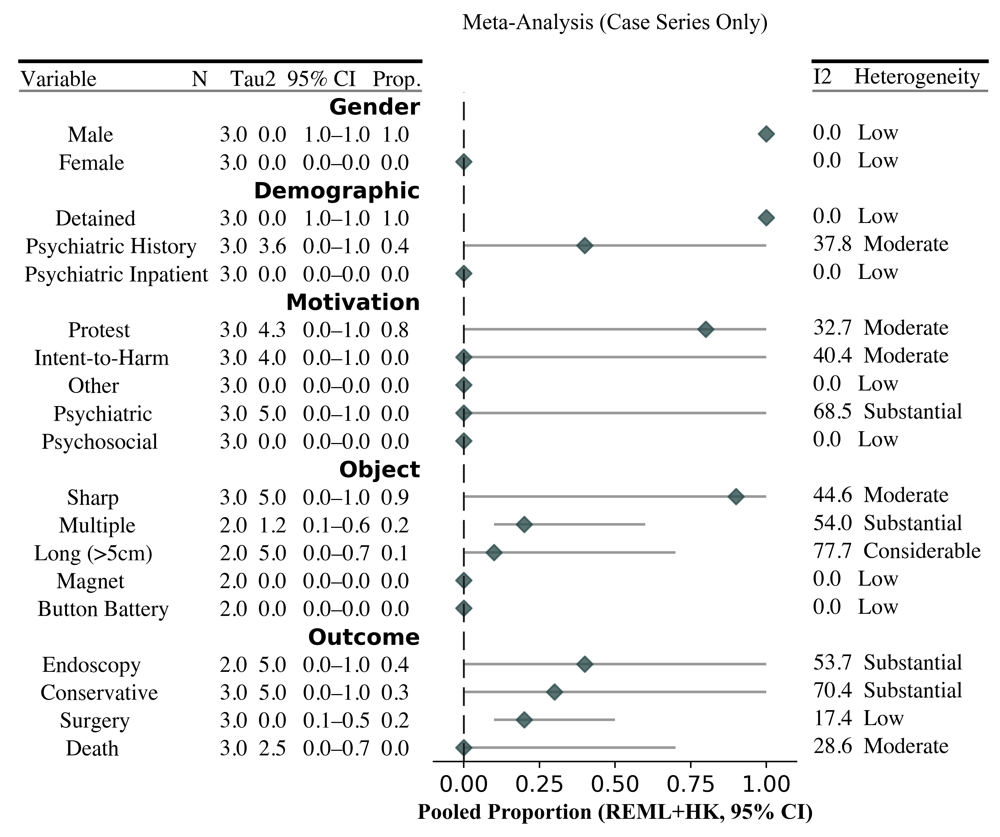

In [581]:
forest_plot_df = pooled_results_df.dropna(
    subset=[
        'Case_Series_MA_Pooled_Prop',
        'Case_Series_MA_CI_Lower',
        'Case_Series_MA_CI_Upper'
    ]
)

forest_plot_df['Case_Series_MA_95_CI_Joined'] = forest_plot_df['Case_Series_MA_95_CI_Joined'] = forest_plot_df.apply(
    lambda row: f"{row['Case_Series_MA_CI_Lower']:.1f}–{row['Case_Series_MA_CI_Upper']:.1f}",
    axis=1
)

forest_plot_df['Case_Series_MA_Heterogeneity_Category'] = forest_plot_df['Case_Series_MA_I2'].apply(categorise_heterogeneity)

forest_plot_df = forest_plot_df.round(1)


fp.forestplot(forest_plot_df,
              estimate='Case_Series_MA_Pooled_Prop',
              ll='Case_Series_MA_CI_Lower',
              hl='Case_Series_MA_CI_Upper',
              varlabel='Variable_Label',
              figsize=(3.5, 7),
              form_ci_report=True,
              flush=False,
              xticks=[0, 0.25, 0.5, 0.75, 1.0],
              xlim=(-0.1, 1.1),
              groupvar='Group',
              group_order=['Gender', 'Demographic', 'Motivation', 'Object', 'Outcome'],
              annote=['Case_Series_MA_N_Studies', 'Case_Series_MA_Tau2', 'Case_Series_MA_95_CI_Joined', 'Case_Series_MA_Pooled_Prop'],
              annoteheaders=["N", "Tau2", '95% CI', 'Prop.'],
              moerror='Case_Series_MA_95_CI_Joined',
              xlabel="Pooled Proportion (REML+HK, 95% CI)",
              decimal_precision=2,
              rightannote=['Case_Series_MA_I2', 'Case_Series_MA_Heterogeneity_Category'],
              right_annoteheaders=["I2", "Heterogeneity"],
              sort=True,
              table=True,
              fontfamily='times',
              annote_fontsize='times',
               **{"marker": "D",  # set maker symbol as diamond
                 "markersize": 35,  # adjust marker size
                 "xlinestyle": (0, (10, 5)),  # long dash for x-reference line 
                 "xlinecolor": ".1",  # gray color for x-reference line
                 "xtick_size": 12,
                  "fontsize": 12  # adjust x-ticker fontsize
                }
)
plt.title("Meta-Analysis (Case Series Only)")
plt.tight_layout()  
plot_path = os.path.join(REPORT_FIGURES_DIR, 'ma_series_only_plot.png')
plt.savefig(plot_path, bbox_inches='tight')


In [582]:
case_data_age_40_64 = case_data[case_data['Age_40_64']]

case_data_age_40_64[case_data_age_40_64['Outcome_Death'] == 1]['Citekey']


49       Kumar_2001
70    Emamhadi_2018
Name: Citekey, dtype: object

In [583]:
forest_plot_df['Variable_Label']

12                   Female
13                     Male
16                 Detained
17    Psychiatric Inpatient
18           Intent-to-Harm
19                    Other
20                  Protest
21              Psychiatric
22             Psychosocial
23           Button Battery
25              Long (>5cm)
26                   Magnet
27                 Multiple
28                    Sharp
30             Conservative
31                    Death
32                Endoscopy
33                  Surgery
35      Psychiatric History
Name: Variable_Label, dtype: object

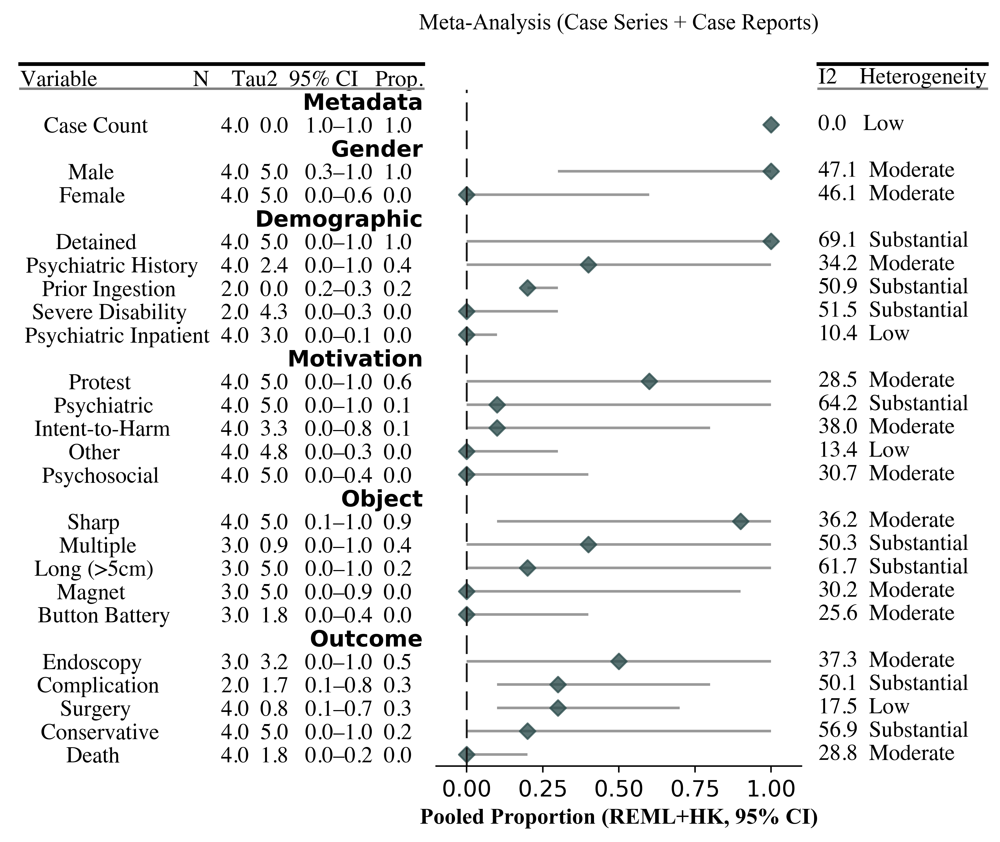

In [584]:
valid_group_order = [g for g in ['Gender', 'Demographic', 'Motivation', 'Object', 'Outcome']
                     if g in forest_plot_df['Group'].unique()]

forest_plot_df = pooled_results_df.copy()

forest_plot_df = pooled_results_df.dropna(
    subset=[
        'Aggregate_MA_Pooled_Prop',
        'Aggregate_MA_CI_Lower',
        'Aggregate_MA_CI_Upper'
    ]
)

forest_plot_df['Aggregate_MA_95_CI_Joined'] = forest_plot_df['Aggregate_MA_95_CI_Joined'] = forest_plot_df.apply(
    lambda row: f"{row['Aggregate_MA_CI_Lower']:.1f}–{row['Aggregate_MA_CI_Upper']:.1f}",
    axis=1
)

forest_plot_df['Aggregate_MA_Heterogeneity_Category'] = forest_plot_df['Aggregate_MA_I2'].apply(categorise_heterogeneity)

forest_plot_df = forest_plot_df.round(1)

fp.forestplot(
    forest_plot_df,
    estimate='Aggregate_MA_Pooled_Prop',
    ll='Aggregate_MA_CI_Lower',
    hl='Aggregate_MA_CI_Upper',
    varlabel='Variable_Label',
    figsize=(3.5, 7),
    form_ci_report=True,
    flush=False,
    xticks=[0, 0.25, 0.5, 0.75, 1.0],
    xlim=(-0.1, 1.1),
    groupvar='Group',
    group_order=['Metadata', 'Gender', 'Demographic', 'Motivation', 'Object', 'Outcome'],
    annote=['Aggregate_MA_N_Studies', 'Aggregate_MA_Tau2', 'Aggregate_MA_95_CI_Joined', 'Aggregate_MA_Pooled_Prop'],
    annoteheaders=["N", "Tau2", '95% CI', 'Prop.'],
    moerror='Aggregate_MA_95_CI_Joined',
    xlabel="Pooled Proportion (REML+HK, 95% CI)",
    decimal_precision=2,
    rightannote=['Aggregate_MA_I2', 'Aggregate_MA_Heterogeneity_Category'],
    right_annoteheaders=["I2", "Heterogeneity"],
    sort=True,
    table=True,
    fontfamily='times',
    annote_fontsize='times',
    **{
        "marker": "D",  # set marker symbol as diamond
        "markersize": 35,
        "xlinestyle": (0, (10, 5)),
        "xlinecolor": ".1",
        "xtick_size": 12,
        "fontsize": 12
    }
)

plt.title("Meta-Analysis (Case Series + Case Reports)")
plt.tight_layout()  
plot_path = os.path.join(REPORT_FIGURES_DIR, 'ma_all_plot.png')
plt.savefig(plot_path, bbox_inches='tight')

## Discussion